# Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv1D, MaxPooling1D, LSTM, Bidirectional, Dense, Dropout, Input, Flatten, Concatenate, Add

In [ ]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve, auc

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [ ]:
from tensorflow.keras.optimizers import Adam

## Final Data Prepare

In [ ]:
same_df = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/same_final.csv')
int_df = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/int_final.csv')

In [ ]:
same_df['Date'] = pd.to_datetime(same_df['Date'])
int_df['Date'] = pd.to_datetime(int_df['Date'])

In [ ]:
boolean_columns = [
    "Covid19",
    "US_President_Republican",
    "US_President_Democratic",
    "KR_President_Democratic",
    "KR_President_Conservative",
    "KR_President_Neutral"
]

same_df[boolean_columns] = same_df[boolean_columns].astype(bool)
int_df[boolean_columns] = int_df[boolean_columns].astype(bool)

# Set Index
same_df.set_index('Date', inplace = True)
int_df.set_index('Date', inplace = True)

# Normalization
features = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction','SE_Operating_Profit', 'SE_Net_Profit', 'SE_Total_Equity',
       'SE_Total_Liabilities', 'SE_Revenue', 'SE_Foreign', 'US_Inflation', 'KR_Inflation', 'CN_Inflation', 'US_GDP_Annual', 'KR_GDP_Annual',
       'CN_GDP_Annual', 'US_Economic_Growth_Rate', 'KR_Economic_Growth_Rate', 'US_Base', 'US_10', 'KR_Base', 'KR_10', 'WTI', 'Exchange', 'SOX_Close',
       'Phone', 'KR_Unemployment', 'Covid19', 'US_President_Republican', 'US_President_Democratic', 'KR_President_Democratic', 'KR_President_Conservative', 'KR_President_Neutral',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1', 'Lag_30', 'Lag_60', 'Lag_90']
target = ['Close']

x_train_same = same_df[features][:3518].values
y_train_same = same_df[target][:3518].values

x_val_same = same_df[features][3518:4691].values
y_val_same = same_df[target][3518:4691].values

x_test_same = same_df[features][4691:].values
y_test_same = same_df[target][4691:].values

x_scaler_same_df, y_scaler_same_df = MinMaxScaler(), MinMaxScaler()

x_train_same = x_scaler_same_df.fit_transform(x_train_same)
y_train_same = y_scaler_same_df.fit_transform(y_train_same.reshape(-1, 1))

x_val_same = x_scaler_same_df.transform(x_val_same)
y_val_same = y_scaler_same_df.transform(y_val_same.reshape(-1, 1))

x_test_same = x_scaler_same_df.transform(x_test_same)
y_test_same = y_scaler_same_df.transform(y_test_same.reshape(-1, 1))

In [ ]:
x_train_int = int_df[features][:3518].values
y_train_int = int_df[target][:3518].values

x_val_int = int_df[features][3518:4691].values
y_val_int = int_df[target][3518:4691].values

x_test_int = int_df[features][4691:].values
y_test_int = int_df[target][4691:].values

x_scaler_int_df, y_scaler_int_df = MinMaxScaler(), MinMaxScaler()

x_train_int = x_scaler_int_df.fit_transform(x_train_int)
y_train_int = y_scaler_int_df.fit_transform(y_train_int.reshape(-1, 1))

x_val_int = x_scaler_int_df.transform(x_val_int)
y_val_int = y_scaler_int_df.transform(y_val_int.reshape(-1, 1))

x_test_int = x_scaler_int_df.transform(x_test_int)
y_test_int = y_scaler_int_df.transform(y_test_int.reshape(-1, 1))

### Feature Selection

In [ ]:
features0_same = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction','US_10',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1']

features0_int = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction', 'US_10', 'SOX_Close',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1', 'Lag_60', 'Lag_90']

In [ ]:
len(features0_int)

17

In [ ]:
selected_x_train_same = same_df[features0_same][:3518].values
selected_y_train_same = same_df[target][:3518].values

selected_x_val_same = same_df[features0_same][3518:4691].values
selected_y_val_same = same_df[target][3518:4691].values

selected_x_test_same = same_df[features0_same][4691:].values
selected_y_test_same = same_df[target][4691:].values

x_scaler_selected_same_df, y_scaler_selected_same_df = MinMaxScaler(), MinMaxScaler()

selected_x_train_same = x_scaler_selected_same_df.fit_transform(selected_x_train_same)
selected_y_train_same = y_scaler_selected_same_df.fit_transform(selected_y_train_same.reshape(-1, 1))

selected_x_val_same = x_scaler_selected_same_df.transform(selected_x_val_same)
selected_y_val_same = y_scaler_selected_same_df.transform(selected_y_val_same.reshape(-1, 1))

selected_x_test_same = x_scaler_selected_same_df.transform(selected_x_test_same)
selected_y_test_same = y_scaler_selected_same_df.transform(selected_y_test_same.reshape(-1, 1))

In [ ]:
selected_x_train_int = int_df[features0_int][:3518].values
selected_y_train_int = int_df[target][:3518].values

selected_x_val_int = int_df[features0_int][3518:4691].values
selected_y_val_int = int_df[target][3518:4691].values

selected_x_test_int = int_df[features0_int][4691:].values
selected_y_test_int = int_df[target][4691:].values

x_scaler_selected_int_df, y_scaler_selected_int_df = MinMaxScaler(), MinMaxScaler()

selected_x_train_int = x_scaler_selected_int_df.fit_transform(selected_x_train_int)
selected_y_train_int = y_scaler_selected_int_df.fit_transform(selected_y_train_int.reshape(-1, 1))

selected_x_val_int = x_scaler_selected_int_df.transform(selected_x_val_int)
selected_y_val_int = y_scaler_selected_int_df.transform(selected_y_val_int.reshape(-1, 1))

selected_x_test_int = x_scaler_selected_int_df.transform(selected_x_test_int)
selected_y_test_int = y_scaler_selected_int_df.transform(selected_y_test_int.reshape(-1, 1))

In [ ]:
selected_x_train_int.shape

(3518, 17)

In [ ]:
print(x_scaler_selected_int_df.n_features_in_)

17


## Without Outlier Process Data Prepare

In [ ]:
same_wo = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/same_no_outlier.csv')
int_wo = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/int_no_outlier.csv')

In [ ]:
boolean_columns = [
    "Covid19",
    "US_President_Republican",
    "US_President_Democratic",
    "KR_President_Democratic",
    "KR_President_Conservative",
    "KR_President_Neutral"
]

same_wo[boolean_columns] = same_wo[boolean_columns].astype(bool)
int_wo[boolean_columns] = int_wo[boolean_columns].astype(bool)

# Set Index
same_wo.set_index('Date', inplace = True)
int_wo.set_index('Date', inplace = True)

# Normalization
features = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction','SE_Operating_Profit', 'SE_Net_Profit', 'SE_Total_Equity',
       'SE_Total_Liabilities', 'SE_Revenue', 'SE_Foreign', 'US_Inflation', 'KR_Inflation', 'CN_Inflation', 'US_GDP_Annual', 'KR_GDP_Annual',
       'CN_GDP_Annual', 'US_Economic_Growth_Rate', 'KR_Economic_Growth_Rate', 'US_Base', 'US_10', 'KR_Base', 'KR_10', 'WTI', 'Exchange', 'SOX_Close',
       'Phone', 'KR_Unemployment', 'Covid19', 'US_President_Republican', 'US_President_Democratic', 'KR_President_Democratic', 'KR_President_Conservative', 'KR_President_Neutral',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1', 'Lag_30', 'Lag_60', 'Lag_90']
target = ['Close']

x_train_same_wo = same_wo[features][:3518].values
y_train_same_wo = same_wo[target][:3518].values

x_val_same_wo = same_wo[features][3518:4691].values
y_val_same_wo = same_wo[target][3518:4691].values

x_test_same_wo = same_wo[features][4691:].values
y_test_same_wo = same_wo[target][4691:].values

x_scaler_same_wo, y_scaler_same_wo = MinMaxScaler(), MinMaxScaler()

x_train_same_wo = x_scaler_same_wo.fit_transform(x_train_same_wo)
y_train_same_wo = y_scaler_same_wo.fit_transform(y_train_same_wo.reshape(-1, 1))

x_val_same_wo = x_scaler_same_wo.transform(x_val_same_wo)
y_val_same_wo = y_scaler_same_wo.transform(y_val_same_wo.reshape(-1, 1))

x_test_same_wo = x_scaler_same_wo.transform(x_test_same_wo)
y_test_same_wo = y_scaler_same_wo.transform(y_test_same_wo.reshape(-1, 1))

In [ ]:
x_train_int_wo = int_wo[features][:35188].values
y_train_int_wo = int_wo[target][:3518].values

x_val_int_wo = int_wo[features][3518:4691].values
y_val_int_wo = int_wo[target][3518:4691].values

x_test_int_wo = int_wo[features][4691:].values
y_test_int_wo = int_wo[target][4691:].values

x_scaler_int_wo, y_scaler_int_wo = MinMaxScaler(), MinMaxScaler()

x_train_int_wo = x_scaler_int_wo.fit_transform(x_train_int_wo)
y_train_int_wo = y_scaler_int_wo.fit_transform(y_train_int_wo.reshape(-1, 1))

x_val_int_wo = x_scaler_int_wo.transform(x_val_int_wo)
y_val_int_wo = y_scaler_int_wo.transform(y_val_int_wo.reshape(-1, 1))

x_test_int_wo = x_scaler_int_wo.transform(x_test_int_wo)
y_test_int_wo = y_scaler_int_wo.transform(y_test_int_wo.reshape(-1, 1))

### Feature Selection

In [ ]:
features2_same = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction', 'WTI', 'Exchange', 'SOX_Close',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1', 'Lag_30']

features2_int = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction', 'SOX_Close',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1']

In [ ]:
selected_x_train_same_wo = same_wo[features2_same][:3518].values
selected_y_train_same_wo = same_wo[target][:3518].values

selected_x_val_same_wo = same_wo[features2_same][3518:4691].values
selected_y_val_same_wo = same_wo[target][3518:4691].values

selected_x_test_same_wo = same_wo[features2_same][4691:].values
selected_y_test_same_wo = same_wo[target][4691:].values

x_scaler_selected_same_wo, y_scaler_selected_same_wo = MinMaxScaler(), MinMaxScaler()

selected_x_train_same_wo = x_scaler_selected_same_wo.fit_transform(selected_x_train_same_wo)
selected_y_train_same_wo = y_scaler_selected_same_wo.fit_transform(selected_y_train_same_wo.reshape(-1, 1))

selected_x_val_same_wo = x_scaler_selected_same_wo.transform(selected_x_val_same_wo)
selected_y_val_same_wo = y_scaler_selected_same_wo.transform(selected_y_val_same_wo.reshape(-1, 1))

selected_x_test_same_wo = x_scaler_selected_same_wo.transform(selected_x_test_same_wo)
selected_y_test_same_wo = y_scaler_selected_same_wo.transform(selected_y_test_same_wo.reshape(-1, 1))

In [ ]:
selected_x_train_int_wo = int_wo[features2_int][:3518].values
selected_y_train_int_wo = int_wo[target][:3518].values

selected_x_val_int_wo = int_wo[features2_int][3518:4691].values
selected_y_val_int_wo = int_wo[target][3518:4691].values

selected_x_test_int_wo = int_wo[features2_int][4691:].values
selected_y_test_int_wo = int_wo[target][4691:].values

x_scaler_selected_int_wo, y_scaler_selected_int_wo = MinMaxScaler(), MinMaxScaler()

selected_x_train_int_wo = x_scaler_selected_int_wo.fit_transform(selected_x_train_int_wo)
selected_y_train_int_wo = y_scaler_selected_int_wo.fit_transform(selected_y_train_int_wo.reshape(-1, 1))

selected_x_val_int_wo = x_scaler_selected_int_wo.transform(selected_x_val_int_wo)
selected_y_val_int_wo = y_scaler_selected_int_wo.transform(selected_y_val_int_wo.reshape(-1, 1))

selected_x_test_int_wo = x_scaler_selected_int_wo.transform(selected_x_test_int_wo)
selected_y_test_int_wo = y_scaler_selected_int_wo.transform(selected_y_test_int_wo.reshape(-1, 1))

In [ ]:
features4_same = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction','SE_Foreign','US_10', 'Exchange',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1', 'Lag_30', 'Lag_90']

features4_int = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction', 'US_Economic_Growth_Rate', 'KR_Economic_Growth_Rate', 'SOX_Close',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1']

# Model Setting

In [ ]:
!pip install wandb -qU

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 60.9 MB/s eta 0:00:00


In [ ]:
!pip install tensorflow

In [ ]:
import wandb
from wandb.integration.keras import WandbCallback

In [ ]:
wandb.login(key='b0f579d1228ea5f3cfac162435df78243cadca62')

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: yebin. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [ ]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU is set to be used.")
    except RuntimeError as e:
        print(f"Error setting GPU memory growth: {e}")
else:
    print("No GPU found. Using CPU instead.")

GPU is set to be used.


In [ ]:
def create_sequences(X, y, time_steps):
    sequences, labels = [], []
    for i in range(len(X) - time_steps):
        sequences.append(X[i:i+time_steps])
        labels.append(y[i+time_steps])
    return np.array(sequences), np.array(labels)

def rmse_metric(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred)))

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Layer

class Attention(Layer):
    def __init__(self, **kwargs):
        super(Attention, self).__init__(**kwargs)

    def build(self, input_shape):
        self.W = self.add_weight(name='attention_weight', shape=(input_shape[-1], input_shape[-1]),
                                 initializer='random_normal', trainable=True)
        self.b = self.add_weight(name='attention_bias', shape=(input_shape[-1],),
                                 initializer='zeros', trainable=True)
        self.V = self.add_weight(name='attention_score', shape=(input_shape[-1], 1),
                                 initializer='random_normal', trainable=True)

    def call(self, inputs):
        # Attention mechanism
        score = tf.nn.tanh(tf.tensordot(inputs, self.W, axes=1) + self.b)
        attention_weights = tf.nn.softmax(tf.tensordot(score, self.V, axes=1), axis=1)
        context_vector = attention_weights * inputs
        context_vector = tf.reduce_sum(context_vector, axis=1)
        return context_vector

In [ ]:
class MultiHeadAttentionLayer(tf.keras.layers.Layer):
    def __init__(self, num_heads, key_dim):
        super(MultiHeadAttentionLayer, self).__init__()
        self.attention = tf.keras.layers.MultiHeadAttention(num_heads=num_heads, key_dim=key_dim)

    def call(self, query, value):
        return self.attention(query=query, value=value, key=value)

In [ ]:
early_stopping = EarlyStopping(
    monitor='val_loss',  # 모니터할 지표 (예: 'val_loss' 또는 'val_rmse')
    patience=5,          # 성능 향상이 없는 epoch 수 (5번 동안 개선 없으면 중단)
    restore_best_weights=True,  # 가장 성능이 좋은 가중치를 복원
    mode = 'min'
    #verbose=1            # 로그 출력 여부
)

# Final - Same

##### Initial

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▅▄▄▅▄▃▃▃▂▂▂▂▂▁▁▂▃▂▂▂▂▂▂▃▂▄▃▃▄▃▁▃▃▂▂▄▂▂▃
val_mse,█▅▄▄▅▂▃▃▃▂▂▂▂▁▃▂▃▂▂▂▂▂▂▃▂▄▃▃▄▂▁▃▃▂▃▂▄▂▂▃
epoch,50
train_loss,0.00015
train_mse,0.00015
val_loss,0.02475
val_mse,0.02475


In [ ]:
wandb.init(project="LSTM Fin - Same", name="initial", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/Initial.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
    #verbose=1
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same, y_train_same, time_steps)
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

model_same_init = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),
    tf.keras.layers.Dense(1)
])

model_same_init.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_init.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_init.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0353 - mse: 0.0353 - val_loss: 0.0185 - val_mse: 0.0185
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 4.3700e-04 - mse: 4.3700e-04 - val_loss: 0.0150 - val_mse: 0.0150
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 3.4728e-04 - mse: 3.4728e-04 - val_loss: 0.0158 - val_mse: 0.0158
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 3.7743e-04 - mse: 3.7743e-04 - val_loss: 0.0161 - val_mse: 0.0161
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.5229e-04 - mse: 2.5229e-04 - val_loss: 0.0184 - val_mse: 0.0184
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.6225e-04 - mse: 2.6225e-04 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.0572e-04 - mse: 2.0572e-04 - val_loss: 0.0220 - val_mse: 0.0220
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 2.4673e-04 - mse: 2.4673e-04 - val_loss: 0.0159 - val_mse:

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                        │ (None, 90, 64)              │          28,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 183,749 (717.77 KB)

 Trainable params: 61,249 (239.25 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 122,500 (478.52 KB)

Train VS Val loss

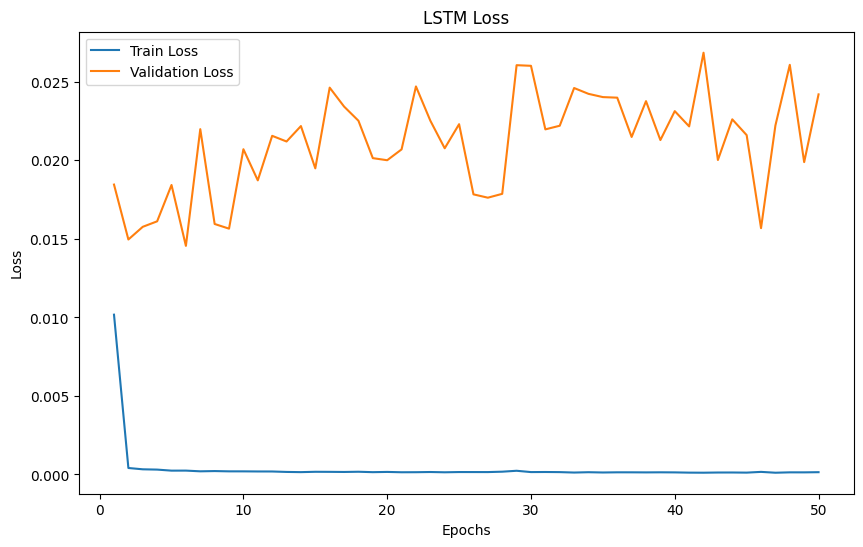

In [ ]:
# 에포크 범위 생성
epochs = list(range(1, wandb.config.epochs + 1))

# Train Loss / Validation Loss Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

RMSE

Prediction

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


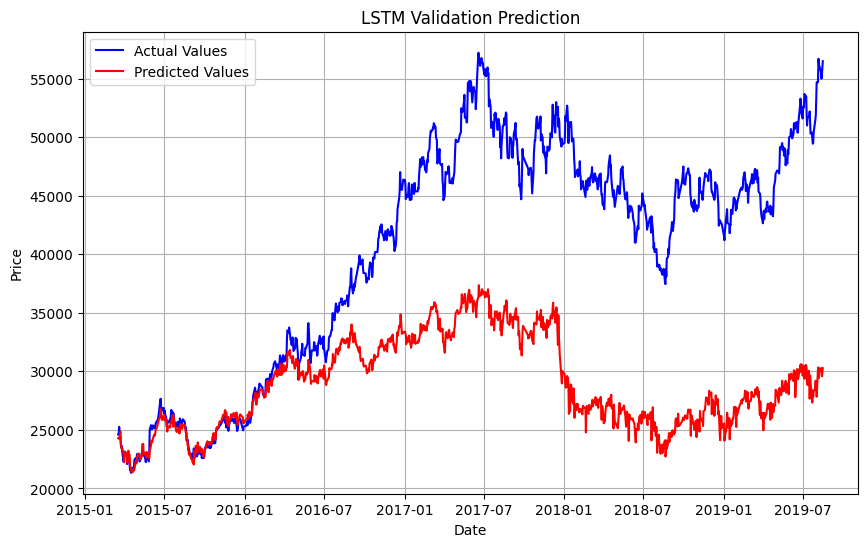

In [ ]:
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

y_pred = model_same_init.predict(X_val)
a,b = y_val, y_pred
y_pred = y_scaler_same_df.inverse_transform(y_pred)
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_same_df.inverse_transform(y_val)
y_val = np.round(np.exp(y_val), 4)

plt.figure(figsize=(10, 6))
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 11477.3155
MSE: 196817443.3128
RMSE: 14029.1640
R²: -1.0004
--------------------
After Inverse Scaling
MAE: 0.1277
MSE: 0.0242
RMSE: 0.1556
R²: -0.8817


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


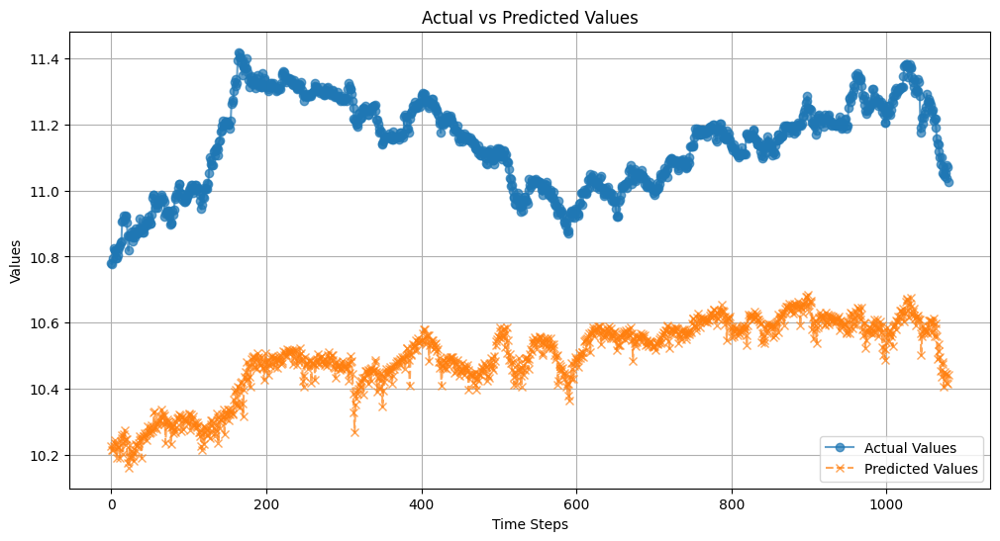

In [ ]:
X_test, y_test = create_sequences(x_test_same, y_test_same, wandb.config.time_steps)

y_pred = model_same_init.predict(X_test)
y_pred = y_scaler_same_df.inverse_transform(y_pred)
y_test = y_scaler_same_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

##### Hyper1 -> 아직 안 함

In [ ]:
wandb.init(project="LSTM Fin - Same", name="hyper1", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper1.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same, y_train_same, time_steps)
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

model_same_hyper1 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    tf.keras.layers.Dense(64),
    tf.keras.layers.Dense(1)
])

model_same_hyper1.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper1.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper1.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0337 - mse: 0.0337 - val_loss: 0.0447 - val_mse: 0.0447 - learning_rate: 0.0010
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 5.8756e-04 - mse: 5.8756e-04 - val_loss: 0.0367 - val_mse: 0.0367 - learning_rate: 0.0010
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 6.1091e-04 - mse: 6.1091e-04 - val_loss: 0.0356 - val_mse: 0.0356 - learning_rate: 0.0010
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 4.3507e-04 - mse: 4.3507e-04 - val_loss: 0.0316 - val_mse: 0.0316 - learning_rate: 0.0010
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 3.7386e-04 - mse: 3.7386e-04 - val_loss: 0.0339 - val_mse: 0.0339 - learning_rate: 0.0010
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 3.5515e-04 - mse: 3.5515e-04 - val_loss: 0.0269 - val_mse: 0.0269 - learning_rate: 0.0010
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 3.1640e-04 - mse: 3.1640e-04 - val_loss:

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 90, 64)              │          28,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 90, 64)              │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 295,301 (1.13 MB)

 Trainable params: 98,433 (384.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 196,868 (769.02 KB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step


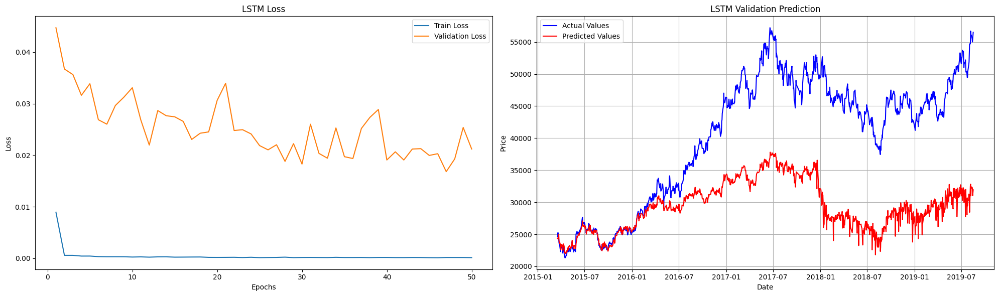

Before Inverse Scaling
MAE: 11018.9448
MSE: 177531399.3083
RMSE: 13324.0909
R²: -0.8044
--------------------
After Inverse Scaling
MAE: 0.1212
MSE: 0.0212
RMSE: 0.1456
R²: -0.6479
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


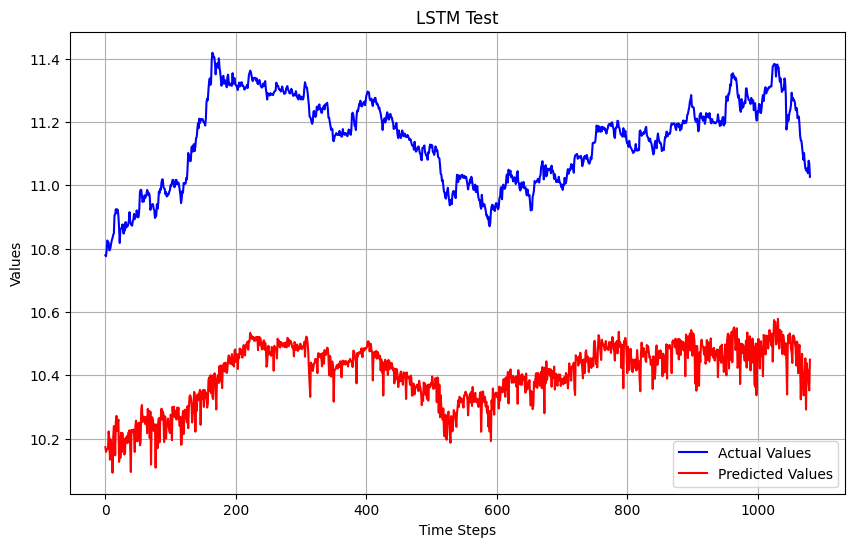

In [ ]:
#################### Loss and Val Predict #####################
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps) # 여기 val same, int 바꾸기

y_pred = model_same_hyper1.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_same_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val = y_scaler_same_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

################### Metric Calculation #############################
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

################### Test #######################
X_test, y_test = create_sequences(x_test_same, y_test_same, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_same_hyper1.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_same_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_same_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▆▆▅▅▃▄▅▅▂▄▄▃▃▃▄▅▃▃▃▂▂▁▂▁▂▃▂▂▃▄▂▂▂▂▂▂▁▂▂
val_mse,█▆▆▅▅▃▄▅▅▄▄▄▃▃▃▄▅▃▃▃▂▂▁▂▁▂▃▂▂▃▄▂▂▂▂▂▂▁▂▂
epoch,50
train_loss,0.00013
train_mse,0.00013
val_loss,0.02119
val_mse,0.02119


# Final - Int

##### init

In [ ]:
wandb.init(project="LSTM Fin - Int", name="initial", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/Initial.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
    #verbose=1
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_int, y_train_int, time_steps)
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps)

model_int_init = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),
    tf.keras.layers.Dense(1)
])

model_int_init.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_init.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_init.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - loss: 0.0349 - mse: 0.0349 - val_loss: 0.0475 - val_mse: 0.0475
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 6.3669e-04 - mse: 6.3669e-04 - val_loss: 0.0489 - val_mse: 0.0489
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 4.0234e-04 - mse: 4.0234e-04 - val_loss: 0.0431 - val_mse: 0.0431
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 3.2819e-04 - mse: 3.2819e-04 - val_loss: 0.0423 - val_mse: 0.0423
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 2.7030e-04 - mse: 2.7030e-04 - val_loss: 0.0373 - val_mse: 0.0373
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 2.5039e-04 - mse: 2.5039e-04 - val_loss: 0.0372 - val_mse: 0.0372
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 2.7381e-04 - mse: 2.7381e-04 - val_loss: 0.0308 - val_mse: 0.0308
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 1.9260e-04 - mse: 1.9260e-04 - val_loss: 0.0305 - val_mse

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 90, 64)              │          28,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 183,749 (717.77 KB)

 Trainable params: 61,249 (239.25 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 122,500 (478.52 KB)

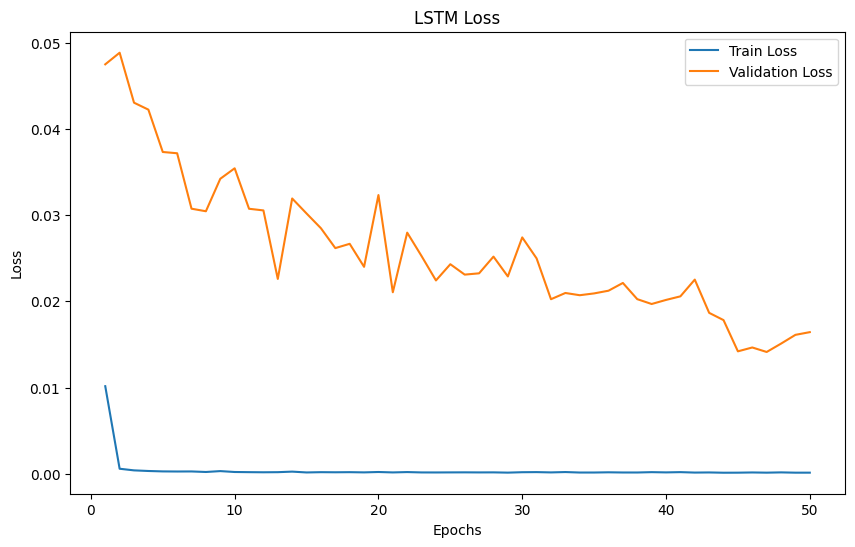

In [ ]:
# 에포크 범위 생성
epochs = list(range(1, wandb.config.epochs + 1))

# Train Loss / Validation Loss Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step


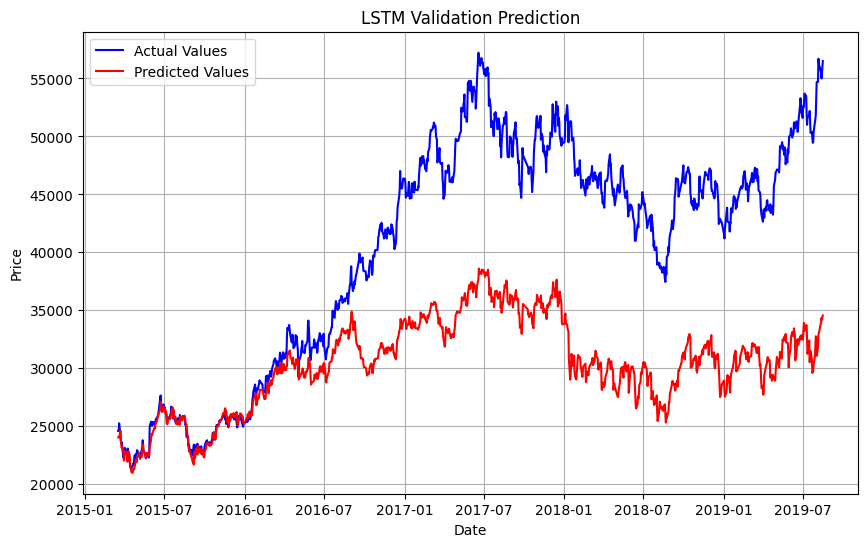

In [ ]:
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_init.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.figure(figsize=(10, 6))
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 10014.0798
MSE: 147075272.2275
RMSE: 12127.4594
R²: -0.4948
--------------------
After Inverse Scaling
MAE: 0.1072
MSE: 0.0164
RMSE: 0.1282
R²: -0.2774


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


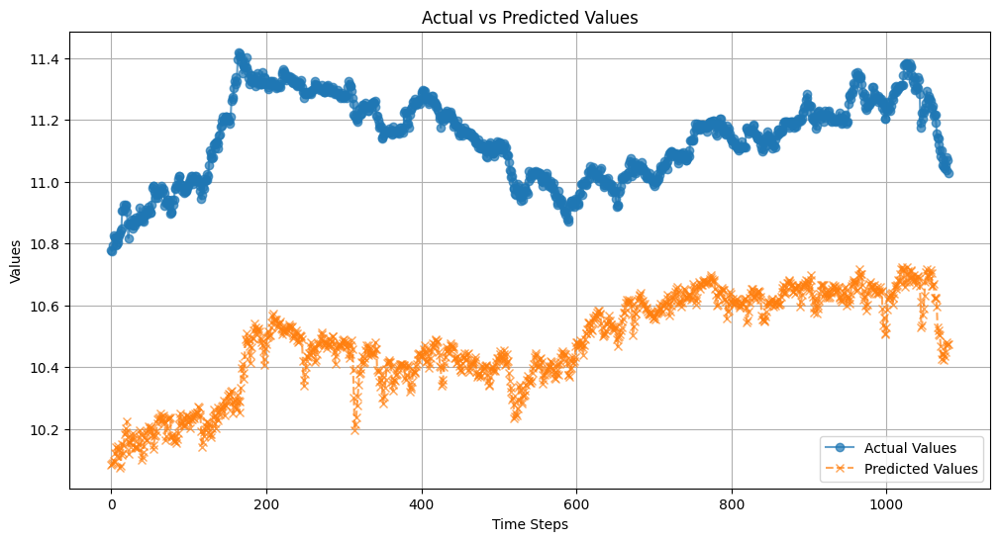

In [ ]:
X_test, y_test = create_sequences(x_test_int, y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_init.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,██▇▇▆▄▅▅▄▄▅▄▄▃▄▅▂▄▃▃▃▃▃▃▄▂▂▂▂▂▂▂▂▂▃▁▁▁▁▁
val_mse,██▇▇▆▄▄▅▅▄▃▅▄▄▃▃▅▂▄▃▃▃▃▃▄▂▂▂▂▃▂▂▂▃▂▁▁▁▁▁
epoch,50
train_loss,0.00012
train_mse,0.00012
val_loss,0.01643
val_mse,0.01643


##### Hyper1

In [ ]:
wandb.init(project="LSTM Fin - Int", name="hyper1", config={
    "epochs": 50,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper1.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_int, y_train_int, time_steps)
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps)

model_int_hyper1 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),
    tf.keras.layers.Dense(1)
])

model_int_hyper1.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper1.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper1.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0595 - mse: 0.0595 - val_loss: 0.0815 - val_mse: 0.0815
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0620 - val_mse: 0.0620
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 4.8855e-04 - mse: 4.8855e-04 - val_loss: 0.0487 - val_mse: 0.0487
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 3.5660e-04 - mse: 3.5660e-04 - val_loss: 0.0409 - val_mse: 0.0409
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 3.1686e-04 - mse: 3.1686e-04 - val_loss: 0.0393 - val_mse: 0.0393
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 2.9407e-04 - mse: 2.9407e-04 - val_loss: 0.0367 - val_mse: 0.0367
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 2.4760e-04 - mse: 2.4760e-04 - val_loss: 0.0320 - val_mse: 0.0320
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 2.6901e-04 - mse: 2.6901e-04 - val_loss: 0.0353 - val_mse: 0.0353
Epoch 9/50
54/54

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                        │ (None, 90, 64)              │          28,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 183,749 (717.77 KB)

 Trainable params: 61,249 (239.25 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 122,500 (478.52 KB)

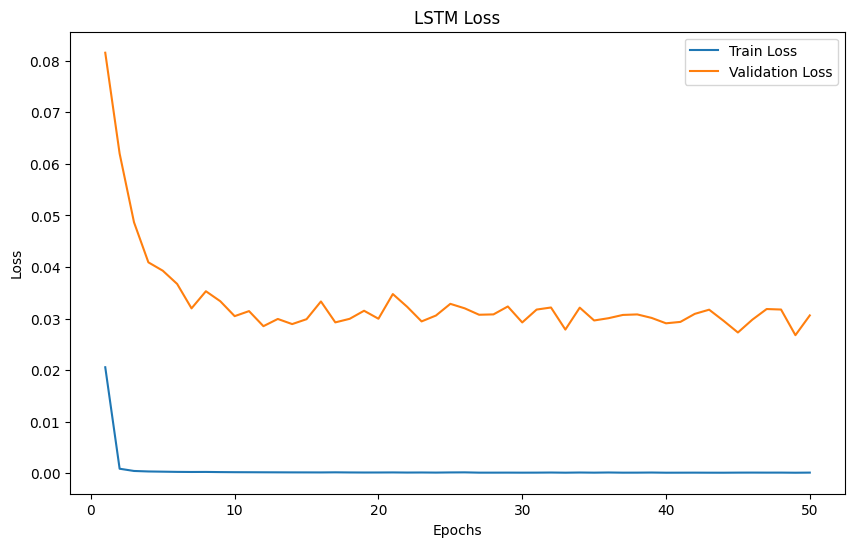

In [ ]:
# 에포크 범위 생성
epochs = list(range(1, wandb.config.epochs + 1))

# Train Loss / Validation Loss Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step


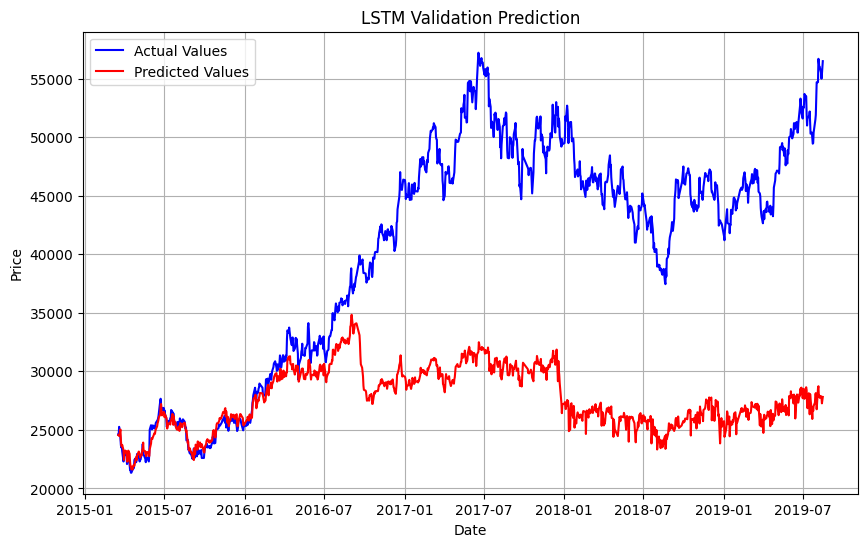

In [ ]:
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper1.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.figure(figsize=(10, 6))
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 12792.6677
MSE: 242730643.3131
RMSE: 15579.8153
R²: -1.4671
--------------------
After Inverse Scaling
MAE: 0.1452
MSE: 0.0306
RMSE: 0.1750
R²: -1.3801


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


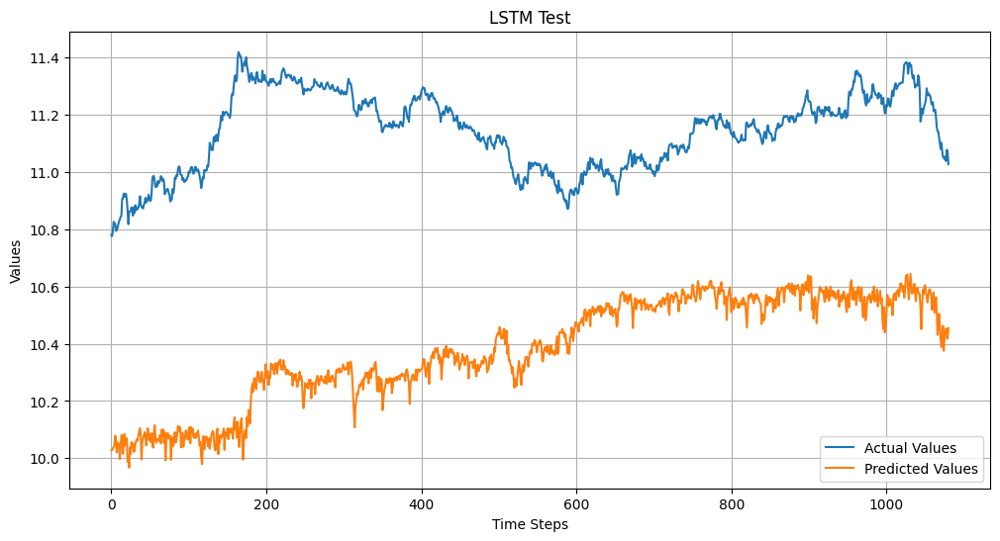

In [ ]:
X_test, y_test = create_sequences(x_test_int, y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper1.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values')
plt.plot(y_pred, label='Predicted Values')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▅▄▃▃▂▂▁▂▁▁▁▂▁▁▁▂▂▁▁▂▁▁▂▁▂▁▂▁▁▁▁▁▁▁▁▁▁▂▁
val_mse,█▅▄▃▃▂▂▂▁▁▁▁▂▁▁▁▂▂▁▁▂▁▁▂▁▂▁▂▁▁▁▁▁▁▂▁▁▂▂▁
epoch,50
train_loss,0.00013
train_mse,0.00013
val_loss,0.03061
val_mse,0.03061


##### 2

In [ ]:
wandb.init(project="LSTM Fin - Int", name="hyper2", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper2.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_int, y_train_int, time_steps)
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps)

model_int_hyper2 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper2.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper2.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper2.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.0650 - mse: 0.0650 - val_loss: 0.0282 - val_mse: 0.0282
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 7.0629e-04 - mse: 7.0629e-04 - val_loss: 0.0319 - val_mse: 0.0319
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 4.8188e-04 - mse: 4.8188e-04 - val_loss: 0.0191 - val_mse: 0.0191
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 3.7198e-04 - mse: 3.7198e-04 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 3.5660e-04 - mse: 3.5660e-04 - val_loss: 0.0191 - val_mse: 0.0191
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 2.7022e-04 - mse: 2.7022e-04 - val_loss: 0.0244 - val_mse: 0.0244
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 3.4109e-04 - mse: 3.4109e-04 - val_loss: 0.0198 - val_mse: 0.0198
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.1184e-04 - mse: 2.1184e-04 - val_loss: 0.0254 - val_mse:

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_4 (LSTM)                        │ (None, 90, 64)              │          28,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 196,229 (766.52 KB)

 Trainable params: 65,409 (255.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 130,820 (511.02 KB)

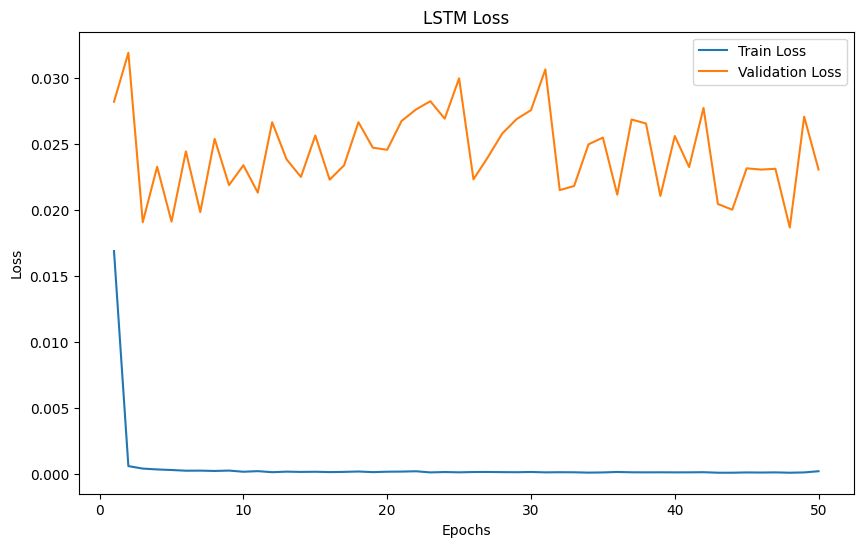

In [ ]:
# 에포크 범위 생성
epochs = list(range(1, wandb.config.epochs + 1))

# Train Loss / Validation Loss Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


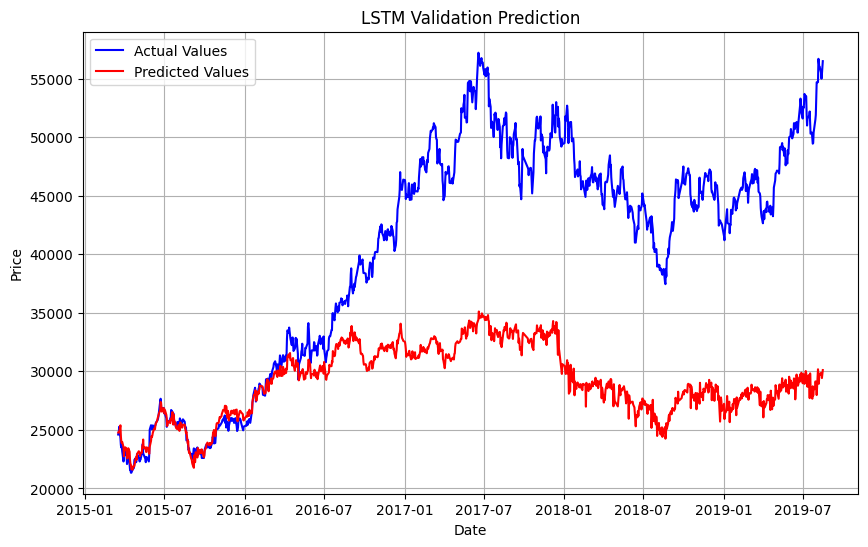

In [ ]:
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper2.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.figure(figsize=(10, 6))
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 11427.1193
MSE: 194402464.9880
RMSE: 13942.8284
R²: -0.9759
--------------------
After Inverse Scaling
MAE: 0.1259
MSE: 0.0231
RMSE: 0.1519
R²: -0.7933


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


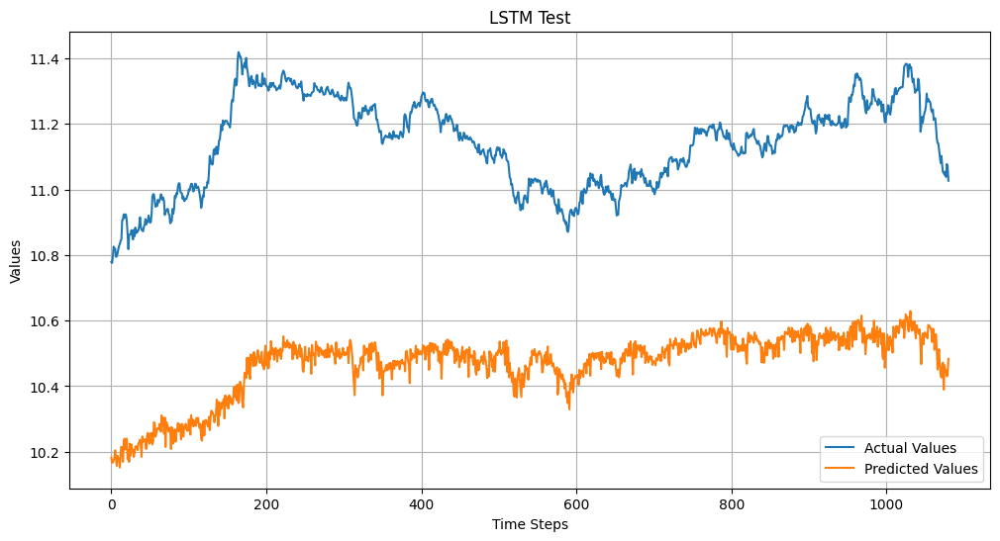

In [ ]:
X_test, y_test = create_sequences(x_test_int, y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper2.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values')
plt.plot(y_pred, label='Predicted Values')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▆█▁▃▁▂▅▃▂▅▃▅▃▃▅▄▅▆▆▅▃▄▅▅▆▂▃▄▅▂▅▂▅▃▆▃▃▃▁▃
val_mse,▆█▁▃▄▅▃▃▂▅▃▅▃▃▅▅▆▆▅▇▄▅▅▆▇▃▄▅▂▅▂▅▃▆▂▃▃▃▁▃
epoch,50
train_loss,0.00022
train_mse,0.00022
val_loss,0.02306
val_mse,0.02306


##### 3

In [ ]:
wandb.init(project="LSTM Fin - Int", name="hyper3", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [64, 64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper3.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_int, y_train_int, time_steps)
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps)

model_int_hyper3 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper3.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper3.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper3.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 0.0385 - mse: 0.0385 - val_loss: 0.0790 - val_mse: 0.0790
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 6.1041e-04 - mse: 6.1041e-04 - val_loss: 0.0835 - val_mse: 0.0835
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 6.6123e-04 - mse: 6.6123e-04 - val_loss: 0.0566 - val_mse: 0.0566
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 4.9662e-04 - mse: 4.9662e-04 - val_loss: 0.0568 - val_mse: 0.0568
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 3.7261e-04 - mse: 3.7261e-04 - val_loss: 0.0470 - val_mse: 0.0470
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 4.9255e-04 - mse: 4.9255e-04 - val_loss: 0.0583 - val_mse: 0.0583
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 3.6286e-04 - mse: 3.6286e-04 - val_loss: 0.0574 - val_mse: 0.0574
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 3.5893e-04 - mse: 3.5893e-04 - val_loss: 0.0552 - val_mse:

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_6 (LSTM)                        │ (None, 90, 64)              │          28,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_7 (LSTM)                        │ (None, 90, 64)              │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_8 (LSTM)                        │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 295,301 (1.13 MB)

 Trainable params: 98,433 (384.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 196,868 (769.02 KB)

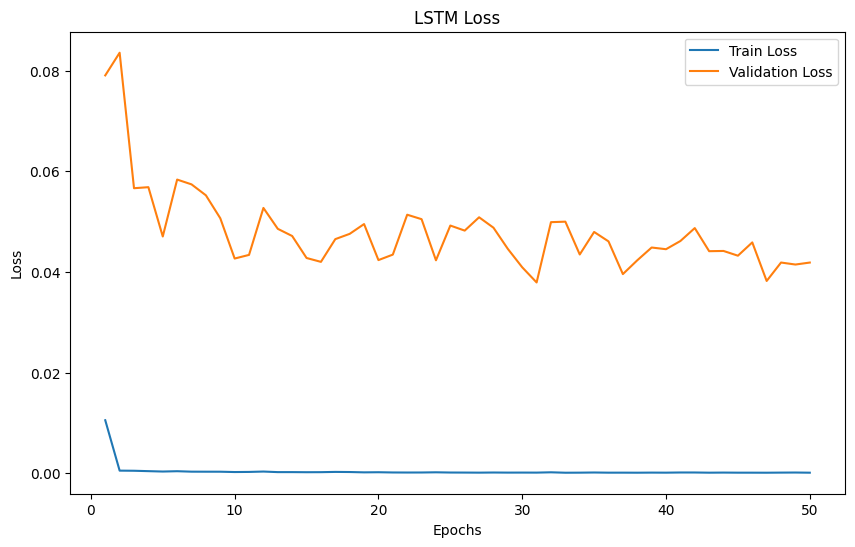

In [ ]:
# 에포크 범위 생성
epochs = list(range(1, wandb.config.epochs + 1))

# Train Loss / Validation Loss Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step


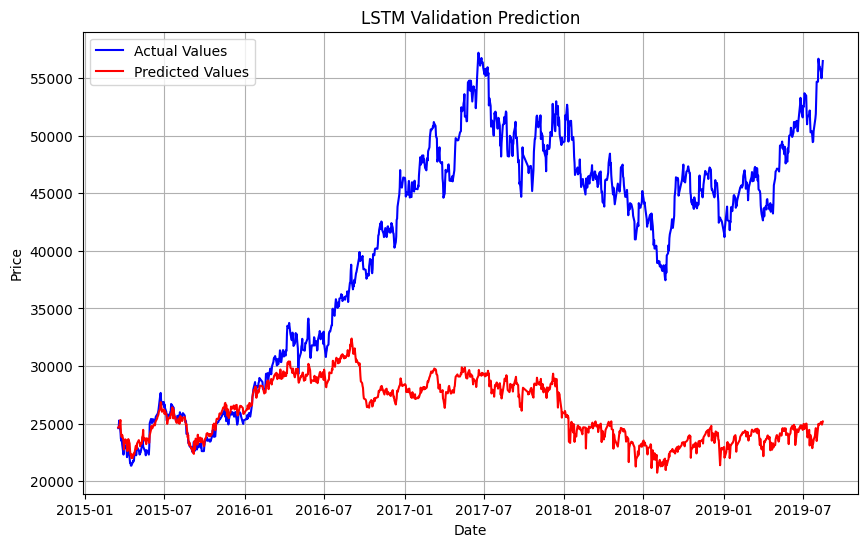

In [ ]:
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper3.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.figure(figsize=(10, 6))
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 14425.1485
MSE: 304647471.2605
RMSE: 17454.1534
R²: -2.0964
--------------------
After Inverse Scaling
MAE: 0.1705
MSE: 0.0419
RMSE: 0.2046
R²: -2.2552


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


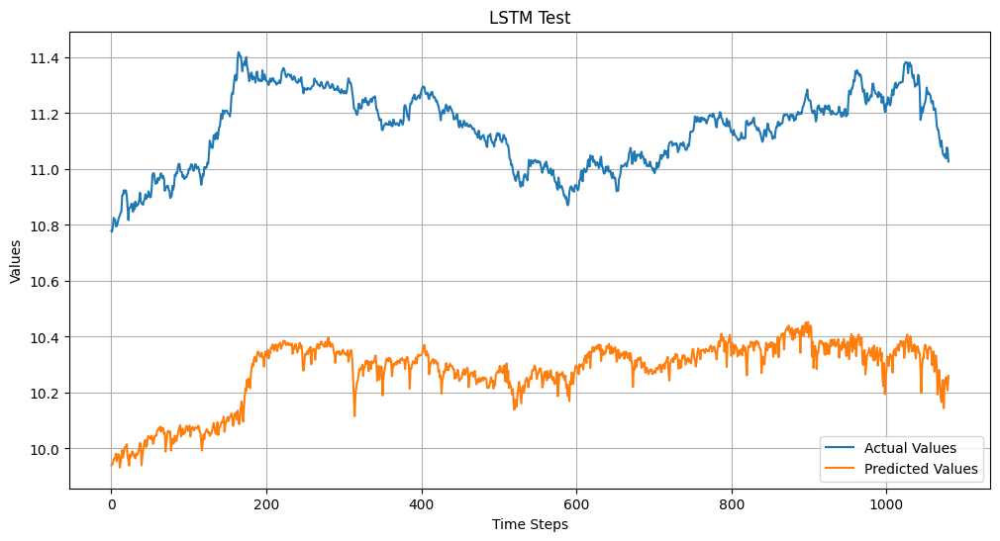

In [ ]:
X_test, y_test = create_sequences(x_test_int, y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper3.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values')
plt.plot(y_pred, label='Predicted Values')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇██
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▇█▄▄▂▄▄▃▂▂▃▂▂▂▂▂▂▃▃▂▃▃▃▂▁▃▂▃▂▁▂▂▂▃▂▂▂▁▂▂
val_mse,▇█▄▄▂▄▄▃▂▂▃▂▂▂▂▂▃▃▂▃▃▃▂▁▁▃▂▃▂▁▂▂▂▃▂▂▂▁▂▂
epoch,50
train_loss,0.00013
train_mse,0.00013
val_loss,0.04186
val_mse,0.04186


##### 4

In [ ]:
wandb.init(project="LSTM Fin - Int", name="hyper4", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper4.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_int, y_train_int, time_steps)
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps)

model_int_hyper4 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    #tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper4.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper4.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper4.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.0492 - mse: 0.0492 - val_loss: 0.0405 - val_mse: 0.0405
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0439 - val_mse: 0.0439
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0029 - mse: 0.0029 - val_loss: 0.0323 - val_mse: 0.0323
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0030 - mse: 0.0030 - val_loss: 0.0496 - val_mse: 0.0496
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0470 - val_mse: 0.0470
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0271 - val_mse: 0.0271
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0272 - val_mse: 0.0272
Epoch 9/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_9 (LSTM)                        │ (None, 90, 128)             │          89,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_10 (LSTM)                       │ (None, 90, 64)              │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 90, 64)              │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 90, 1)               │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 428,165 (1.63 MB)

 Trainable params: 142,721 (557.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 285,444 (1.09 MB)

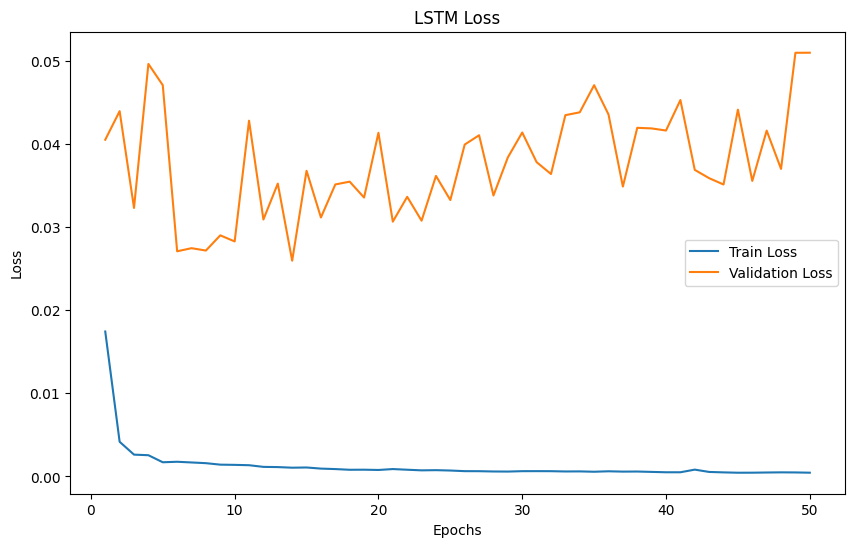

In [ ]:
# 에포크 범위 생성
epochs = list(range(1, wandb.config.epochs + 1))

# Train Loss / Validation Loss Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


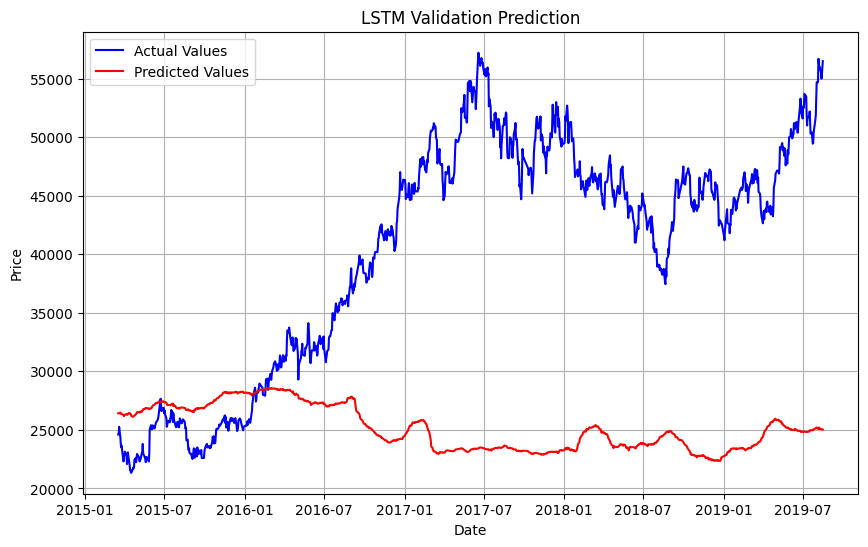

In [ ]:
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper4.predict(X_val) # 여기 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
a,b = y_val, y_pred
y_pred = y_scaler_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.figure(figsize=(10, 6))
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 16207.5686
MSE: 361639762.8045
RMSE: 19016.8284
R²: -2.6756
--------------------
After Inverse Scaling
MAE: 0.1984
MSE: 0.0522
RMSE: 0.2284
R²: -3.0565


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


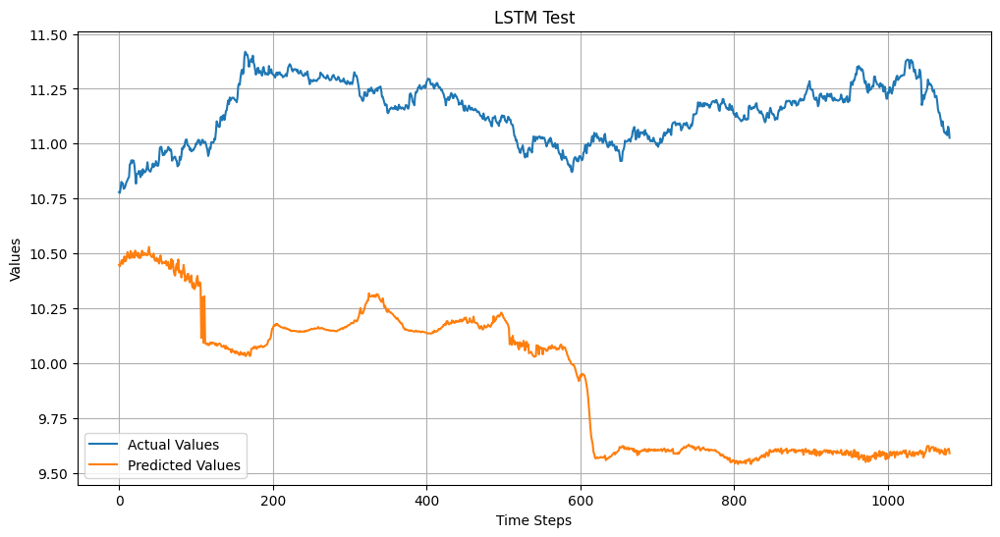

In [ ]:
X_test, y_test = create_sequences(x_test_int, y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper4.predict(X_test) # 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
y_pred = y_scaler_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values')
plt.plot(y_pred, label='Predicted Values')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
train_loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▅▅▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁
val_loss,▆▃█▇▁▁▂▂▆▂▁▄▂▄▄▅▂▃▂▄▅▃▄▅▄▆▆▇▆▃▅▅▆▄▄▆▄▅▄█
val_mse,▅▆▃█▇▁▁▂▂▂▁▄▂▄▄▅▂▃▂▄▅▅▃▄▅▄▆▆▇▆▅▅▆▄▄▆▄▅▄█
epoch,50
train_loss,0.00045
train_mse,0.00045
val_loss,0.05094
val_mse,0.05094


##### 5

In [ ]:
wandb.init(project="LSTM Fin - Int", name="hyper5", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper5.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_int, y_train_int, time_steps)
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps)

model_int_hyper5 = tf.keras.Sequential([
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True)),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    Attention(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper5.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper5.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper5.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.0340 - mse: 0.0340 - val_loss: 0.1002 - val_mse: 0.1002
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0566 - val_mse: 0.0566
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0526 - val_mse: 0.0526
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 9.3511e-04 - mse: 9.3511e-04 - val_loss: 0.0745 - val_mse: 0.0745
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0459 - val_mse: 0.0459
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 7.8523e-04 - mse: 7.8523e-04 - val_loss: 0.0639 - val_mse: 0.0639
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 8.7705e-04 - mse: 8.7705e-04 - val_loss: 0.0540 - val_mse: 0.0540
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 6.5041e-04 - mse: 6.5041e-04 - val_loss: 0.0549 - val_mse: 0.0549
Epoch 9/50
108/1

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ bidirectional (Bidirectional)        │ (None, 90, 256)             │         178,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_12 (LSTM)                       │ (None, 90, 64)              │          82,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ attention (Attention)                │ (None, 64)                  │           4,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 806,405 (3.08 MB)

 Trainable params: 268,801 (1.03 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 537,604 (2.05 MB)

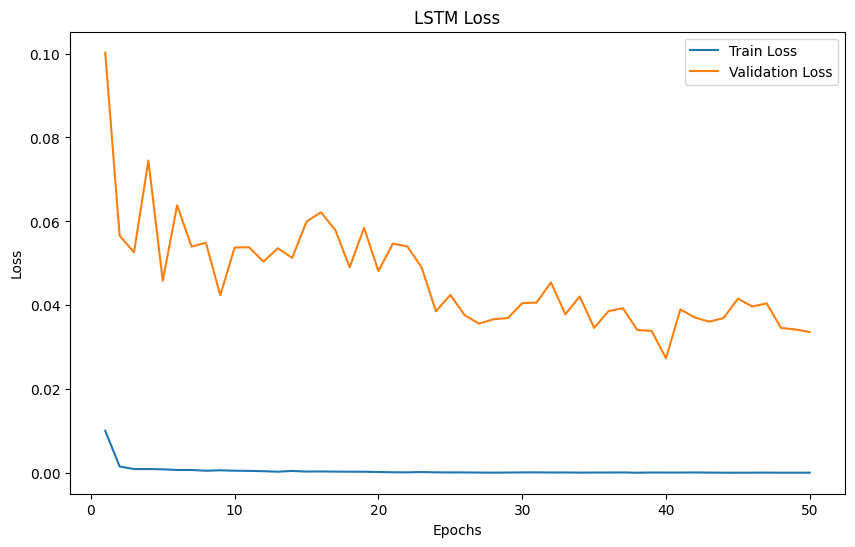

In [ ]:
# 에포크 범위 생성
epochs = list(range(1, wandb.config.epochs + 1))

# Train Loss / Validation Loss Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step


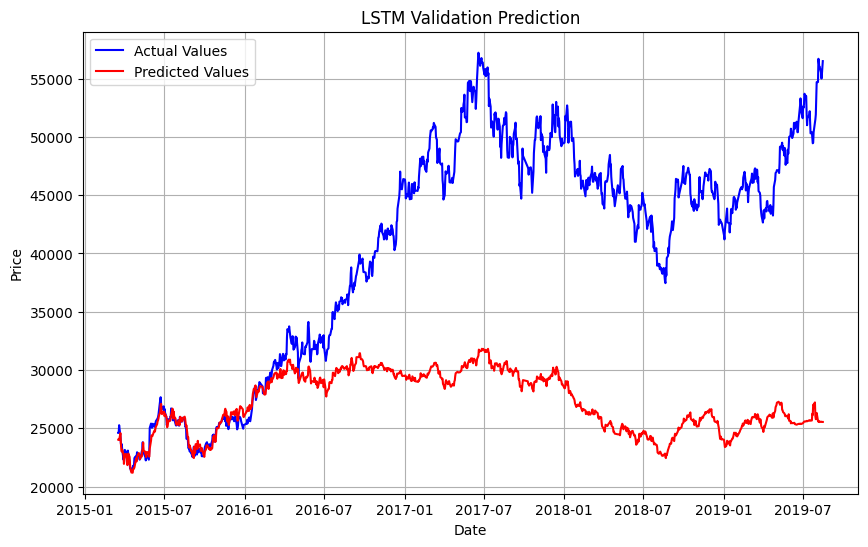

In [ ]:
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper5.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.figure(figsize=(10, 6))
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 13283.4295
MSE: 259833966.6236
RMSE: 16119.3662
R²: -1.6409
--------------------
After Inverse Scaling
MAE: 0.1526
MSE: 0.0336
RMSE: 0.1834
R²: -1.6155


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


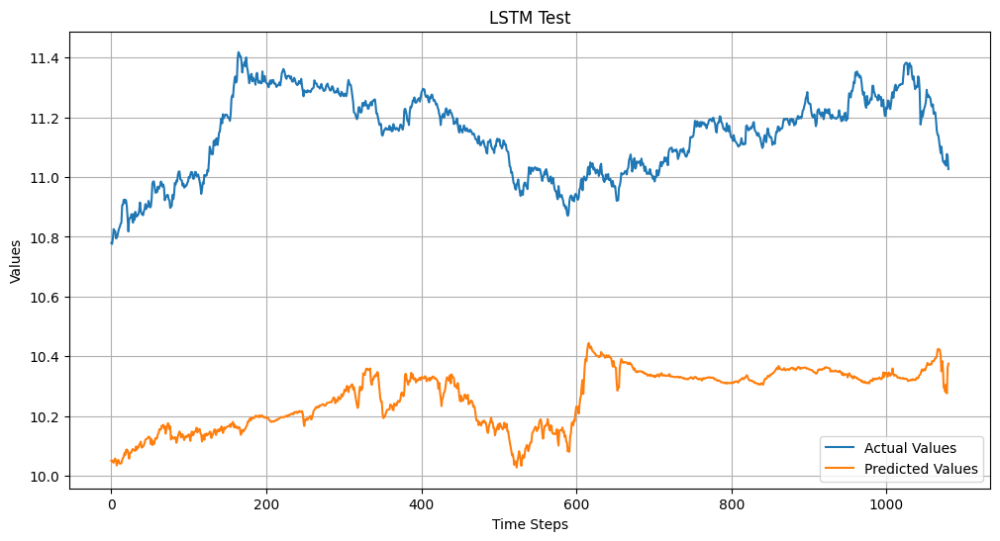

In [ ]:
X_test, y_test = create_sequences(x_test_int, y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper5.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values')
plt.plot(y_pred, label='Predicted Values')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▄▃▆▃▄▄▂▄▄▄▃▄▄▄▄▃▄▄▃▂▂▂▂▂▂▃▂▂▂▂▂▂▁▂▂▂▂▂▂
val_mse,█▄▃▆▃▄▄▂▄▄▄▃▄▄▃▃▄▄▃▂▂▂▂▂▂▃▂▂▂▂▂▂▁▂▂▂▂▂▂▂
epoch,50
train_loss,0.00014
train_mse,0.00014
val_loss,0.03364
val_mse,0.03364


##### 6

In [ ]:
wandb.init(project="LSTM Fin - Int", name="hyper6", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper6.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_int, y_train_int, time_steps)
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps)

model_int_hyper6 = tf.keras.Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(time_steps, len(features))),
    MaxPooling1D(pool_size=2),

    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),

    Attention(),
    tf.keras.layers.Flatten(),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper6.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper6.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper6.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.0369 - mse: 0.0369 - val_loss: 0.0409 - val_mse: 0.0409
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0340 - val_mse: 0.0340
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0322 - val_mse: 0.0322
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0279 - val_mse: 0.0279
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 8.1771e-04 - mse: 8.1771e-04 - val_loss: 0.0378 - val_mse: 0.0378
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 8.5812e-04 - mse: 8.5812e-04 - val_loss: 0.0429 - val_mse: 0.0429
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 8.2617e-04 - mse: 8.2617e-04 - val_loss: 0.0340 - val_mse: 0.0340
Epoch 9/50
108/108 ━━━━━

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                      │ (None, 88, 64)              │           8,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d (MaxPooling1D)         │ (None, 44, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_13 (LSTM)                       │ (None, 44, 128)             │          98,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_14 (LSTM)                       │ (None, 44, 64)              │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ attention_1 (Attention)              │ (None, 64)                  │           4,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 496,133 (1.89 MB)

 Trainable params: 165,377 (646.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 330,756 (1.26 MB)

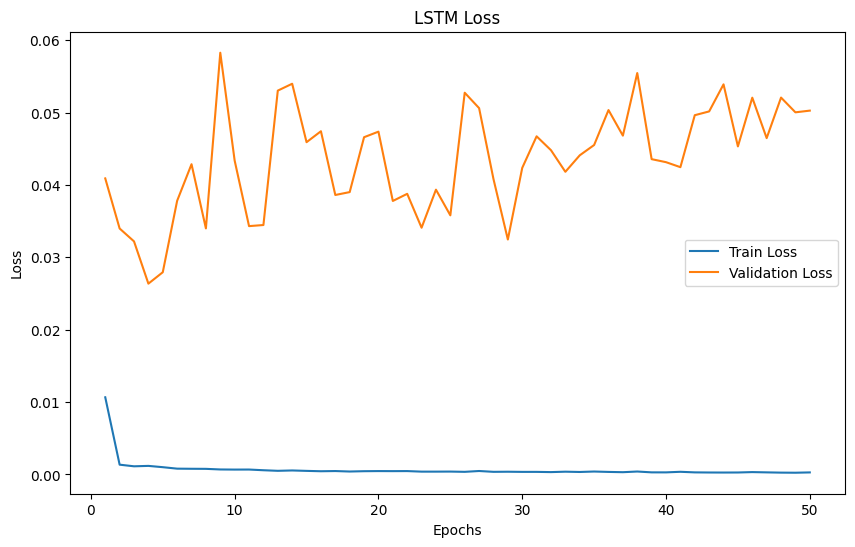

In [ ]:
# 에포크 범위 생성
epochs = list(range(1, wandb.config.epochs + 1))

# Train Loss / Validation Loss Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


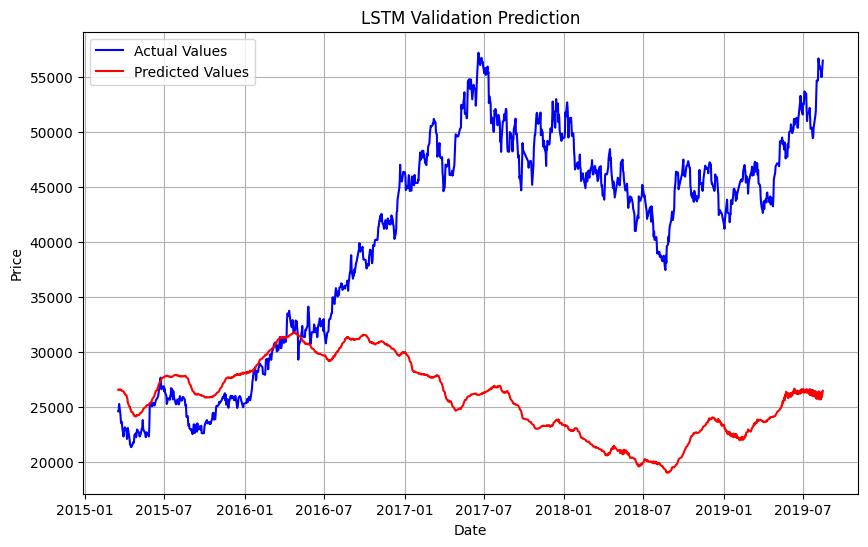

In [ ]:
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper6.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.figure(figsize=(10, 6))
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 15391.0211
MSE: 344414613.3743
RMSE: 18558.4109
R²: -2.5006
--------------------
After Inverse Scaling
MAE: 0.1876
MSE: 0.0503
RMSE: 0.2242
R²: -2.9079


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


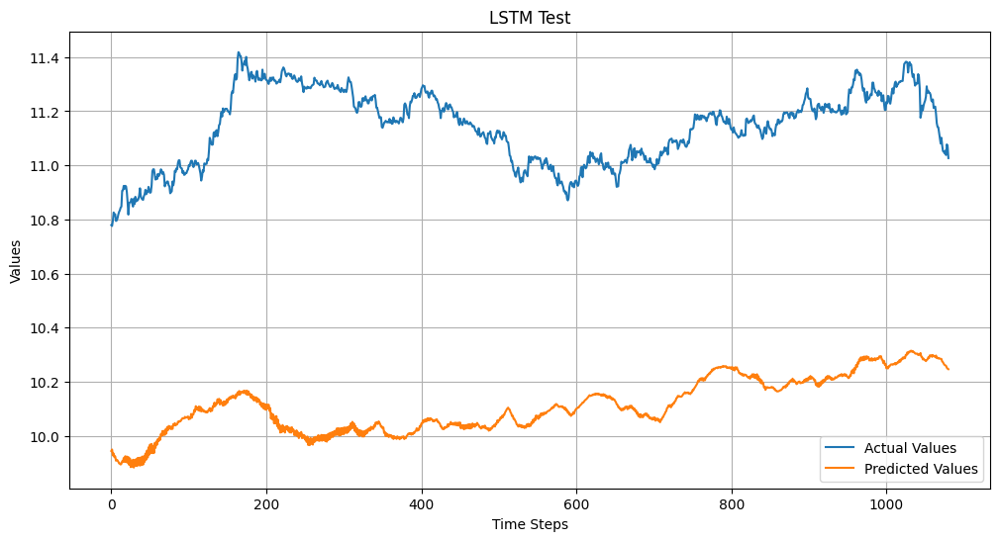

In [ ]:
X_test, y_test = create_sequences(x_test_int, y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper6.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values')
plt.plot(y_pred, label='Predicted Values')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
train_loss,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▄▃▂▁▁▅▃█▅▃▇▇▅▆▄▅▆▄▄▃▃▇▆▄▅▅▄▅▆▅▅▅▅▆▆▅▇▅▇▆
val_mse,▄▃▂▁▁▅▃█▅▃▇▇▆▄▄▆▄▄▃▄▇▆▄▂▅▅▄▅▅▆▇▅▅▆▆▅▇▅▇▆
epoch,50
train_loss,0.00028
train_mse,0.00028
val_loss,0.05026
val_mse,0.05026


##### 22

In [ ]:
wandb.finish()

In [ ]:
wandb.init(project="LSTM Fin - Int", name="hyper22", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128,64,32],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper22.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_int, y_train_int, time_steps)
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps)

model_int_hyper22 = tf.keras.Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(time_steps, len(features))),
    MaxPooling1D(pool_size=2),

    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh',  kernel_regularizer=tf.keras.regularizers.l2(0.001), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh',  kernel_regularizer=tf.keras.regularizers.l2(0.001), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper22.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper22.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper22.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.2675 - mse: 0.0496 - val_loss: 0.1219 - val_mse: 0.0374
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0698 - mse: 0.0014 - val_loss: 0.0820 - val_mse: 0.0438
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0343 - mse: 0.0011 - val_loss: 0.0613 - val_mse: 0.0390
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0209 - mse: 9.1931e-04 - val_loss: 0.0454 - val_mse: 0.0311
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0137 - mse: 7.2761e-04 - val_loss: 0.0366 - val_mse: 0.0271
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.0097 - mse: 9.2924e-04 - val_loss: 0.0281 - val_mse: 0.0215
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0071 - mse: 0.0010 - val_loss: 0.0232 - val_mse: 0.0186
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0050 - mse: 7.4622e-04 - val_loss: 0.0283 - val_mse: 0.0250
Epoch 9/50
108/108 ━━━━━━━━━━━━

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                      │ (None, 88, 64)              │           8,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d (MaxPooling1D)         │ (None, 44, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 44, 128)             │          98,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ (None, 44, 64)              │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 32)                  │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 514,565 (1.96 MB)

 Trainable params: 171,521 (670.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 343,044 (1.31 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


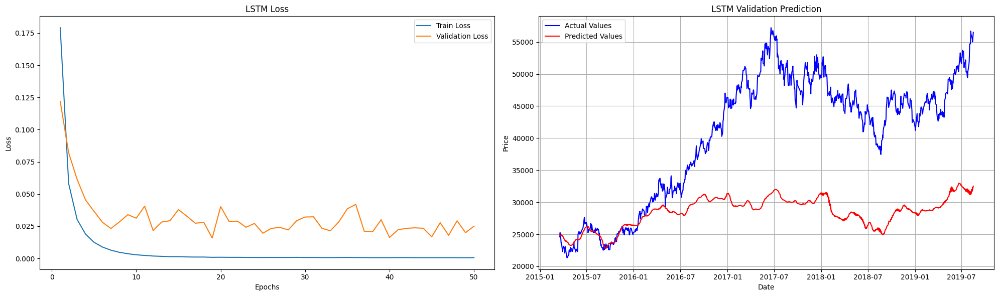

Before Inverse Scaling
MAE: 12086.3809
MSE: 208375932.7757
RMSE: 14435.2323
R²: -1.1179
--------------------
After Inverse Scaling
MAE: 0.1347
MSE: 0.0249
RMSE: 0.1579
R²: -0.9374
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


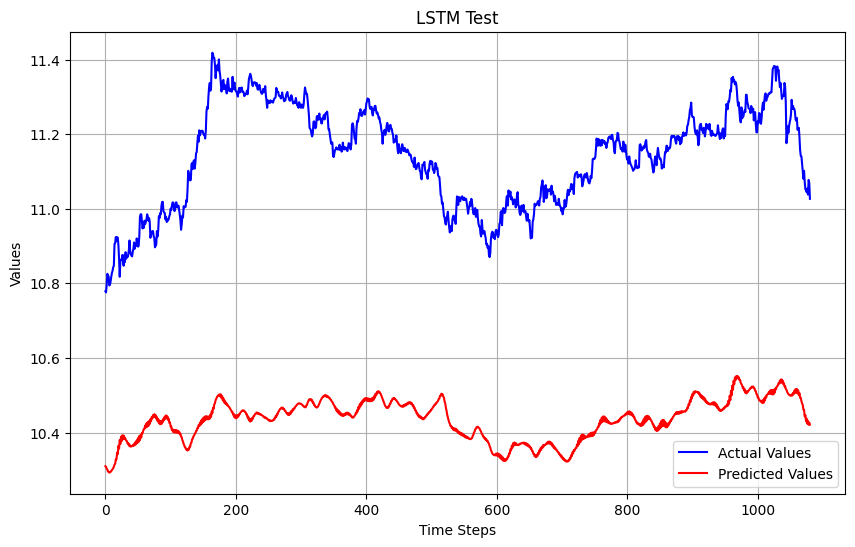

In [ ]:
#################### Loss and Val Predict #####################
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper22.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val = y_scaler_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

################### Metric Calculation #############################
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

################### Test #######################
X_test, y_test = create_sequences(x_test_int, y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper22.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

#### Feature Selection

##### 7

In [ ]:
wandb.init(project="LSTM Fin - Int", name="hyper7", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper7.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper7 = tf.keras.Sequential([
    # Conv1D(64, kernel_size=3, activation='relu', input_shape=(time_steps, len(features))),
    # MaxPooling1D(pool_size=2),

    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features0_int)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),

    Attention(),
    tf.keras.layers.Flatten(),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper7.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper7.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper7.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0327 - mse: 0.0327 - val_loss: 0.0321 - val_mse: 0.0321
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0243 - val_mse: 0.0243
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0284 - val_mse: 0.0284
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0346 - val_mse: 0.0346
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0241 - val_mse: 0.0241
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0280 - val_mse: 0.0280
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 9.8875e-04 - mse: 9.8875e-04 - val_loss: 0.0215 - val_mse: 0.0215
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 9.4075e-04 - mse: 9.4075e-04 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 9/50
108/108 ━━━━━━━━━━━━━

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_15 (LSTM)                       │ (None, 90, 128)             │          74,752 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_16 (LSTM)                       │ (None, 90, 64)              │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ attention_2 (Attention)              │ (None, 64)                  │           4,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 397,829 (1.52 MB)

 Trainable params: 132,609 (518.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 265,220 (1.01 MB)

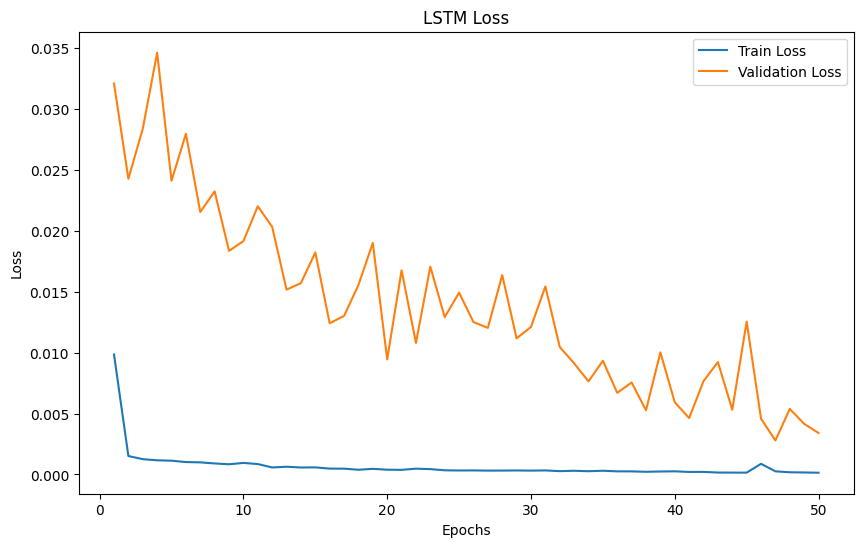

In [ ]:
# 에포크 범위 생성
epochs = list(range(1, wandb.config.epochs + 1))

# Train Loss / Validation Loss Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step


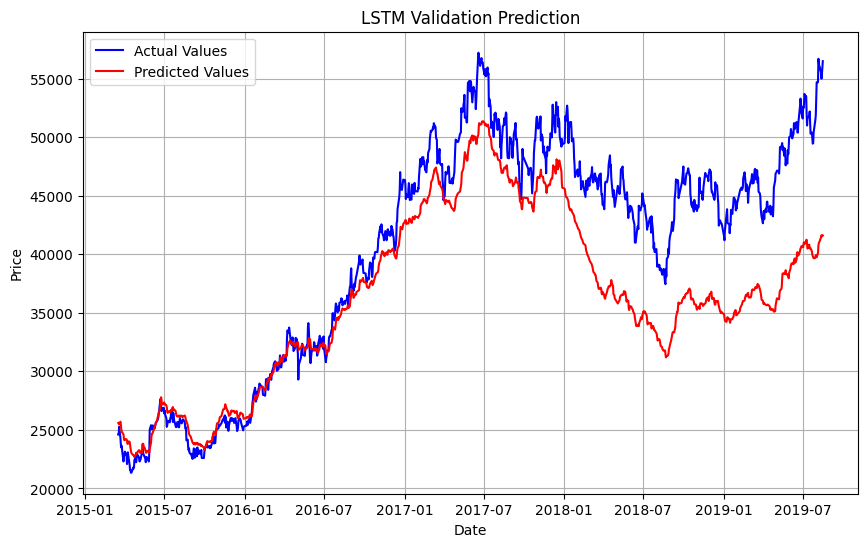

In [ ]:
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper7.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.figure(figsize=(10, 6))
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 4429.3687
MSE: 34872751.3838
RMSE: 5905.3155
R²: 0.6456
--------------------
After Inverse Scaling
MAE: 0.0444
MSE: 0.0034
RMSE: 0.0584
R²: 0.7351


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


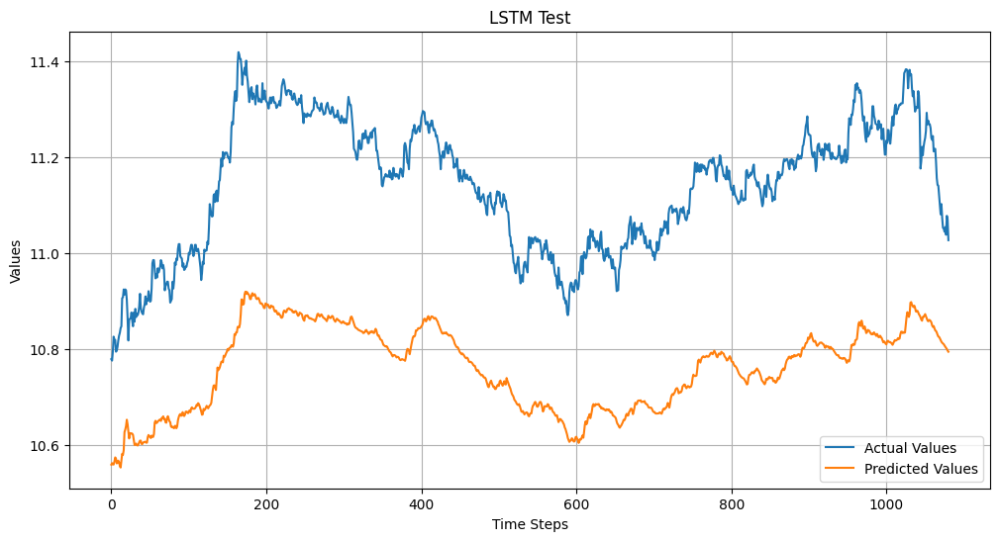

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper7.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values')
plt.plot(y_pred, label='Predicted Values')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁
train_mse,█▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁
val_loss,▇▆▇█▆▅▅▄▅▅▄▄▄▃▃▅▂▄▃▄▄▃▄▃▃▃▂▂▂▂▂▃▂▁▂▂▃▁▁▁
val_mse,▇▆▇█▆▅▅▄▅▅▄▄▄▃▃▅▂▄▃▄▄▃▄▃▃▃▂▂▂▂▂▃▁▂▂▃▁▁▂▁
epoch,50
train_loss,0.00015
train_mse,0.00015
val_loss,0.00341
val_mse,0.00341


##### 8

In [ ]:
wandb.finish()

In [ ]:
wandb.init(project="LSTM Fin - Int", name="hyper8", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper8.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper8 = tf.keras.Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(time_steps, len(features0_int))),
    MaxPooling1D(pool_size=2),

    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),

    Attention(),
    tf.keras.layers.Flatten(),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper8.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper8.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper8.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.0451 - mse: 0.0451 - val_loss: 0.0236 - val_mse: 0.0236
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0139 - val_mse: 0.0139
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0217 - val_mse: 0.0217
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0135 - val_mse: 0.0135
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0145 - val_mse: 0.0145
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0123 - val_mse: 0.0123
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0190 - val_mse: 0.0190
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 9/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_3 (Conv1D)                    │ (None, 88, 64)              │           3,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_3 (MaxPooling1D)       │ (None, 44, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_21 (LSTM)                       │ (None, 44, 64)              │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_22 (LSTM)                       │ (None, 44, 64)              │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ attention_5 (Attention)              │ (None, 64)                  │           4,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 233,477 (912.02 KB)

 Trainable params: 77,825 (304.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 155,652 (608.02 KB)

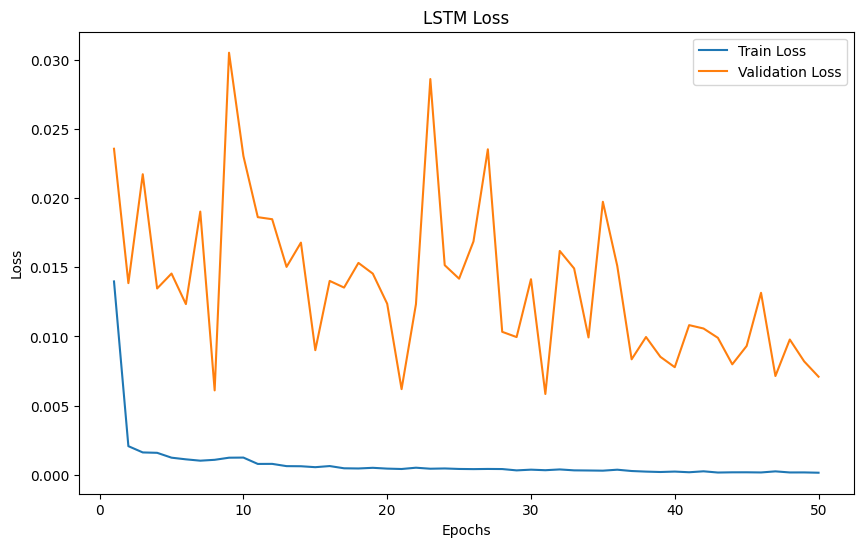

In [ ]:
# 에포크 범위 생성
epochs = list(range(1, wandb.config.epochs + 1))

# Train Loss / Validation Loss Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


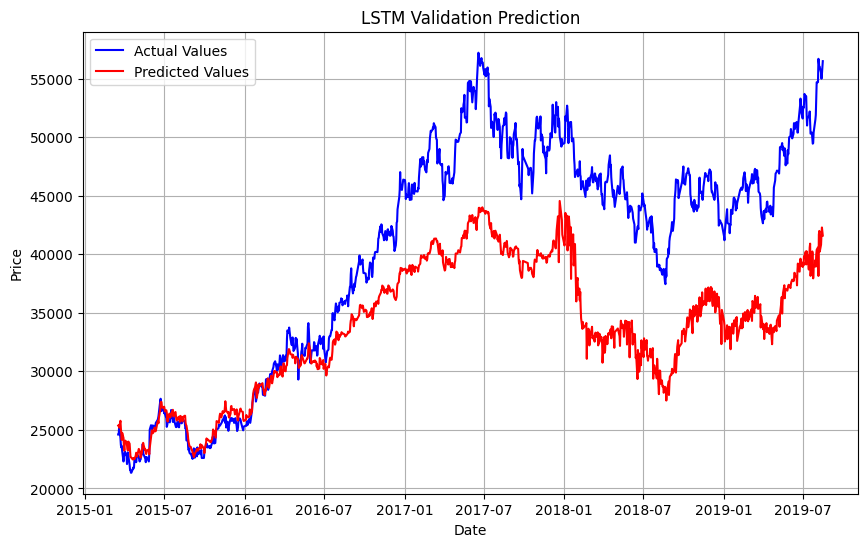

In [ ]:
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper8.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.figure(figsize=(10, 6))
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 6877.6135
MSE: 70329495.4529
RMSE: 8386.2683
R²: 0.2852
--------------------
After Inverse Scaling
MAE: 0.0700
MSE: 0.0071
RMSE: 0.0842
R²: 0.4485


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


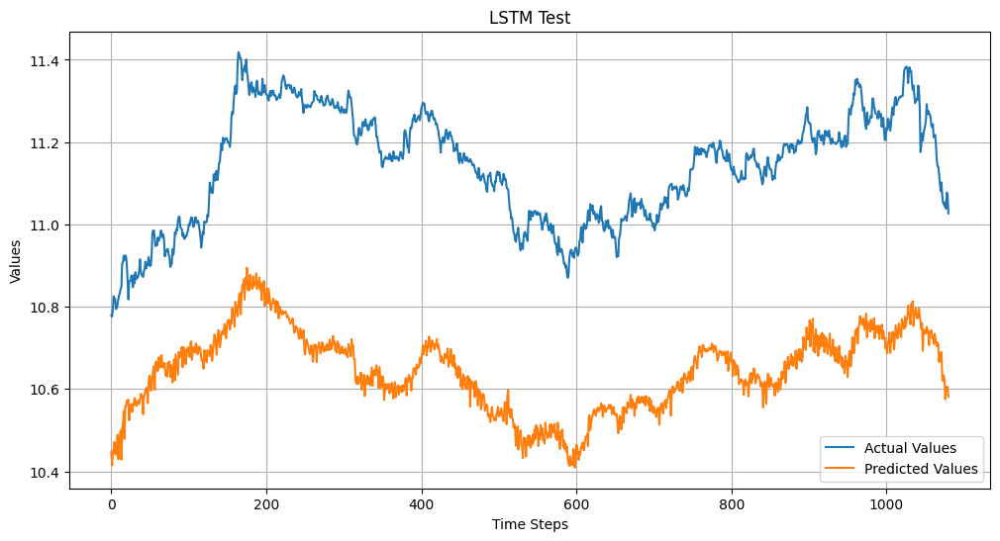

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper8.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values')
plt.plot(y_pred, label='Predicted Values')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
train_loss,█▂▂▂▂▁▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▂▂▂▂▁▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▆▃▅▃▃▅▁█▆▅▄▂▃▃▄▃▁▃▇▄▄▆▂▂▃▄▄▂▅▄▂▂▁▂▂▂▃▁▂▁
val_mse,▆▃▅▃▃▅▁█▆▅▄▂▃▃▄▃▁▃▇▄▄▆▂▂▃▄▄▂▅▄▂▂▁▂▂▂▃▁▂▁
epoch,50
train_loss,0.00016
train_mse,0.00016
val_loss,0.00709
val_mse,0.00709


##### 9

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper9", config={
    "epochs": 100,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper9.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

# Conv1D + MaxPooling
conv1 = Conv1D(64, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh')(skip1)

skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)

# Add 레이어에 입력
skip2 = Add()([skip1_reshaped, lstm2])

# Dense Layers
dense1 = Dense(64, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper9 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper9.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper9.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper9.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper9.summary()

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0291 - mse: 0.0291 - val_loss: 0.0081 - val_mse: 0.0081 - learning_rate: 1.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0079 - val_mse: 0.0079 - learning_rate: 1.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0091 - val_mse: 0.0091 - learning_rate: 1.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0183 - val_mse: 0.0183 - learning_rate: 1.0000e-04
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0200 - val_mse: 0.0200 - learning_rate: 1.0000e-04
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0239 - val_mse: 0.0239 - learning_rate: 1.0000e-04
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0147 - val_mse: 0.0147 - lear

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_11            │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_4 (Conv1D)         │ (None, 88, 64)         │          3,328 │ input_layer_11[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_4           │ (None, 44, 64)         │              0 │ conv1d_4[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_23 (LSTM)            │ (None, 44, 64)         │         33,024 │ max_pooling1d_4[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 44, 64)         │              0 │ max_pooling1d_4[0][0], │
│                           │                        │                │ lstm_23[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_6 (Flatten)       │ (None, 2816)           │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_20 (Dense)          │ (None, 64)             │        180,288 │ flatten_6[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_24 (LSTM)            │ (None, 64)             │         33,024 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_1 (Add)               │ (None, 64)             │              0 │ dense_20[0][0],        │
│                           │                        │                │ lstm_24[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_21 (Dense)          │ (None, 64)             │          4,160 │ add_1[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_22 (Dense)          │ (None, 1)              │             65 │ dense_21[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 761,669 (2.91 MB)

 Trainable params: 253,889 (991.75 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 507,780 (1.94 MB)

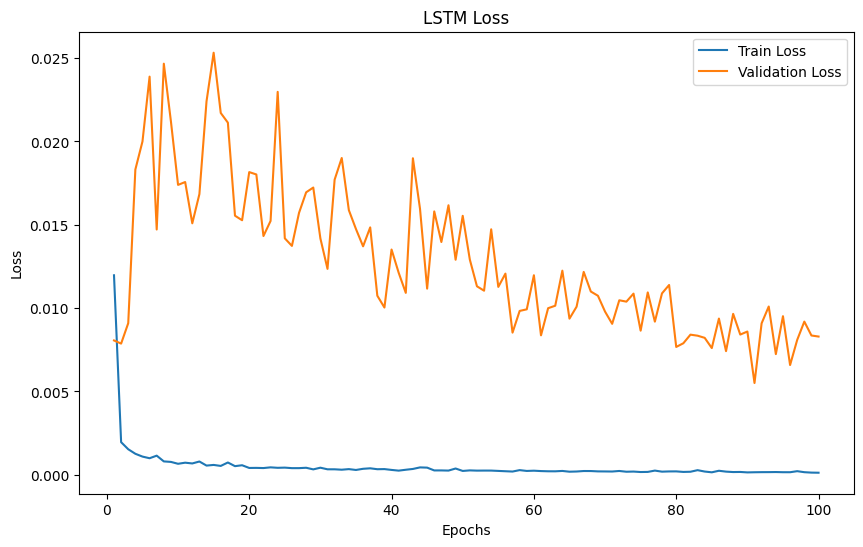

In [ ]:
# 에포크 범위 생성
epochs = list(range(1, wandb.config.epochs + 1))

# Train Loss / Validation Loss Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step


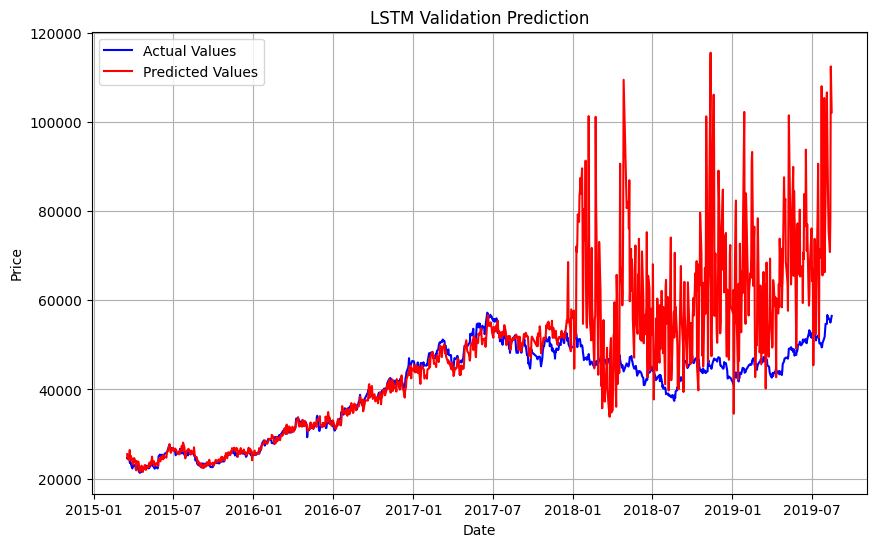

In [ ]:
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper9.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.figure(figsize=(10, 6))
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 7297.2008
MSE: 178580902.5108
RMSE: 13363.4166
R²: -0.8151
--------------------
After Inverse Scaling
MAE: 0.0549
MSE: 0.0083
RMSE: 0.0911
R²: 0.3552


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


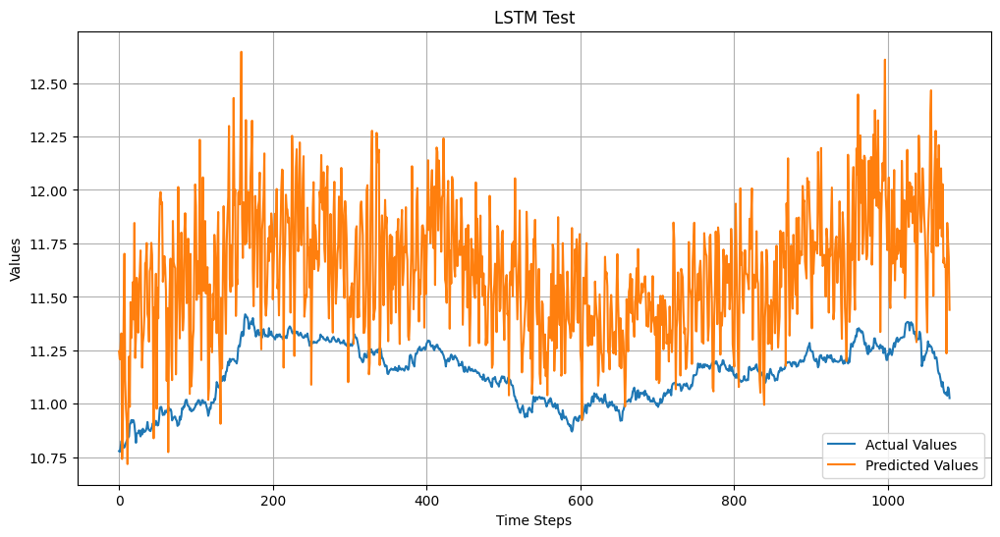

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper9.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values')
plt.plot(y_pred, label='Predicted Values')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▇▅▆▄▃▄▃▃▂▂▂▂▂▂▂▂▂▂▂▁▂▂▂▂▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁
train_mse,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▆██▇▅▇▇▅▅▄▅▅▄▄▅▅▄▄▃▃▃▄▃▂▃▃▃▃▃▃▃▂▃▂▂▁▂▂▂▂
val_mse,▂▆██▇▇▆▆▅▇▄▅▅▆▅▄▃▄▅▅▃▄▂▂▃▃▂▃▂▃▃▂▂▂▂▂▁▂▃▂
epoch,100
learning_rate,0.0001
train_loss,0.00012
train_mse,0.00012
val_loss,0.00829


##### 10

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper10", config={
    "epochs": 100,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper10.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

# Conv1D + MaxPooling
conv1 = Conv1D(64, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh')(skip1)

skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)

# Add 레이어에 입력
skip2 = Add()([skip1_reshaped, lstm2])

# Dense Layers
dense1 = Dense(64, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper10 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper10.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper10.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper10.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper10.summary()

Epoch 1/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0316 - mse: 0.0316 - val_loss: 0.0170 - val_mse: 0.0170 - learning_rate: 1.0000e-04
Epoch 2/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0100 - val_mse: 0.0100 - learning_rate: 1.0000e-04
Epoch 3/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0085 - val_mse: 0.0085 - learning_rate: 1.0000e-04
Epoch 4/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 9.3611e-04 - mse: 9.3611e-04 - val_loss: 0.0093 - val_mse: 0.0093 - learning_rate: 1.0000e-04
Epoch 5/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 7.6960e-04 - mse: 7.6960e-04 - val_loss: 0.0072 - val_mse: 0.0072 - learning_rate: 1.0000e-04
Epoch 6/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 6.0550e-04 - mse: 6.0550e-04 - val_loss: 0.0073 - val_mse: 0.0073 - learning_rate: 1.0000e-04
Epoch 7/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 7.9077e-04 - mse: 7.9077e-

Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_12            │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_5 (Conv1D)         │ (None, 88, 64)         │          3,328 │ input_layer_12[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_5           │ (None, 44, 64)         │              0 │ conv1d_5[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_25 (LSTM)            │ (None, 44, 64)         │         33,024 │ max_pooling1d_5[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_2 (Add)               │ (None, 44, 64)         │              0 │ max_pooling1d_5[0][0], │
│                           │                        │                │ lstm_25[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_7 (Flatten)       │ (None, 2816)           │              0 │ add_2[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_23 (Dense)          │ (None, 64)             │        180,288 │ flatten_7[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_26 (LSTM)            │ (None, 64)             │         33,024 │ add_2[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_3 (Add)               │ (None, 64)             │              0 │ dense_23[0][0],        │
│                           │                        │                │ lstm_26[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_24 (Dense)          │ (None, 64)             │          4,160 │ add_3[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_25 (Dense)          │ (None, 1)              │             65 │ dense_24[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 761,669 (2.91 MB)

 Trainable params: 253,889 (991.75 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 507,780 (1.94 MB)

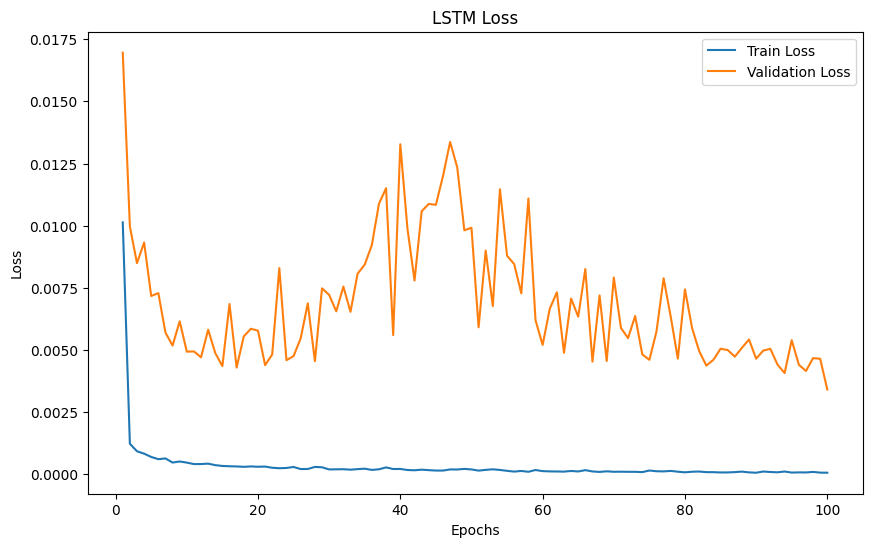

In [ ]:
# 에포크 범위 생성
epochs = list(range(1, wandb.config.epochs + 1))

# Train Loss / Validation Loss Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


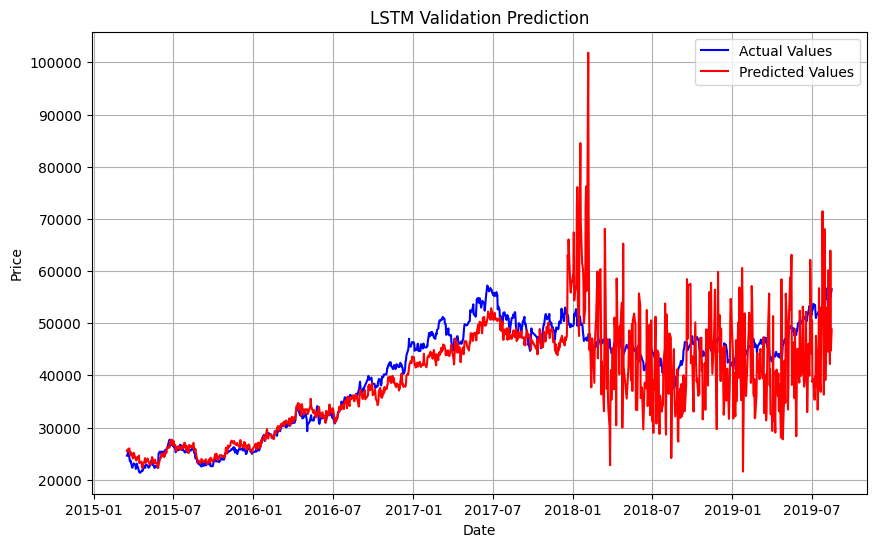

In [ ]:
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper10.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.figure(figsize=(10, 6))
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 4161.6063
MSE: 40535201.5732
RMSE: 6366.7261
R²: 0.5880
--------------------
After Inverse Scaling
MAE: 0.0400
MSE: 0.0034
RMSE: 0.0584
R²: 0.7350


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


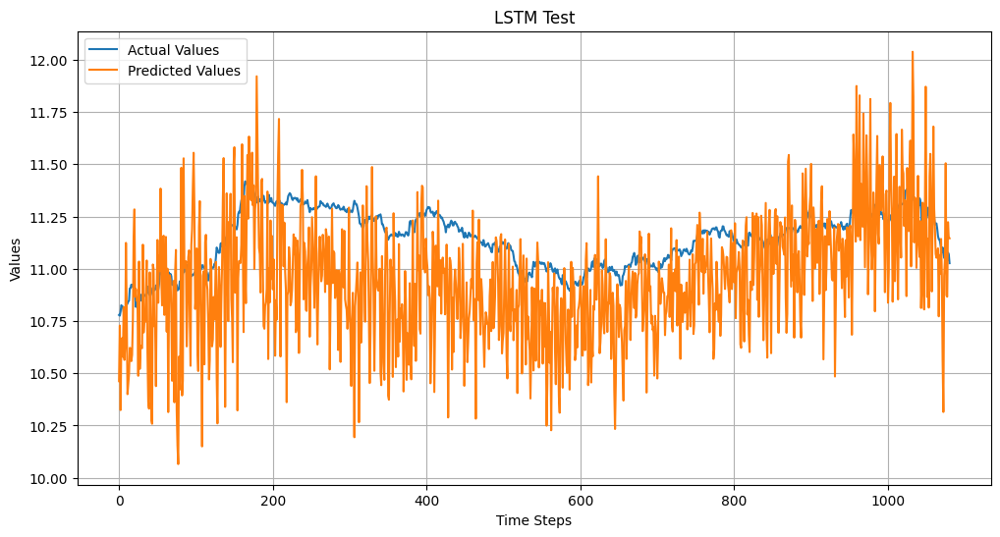

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper10.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values')
plt.plot(y_pred, label='Predicted Values')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▅▅▆▆▇▇▇▇▇▇██
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▅▅▄▃▂▃▂▃▂▂▂▃▄▄▅▃█▄▆▆▇▆▆▅▃▅▄▆▃▂▄▄▃▂▃▃▂▂▂▁
val_mse,█▄▃▂▂▂▂▂▁▁▂▄▂▂▂▃▃▃▃▅▄▅▆▆▄▄▃▃▃▂▂▂▃▂▂▂▂▂▂▁
epoch,100
learning_rate,0.0001
train_loss,6e-05
train_mse,6e-05
val_loss,0.00341


##### 11

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper11", config={
    "epochs": 100,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper11.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

# Conv1D + MaxPooling
conv1 = Conv1D(64, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh')(skip1)

skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)

# Add 레이어에 입력
skip2 = Add()([skip1_reshaped, lstm2])

# Dense Layers
dense1 = Dense(64, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.0005)
model_int_hyper11 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper11.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper11.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper11.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper11.summary()

Epoch 1/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.0840 - mse: 0.0840 - val_loss: 0.0057 - val_mse: 0.0057 - learning_rate: 5.0000e-04
Epoch 2/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0048 - val_mse: 0.0048 - learning_rate: 5.0000e-04
Epoch 3/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 9.8762e-04 - mse: 9.8762e-04 - val_loss: 0.0051 - val_mse: 0.0051 - learning_rate: 5.0000e-04
Epoch 4/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 9.8397e-04 - mse: 9.8397e-04 - val_loss: 0.0048 - val_mse: 0.0048 - learning_rate: 5.0000e-04
Epoch 5/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 6.3340e-04 - mse: 6.3340e-04 - val_loss: 0.0076 - val_mse: 0.0076 - learning_rate: 5.0000e-04
Epoch 6/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 5.6743e-04 - mse: 5.6743e-04 - val_loss: 0.0057 - val_mse: 0.0057 - learning_rate: 5.0000e-04
Epoch 7/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 5.5796e-04 - mse: 

Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_13            │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_6 (Conv1D)         │ (None, 88, 64)         │          3,328 │ input_layer_13[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_6           │ (None, 44, 64)         │              0 │ conv1d_6[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_27 (LSTM)            │ (None, 44, 64)         │         33,024 │ max_pooling1d_6[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_4 (Add)               │ (None, 44, 64)         │              0 │ max_pooling1d_6[0][0], │
│                           │                        │                │ lstm_27[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_8 (Flatten)       │ (None, 2816)           │              0 │ add_4[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_26 (Dense)          │ (None, 64)             │        180,288 │ flatten_8[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_28 (LSTM)            │ (None, 64)             │         33,024 │ add_4[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_5 (Add)               │ (None, 64)             │              0 │ dense_26[0][0],        │
│                           │                        │                │ lstm_28[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_27 (Dense)          │ (None, 64)             │          4,160 │ add_5[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_28 (Dense)          │ (None, 1)              │             65 │ dense_27[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 761,669 (2.91 MB)

 Trainable params: 253,889 (991.75 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 507,780 (1.94 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


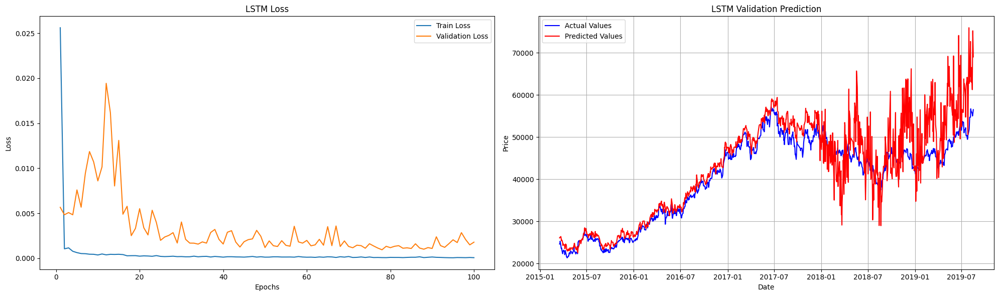

In [ ]:
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper11.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 3377.4152
MSE: 25723708.4406
RMSE: 5071.8545
R²: 0.7385
--------------------
After Inverse Scaling
MAE: 0.0307
MSE: 0.0018
RMSE: 0.0423
R²: 0.8610


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


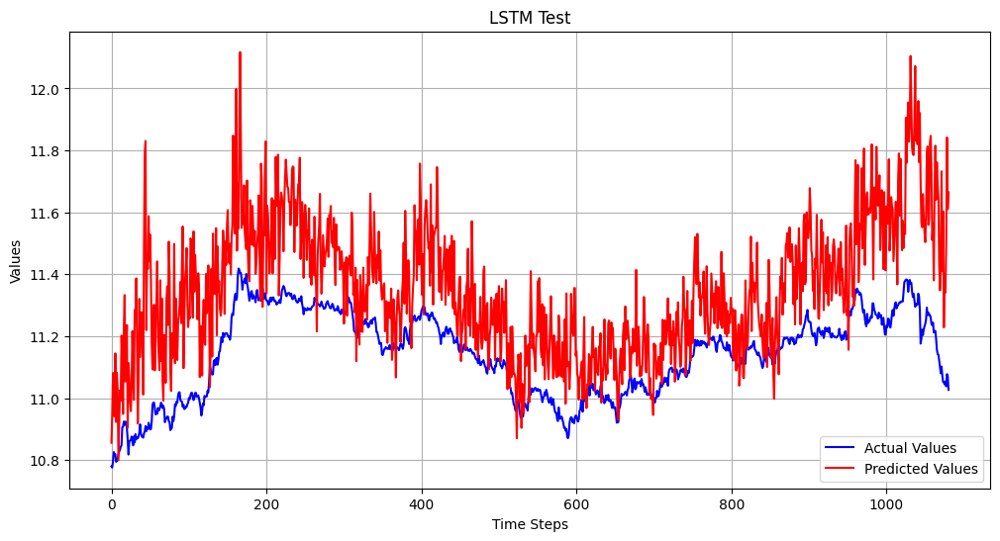

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper11.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 12

In [ ]:
wandb.finish()

epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇██
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▅▄▃▄▃▃▂▂▃▂▂▂▂▂▂▂▂▂▂▂▁▂▂▂▁▂▂▂▂▂▁▁▁▁▁▂▁▁▁
val_loss,▂▄▃▄▅█▆▂▃▂▃▂▁▁▁▁▂▁▁▁▁▁▁▁▂▁▁▂▂▁▁▁▁▁▁▁▂▁▂▁
val_mse,▃▃▄▆▇▅█▄▂▂▂▂▂▁▂▁▁▁▂▂▁▁▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▂
epoch,100
learning_rate,0.0005
train_loss,7e-05
train_mse,7e-05
val_loss,0.00179


In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper12", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper12.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

# Conv1D + MaxPooling
conv1 = Conv1D(64, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh')(skip1)

skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)

# Add 레이어에 입력
skip2 = Add()([skip1_reshaped, lstm2])

# Dense Layers
dense1 = Dense(64, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.001)
model_int_hyper12 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper12.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper12.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper12.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper12.summary()

Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - loss: 0.2912 - mse: 0.2912 - val_loss: 0.0446 - val_mse: 0.0446 - learning_rate: 0.0010
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0363 - val_mse: 0.0363 - learning_rate: 0.0010
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0333 - val_mse: 0.0333 - learning_rate: 0.0010
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 9.9508e-04 - mse: 9.9508e-04 - val_loss: 0.0388 - val_mse: 0.0388 - learning_rate: 0.0010
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 7.2388e-04 - mse: 7.2388e-04 - val_loss: 0.0371 - val_mse: 0.0371 - learning_rate: 0.0010
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0321 - val_mse: 0.0321 - learning_rate: 0.0010
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 5.3542e-04 - mse: 5.3542e-04 - val_loss: 0.0511 - val_mse: 0.0511

Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_14            │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_7 (Conv1D)         │ (None, 88, 64)         │          3,328 │ input_layer_14[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_7           │ (None, 44, 64)         │              0 │ conv1d_7[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_29 (LSTM)            │ (None, 44, 64)         │         33,024 │ max_pooling1d_7[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_6 (Add)               │ (None, 44, 64)         │              0 │ max_pooling1d_7[0][0], │
│                           │                        │                │ lstm_29[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_9 (Flatten)       │ (None, 2816)           │              0 │ add_6[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_29 (Dense)          │ (None, 64)             │        180,288 │ flatten_9[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_30 (LSTM)            │ (None, 64)             │         33,024 │ add_6[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_7 (Add)               │ (None, 64)             │              0 │ dense_29[0][0],        │
│                           │                        │                │ lstm_30[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_30 (Dense)          │ (None, 64)             │          4,160 │ add_7[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_31 (Dense)          │ (None, 1)              │             65 │ dense_30[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 761,669 (2.91 MB)

 Trainable params: 253,889 (991.75 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 507,780 (1.94 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


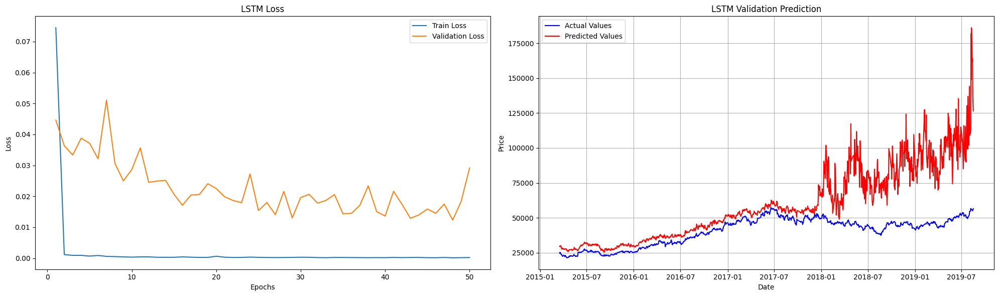

In [ ]:
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper12.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 18651.5131
MSE: 781075858.2706
RMSE: 27947.7344
R²: -6.9387
--------------------
After Inverse Scaling
MAE: 0.1309
MSE: 0.0292
RMSE: 0.1708
R²: -1.2683


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


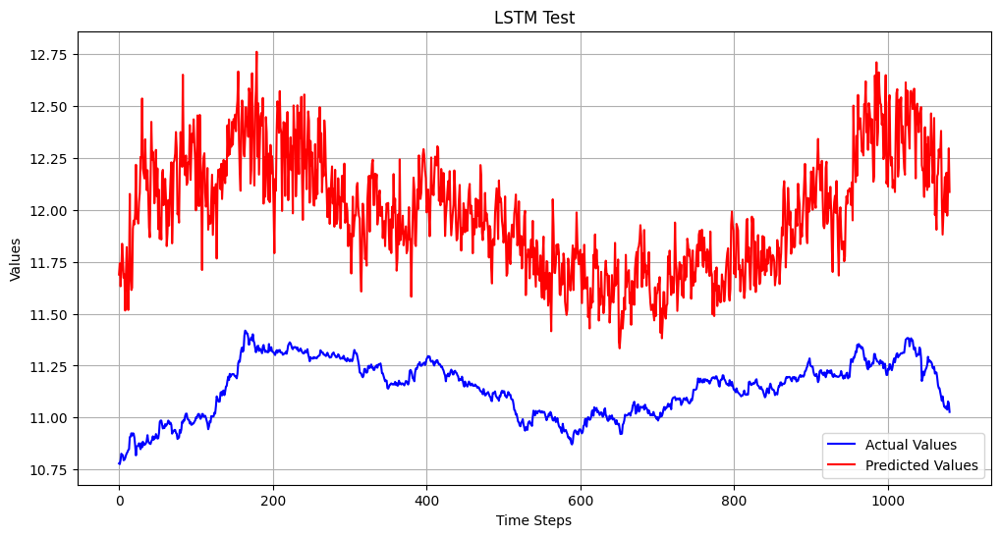

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper12.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇██
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▇▅▅▆▅█▄▃▄▅▃▂▂▂▂▃▂▂▂▄▂▁▃▁▂▂▂▁▁▂▁▁▃▂▁▂▁▂▁▄
val_mse,▅▅▅▅█▃▄▅▃▃▂▂▂▂▃▂▂▂▄▂▁▃▁▂▃▂▂▁▁▂▁▁▃▂▁▂▁▂▁▄
epoch,50
learning_rate,0.001
train_loss,0.00021
train_mse,0.00021
val_loss,0.02917


##### 13

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper13", config={
    "epochs": 100,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper13.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

# Conv1D + MaxPooling
conv1 = Conv1D(64, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh')(skip1)

skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)

# Add 레이어에 입력
skip2 = Add()([skip1_reshaped, lstm2])

# Dense Layers
dense1 = Dense(64, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.0005)
model_int_hyper13 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper13.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper13.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper13.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper13.summary()

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2255 - mse: 0.2255 - val_loss: 0.0216 - val_mse: 0.0216 - learning_rate: 5.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0126 - val_mse: 0.0126 - learning_rate: 5.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0131 - val_mse: 0.0131 - learning_rate: 5.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0162 - val_mse: 0.0162 - learning_rate: 5.0000e-04
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 9.4458e-04 - mse: 9.4458e-04 - val_loss: 0.0135 - val_mse: 0.0135 - learning_rate: 5.0000e-04
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 9.3245e-04 - mse: 9.3245e-04 - val_loss: 0.0109 - val_mse: 0.0109 - learning_rate: 5.0000e-04
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 6.8922e-04 - mse: 6.8922e-04 - val_loss: 0.0104 

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_15            │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_8 (Conv1D)         │ (None, 88, 64)         │          3,328 │ input_layer_15[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_8           │ (None, 44, 64)         │              0 │ conv1d_8[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_31 (LSTM)            │ (None, 44, 64)         │         33,024 │ max_pooling1d_8[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_8 (Add)               │ (None, 44, 64)         │              0 │ max_pooling1d_8[0][0], │
│                           │                        │                │ lstm_31[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_10 (Flatten)      │ (None, 2816)           │              0 │ add_8[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_32 (Dense)          │ (None, 64)             │        180,288 │ flatten_10[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_32 (LSTM)            │ (None, 64)             │         33,024 │ add_8[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_9 (Add)               │ (None, 64)             │              0 │ dense_32[0][0],        │
│                           │                        │                │ lstm_32[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_33 (Dense)          │ (None, 64)             │          4,160 │ add_9[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_34 (Dense)          │ (None, 1)              │             65 │ dense_33[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 761,669 (2.91 MB)

 Trainable params: 253,889 (991.75 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 507,780 (1.94 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


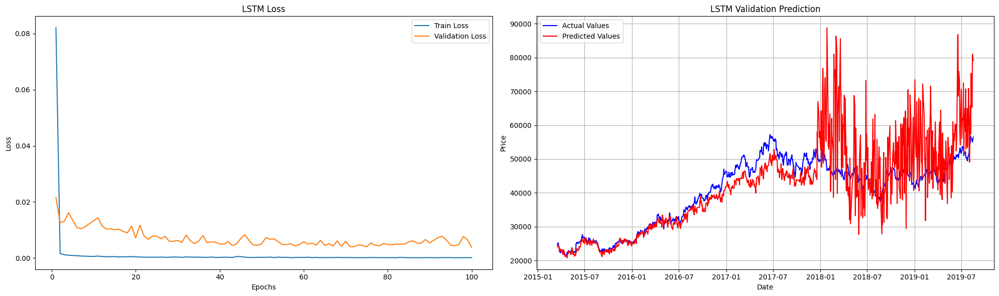

In [ ]:
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper13.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 5019.4107
MSE: 62873656.1356
RMSE: 7929.2910
R²: 0.3610
--------------------
After Inverse Scaling
MAE: 0.0433
MSE: 0.0038
RMSE: 0.0619
R²: 0.7019


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


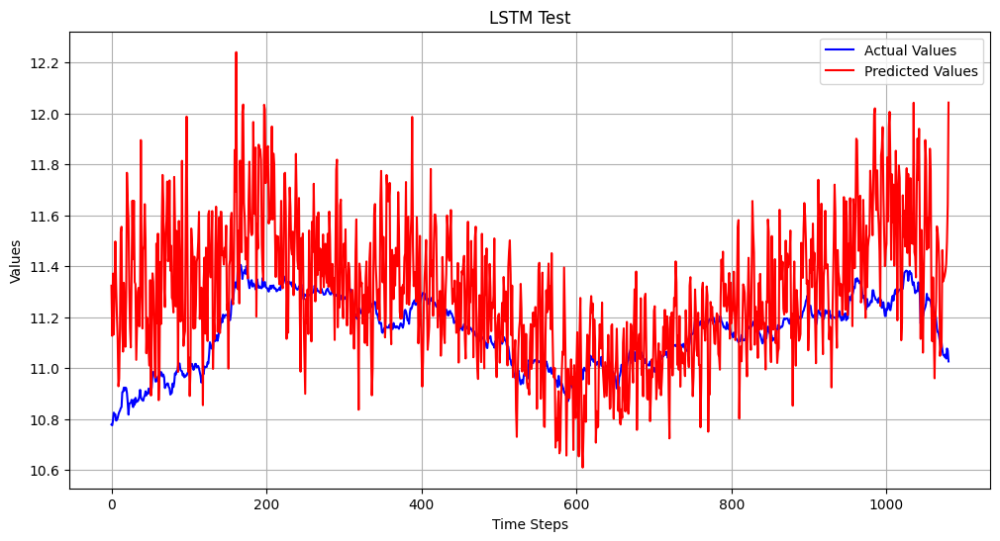

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper13.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▆▅▄▄▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▆▅▄▃▃▂▂▂▂▂▂▂▂▂▂▂▂▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▆▅▄▅▄▃▂▃▂▃▂▂▂▂▂▂▂▁▁▁▃▂▂▂▂▁▂▁▁▁▂▂▂▂▂▁▁▃▁
val_mse,▆▆█▅▅▅▅▄▄▃▃▂▂▂▂▂▂▁▂▁▃▂▁▂▂▁▂▁▁▁▁▁▁▁▂▂▃▃▂▁
epoch,100
learning_rate,0.0005
train_loss,0.00014
train_mse,0.00014
val_loss,0.00383


##### 14

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper14", config={
    "epochs": 100,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [64, 32],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper14.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

# Conv1D + MaxPooling
conv1 = Conv1D(64, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh')(skip1)

skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)

# Add 레이어에 입력
skip2 = Add()([skip1_reshaped, lstm2])

# Dense Layers
dense1 = Dense(32, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.001)
model_int_hyper14 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper14.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper14.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper14.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper14.summary()

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.9013 - mse: 0.9013 - val_loss: 0.0443 - val_mse: 0.0443 - learning_rate: 0.0010
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0037 - mse: 0.0037 - val_loss: 0.0522 - val_mse: 0.0522 - learning_rate: 0.0010
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0413 - val_mse: 0.0413 - learning_rate: 0.0010
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0333 - val_mse: 0.0333 - learning_rate: 0.0010
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0297 - val_mse: 0.0297 - learning_rate: 0.0010
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 9.8465e-04 - mse: 9.8465e-04 - val_loss: 0.0273 - val_mse: 0.0273 - learning_rate: 0.0010
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 8.8467e-04 - mse: 8.8467e-04 - val_loss: 0.0311 - val_mse: 0.0311 - learning_rat

Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_16            │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_9 (Conv1D)         │ (None, 88, 64)         │          3,328 │ input_layer_16[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_9           │ (None, 44, 64)         │              0 │ conv1d_9[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_33 (LSTM)            │ (None, 44, 64)         │         33,024 │ max_pooling1d_9[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_10 (Add)              │ (None, 44, 64)         │              0 │ max_pooling1d_9[0][0], │
│                           │                        │                │ lstm_33[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_11 (Flatten)      │ (None, 2816)           │              0 │ add_10[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_35 (Dense)          │ (None, 32)             │         90,144 │ flatten_11[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_34 (LSTM)            │ (None, 32)             │         12,416 │ add_10[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_11 (Add)              │ (None, 32)             │              0 │ dense_35[0][0],        │
│                           │                        │                │ lstm_34[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_36 (Dense)          │ (None, 32)             │          1,056 │ add_11[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_37 (Dense)          │ (None, 1)              │             33 │ dense_36[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 420,005 (1.60 MB)

 Trainable params: 140,001 (546.88 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 280,004 (1.07 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step


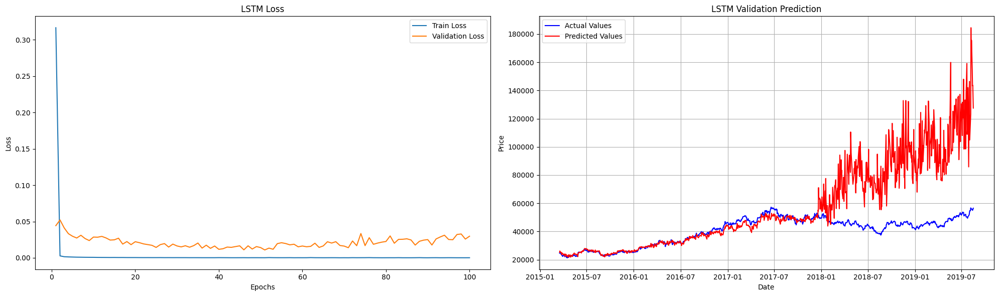

In [ ]:
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper14.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 17350.8966
MSE: 895393121.7037
RMSE: 29923.1202
R²: -8.1006
--------------------
After Inverse Scaling
MAE: 0.1091
MSE: 0.0298
RMSE: 0.1726
R²: -1.3164


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


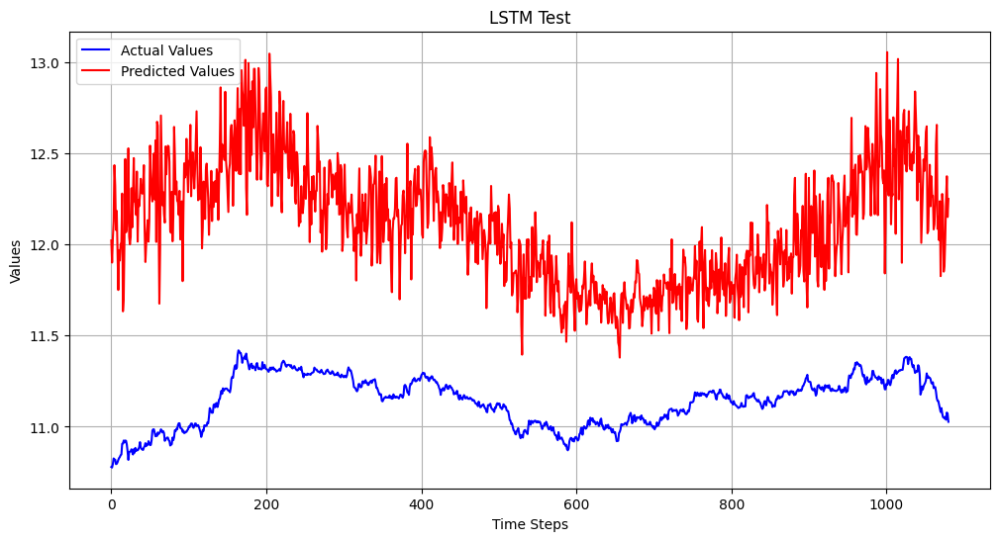

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper14.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇█
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▄▄▃▃▂▂▂▂▂▂▁▁▁▁▂▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▅▄▄▃▄▃▂▂▂▂▁▂▁▂▂▁▂▂▁▂▂▂▂▂▂▃▂▂▃▂▃▄▃▄▃▄▃▃▄
val_mse,█▇▆▆▆▆▃▃▃▃▄▂▂▃▁▁▂▃▁▂▃▂▂▂▄▄▃▆▃▄▄▆▃▅▃▇▅██▇
epoch,100
learning_rate,0.001
train_loss,0.00018
train_mse,0.00018
val_loss,0.02979


##### 15

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper15", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [64, 32],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper15.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

# Conv1D + MaxPooling
conv1 = Conv1D(64, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh')(skip1)

skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)

# Add 레이어에 입력
skip2 = Add()([skip1_reshaped, lstm2])

# Dense Layers
dense1 = Dense(32, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.001)
model_int_hyper15 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper15.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper15.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper15.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper15.summary()

Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2747 - mse: 0.2747 - val_loss: 0.0057 - val_mse: 0.0057 - learning_rate: 0.0010
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0052 - val_mse: 0.0052 - learning_rate: 0.0010
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 8.3785e-04 - mse: 8.3785e-04 - val_loss: 0.0043 - val_mse: 0.0043 - learning_rate: 0.0010
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 7.2749e-04 - mse: 7.2749e-04 - val_loss: 0.0068 - val_mse: 0.0068 - learning_rate: 0.0010
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 7.3692e-04 - mse: 7.3692e-04 - val_loss: 0.0036 - val_mse: 0.0036 - learning_rate: 0.0010
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 5.4945e-04 - mse: 5.4945e-04 - val_loss: 0.0035 - val_mse: 0.0035 - learning_rate: 0.0010
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 5.1089e-04 - mse: 5.1089e-04 - val_loss: 0.0040 -

Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_17            │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_10 (Conv1D)        │ (None, 88, 64)         │          3,328 │ input_layer_17[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_10          │ (None, 44, 64)         │              0 │ conv1d_10[0][0]        │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_35 (LSTM)            │ (None, 44, 64)         │         33,024 │ max_pooling1d_10[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_12 (Add)              │ (None, 44, 64)         │              0 │ max_pooling1d_10[0][0… │
│                           │                        │                │ lstm_35[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_12 (Flatten)      │ (None, 2816)           │              0 │ add_12[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_38 (Dense)          │ (None, 32)             │         90,144 │ flatten_12[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_36 (LSTM)            │ (None, 32)             │         12,416 │ add_12[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_13 (Add)              │ (None, 32)             │              0 │ dense_38[0][0],        │
│                           │                        │                │ lstm_36[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_39 (Dense)          │ (None, 32)             │          1,056 │ add_13[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_40 (Dense)          │ (None, 1)              │             33 │ dense_39[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 420,005 (1.60 MB)

 Trainable params: 140,001 (546.88 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 280,004 (1.07 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


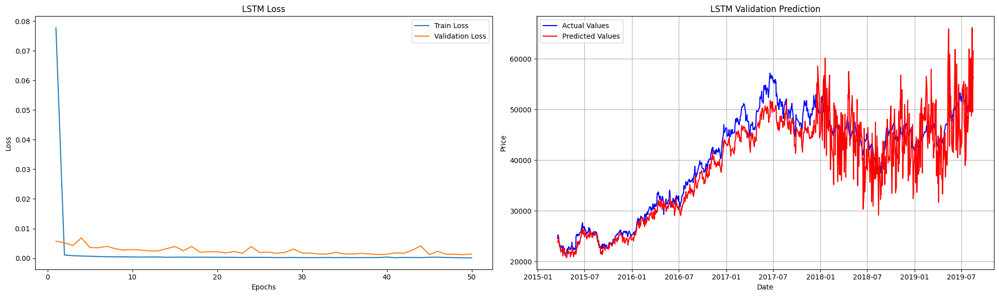

In [ ]:
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper15.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 2968.2708
MSE: 15290843.0523
RMSE: 3910.3508
R²: 0.8446
--------------------
After Inverse Scaling
MAE: 0.0292
MSE: 0.0014
RMSE: 0.0371
R²: 0.8927


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


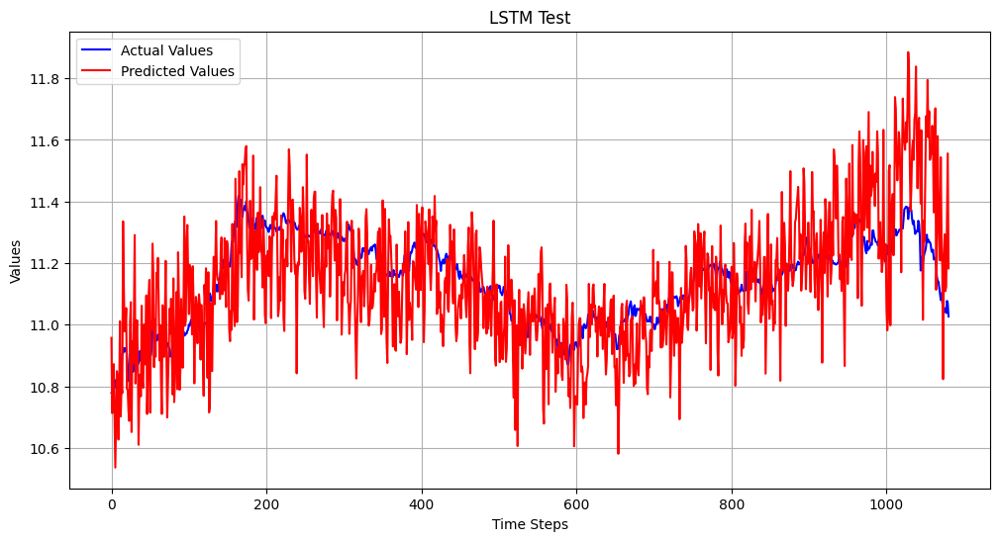

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper15.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 16

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▇▆▅▅▄▃▄▃▃▄▅▃▅▂▃▂▃▂▅▂▂▂▄▂▁▁▂▁▁▁▁▁▂▂▁▃▁▁▁
val_mse,▇▆▅█▄▄▃▃▃▃▃▄▃▄▂▂▂▂▂▄▂▂▂▃▂▁▂▁▁▂▁▁▂▂▃▁▂▁▁▁
epoch,50
learning_rate,0.001
train_loss,0.00013
train_mse,0.00013
val_loss,0.00138


In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper16", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [64, 32],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper16.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

# Conv1D + MaxPooling
conv1 = Conv1D(64, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True, dropout = 0.2)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', dropout = 0.2)(skip1)

skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)

# Add 레이어에 입력
skip2 = Add()([skip1_reshaped, lstm2])

# Dense Layers
dense1 = Dense(32, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.001)
model_int_hyper16 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper16.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper16.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper16.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper16.summary()

Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.2277 - mse: 0.2277 - val_loss: 0.0236 - val_mse: 0.0236 - learning_rate: 0.0010
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0152 - val_mse: 0.0152 - learning_rate: 0.0010
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0084 - val_mse: 0.0084 - learning_rate: 0.0010
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0085 - val_mse: 0.0085 - learning_rate: 0.0010
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0061 - val_mse: 0.0061 - learning_rate: 0.0010
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0039 - val_mse: 0.0039 - learning_rate: 0.0010
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 9.0526e-04 - mse: 9.0526e-04 - val_loss: 0.0038 - val_mse: 0.0038 - learning_rate

Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_18            │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_11 (Conv1D)        │ (None, 88, 64)         │          3,328 │ input_layer_18[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_11          │ (None, 44, 64)         │              0 │ conv1d_11[0][0]        │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_37 (LSTM)            │ (None, 44, 64)         │         33,024 │ max_pooling1d_11[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_14 (Add)              │ (None, 44, 64)         │              0 │ max_pooling1d_11[0][0… │
│                           │                        │                │ lstm_37[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_13 (Flatten)      │ (None, 2816)           │              0 │ add_14[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_41 (Dense)          │ (None, 32)             │         90,144 │ flatten_13[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_38 (LSTM)            │ (None, 32)             │         12,416 │ add_14[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_15 (Add)              │ (None, 32)             │              0 │ dense_41[0][0],        │
│                           │                        │                │ lstm_38[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_42 (Dense)          │ (None, 32)             │          1,056 │ add_15[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_43 (Dense)          │ (None, 1)              │             33 │ dense_42[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 420,005 (1.60 MB)

 Trainable params: 140,001 (546.88 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 280,004 (1.07 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step


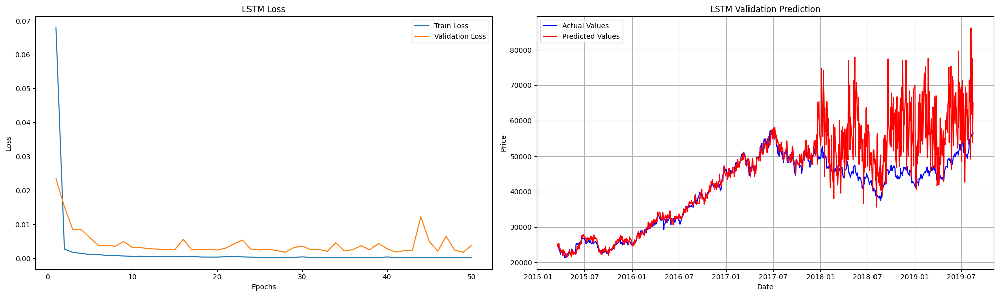

In [ ]:
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper16.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 4637.7464
MSE: 65277137.5473
RMSE: 8079.4268
R²: 0.3365
--------------------
After Inverse Scaling
MAE: 0.0380
MSE: 0.0038
RMSE: 0.0613
R²: 0.7082


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


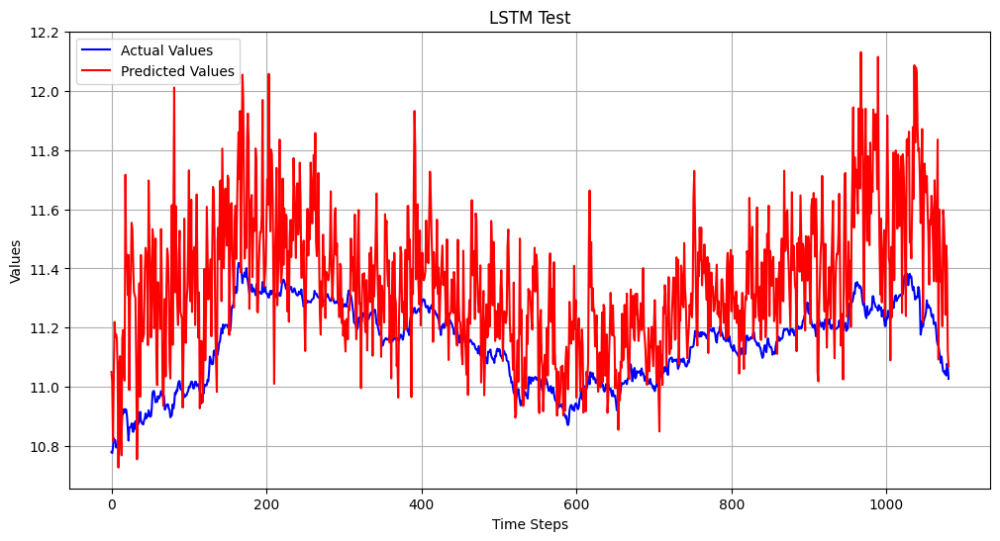

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper16.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇██
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▅▃▃▂▂▂▂▁▁▁▁▁▂▁▁▁▁▂▂▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▄▂▃▁▂
val_mse,█▅▃▃▂▂▂▂▁▁▁▁▁▂▁▁▁▂▂▁▁▁▁▁▂▁▁▂▁▁▁▂▁▁▁▄▂▁▃▂
epoch,50
learning_rate,0.001
train_loss,0.00019
train_mse,0.00019
val_loss,0.00377


##### 17

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper17", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [64, 32],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper17.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

# Conv1D + MaxPooling
conv1 = Conv1D(64, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True, dropout = 0.2)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', dropout = 0.2)(skip1)

skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)

# Add 레이어에 입력
skip2 = Add()([skip1_reshaped, lstm2])

# Dense Layers
dense1 = Dense(32, activation='relu')(skip2)
dropout = Dropout(0.2)(dense1)
output_layer = Dense(1)(dropout)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper17 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper17.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper17.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper17.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper17.summary()

Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1363 - mse: 0.1363 - val_loss: 0.0331 - val_mse: 0.0331 - learning_rate: 1.0000e-04
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0225 - mse: 0.0225 - val_loss: 0.0265 - val_mse: 0.0265 - learning_rate: 1.0000e-04
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0176 - mse: 0.0176 - val_loss: 0.0206 - val_mse: 0.0206 - learning_rate: 1.0000e-04
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0171 - mse: 0.0171 - val_loss: 0.0141 - val_mse: 0.0141 - learning_rate: 1.0000e-04
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0155 - mse: 0.0155 - val_loss: 0.0268 - val_mse: 0.0268 - learning_rate: 1.0000e-04
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0143 - mse: 0.0143 - val_loss: 0.0269 - val_mse: 0.0269 - learning_rate: 1.0000e-04
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0134 - mse: 0.0134 - val_loss: 0.0124 - val_mse: 0.0124

Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_19            │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_12 (Conv1D)        │ (None, 88, 64)         │          3,328 │ input_layer_19[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_12          │ (None, 44, 64)         │              0 │ conv1d_12[0][0]        │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_39 (LSTM)            │ (None, 44, 64)         │         33,024 │ max_pooling1d_12[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_16 (Add)              │ (None, 44, 64)         │              0 │ max_pooling1d_12[0][0… │
│                           │                        │                │ lstm_39[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_14 (Flatten)      │ (None, 2816)           │              0 │ add_16[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_44 (Dense)          │ (None, 32)             │         90,144 │ flatten_14[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_40 (LSTM)            │ (None, 32)             │         12,416 │ add_16[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_17 (Add)              │ (None, 32)             │              0 │ dense_44[0][0],        │
│                           │                        │                │ lstm_40[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_45 (Dense)          │ (None, 32)             │          1,056 │ add_17[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 32)             │              0 │ dense_45[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_46 (Dense)          │ (None, 1)              │             33 │ dropout[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 420,005 (1.60 MB)

 Trainable params: 140,001 (546.88 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 280,004 (1.07 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


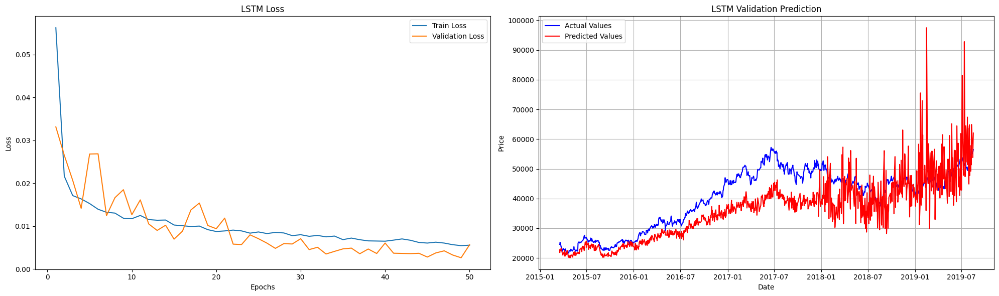

In [ ]:
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper17.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 6240.0313
MSE: 61003541.9772
RMSE: 7810.4764
R²: 0.3800
--------------------
After Inverse Scaling
MAE: 0.0642
MSE: 0.0056
RMSE: 0.0748
R²: 0.5651


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


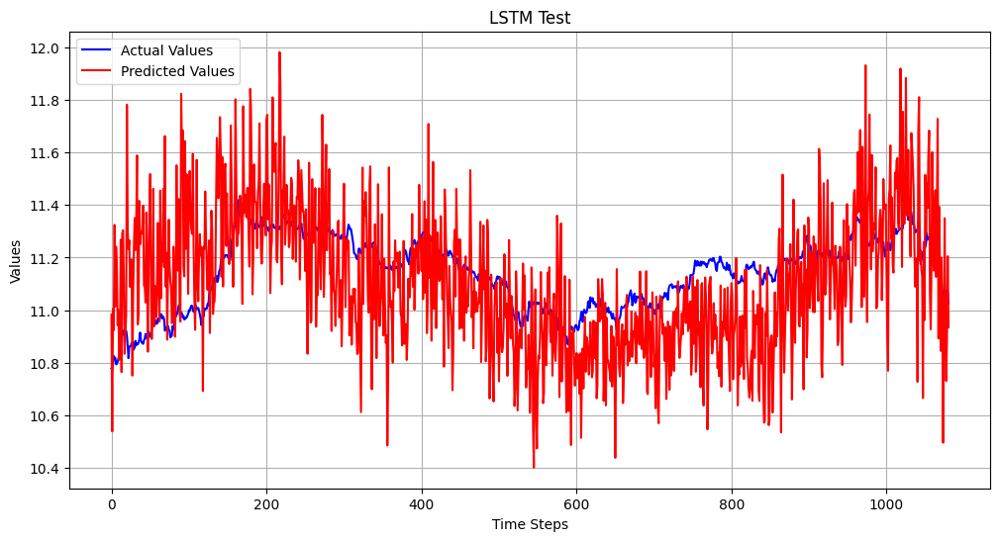

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper17.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▆▅▄▇▃▄▅▃▄▂▃▂▂▄▃▃▂▂▂▂▁▂▂▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▂
val_mse,█▆▅▄▇▃▄▃▄▃▃▂▂▄▄▃▃▂▂▂▂▁▂▂▂▂▁▁▁▁▁▂▁▁▁▁▁▁▁▂
epoch,50
learning_rate,0.0001
train_loss,0.00556
train_mse,0.00556
val_loss,0.00564


##### 18

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper18", config={
    "epochs": 100,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [64, 32],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper18.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

# Conv1D + MaxPooling
conv1 = Conv1D(64, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True, dropout = 0.2)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', dropout = 0.2)(skip1)

skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)

# Add 레이어에 입력
skip2 = Add()([skip1_reshaped, lstm2])

# Dense Layers
dense1 = Dense(32, activation='relu')(skip2)
dropout = Dropout(0.2)(dense1)
output_layer = Dense(1)(dropout)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper18 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper18.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper18.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper18.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper18.summary()

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.0927 - mse: 0.0927 - val_loss: 0.0129 - val_mse: 0.0129 - learning_rate: 1.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0249 - mse: 0.0249 - val_loss: 0.0117 - val_mse: 0.0117 - learning_rate: 1.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0205 - mse: 0.0205 - val_loss: 0.0099 - val_mse: 0.0099 - learning_rate: 1.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0198 - mse: 0.0198 - val_loss: 0.0104 - val_mse: 0.0104 - learning_rate: 1.0000e-04
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0171 - mse: 0.0171 - val_loss: 0.0100 - val_mse: 0.0100 - learning_rate: 1.0000e-04
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0151 - mse: 0.0151 - val_loss: 0.0139 - val_mse: 0.0139 - learning_rate: 1.0000e-04
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0137 - mse: 0.0137 - val_loss: 0.0084 - val_mse: 0.0084 - lear

Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_20            │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_13 (Conv1D)        │ (None, 88, 64)         │          3,328 │ input_layer_20[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_13          │ (None, 44, 64)         │              0 │ conv1d_13[0][0]        │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_41 (LSTM)            │ (None, 44, 64)         │         33,024 │ max_pooling1d_13[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_18 (Add)              │ (None, 44, 64)         │              0 │ max_pooling1d_13[0][0… │
│                           │                        │                │ lstm_41[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_15 (Flatten)      │ (None, 2816)           │              0 │ add_18[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_47 (Dense)          │ (None, 32)             │         90,144 │ flatten_15[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_42 (LSTM)            │ (None, 32)             │         12,416 │ add_18[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_19 (Add)              │ (None, 32)             │              0 │ dense_47[0][0],        │
│                           │                        │                │ lstm_42[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_48 (Dense)          │ (None, 32)             │          1,056 │ add_19[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 32)             │              0 │ dense_48[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_49 (Dense)          │ (None, 1)              │             33 │ dropout_1[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 420,005 (1.60 MB)

 Trainable params: 140,001 (546.88 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 280,004 (1.07 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


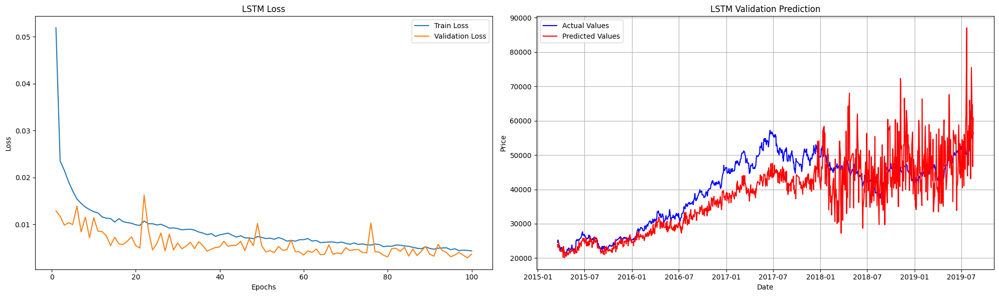

In [ ]:
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper18.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 5148.1480
MSE: 43001225.6219
RMSE: 6557.5320
R²: 0.5629
--------------------
After Inverse Scaling
MAE: 0.0506
MSE: 0.0037
RMSE: 0.0608
R²: 0.7130


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


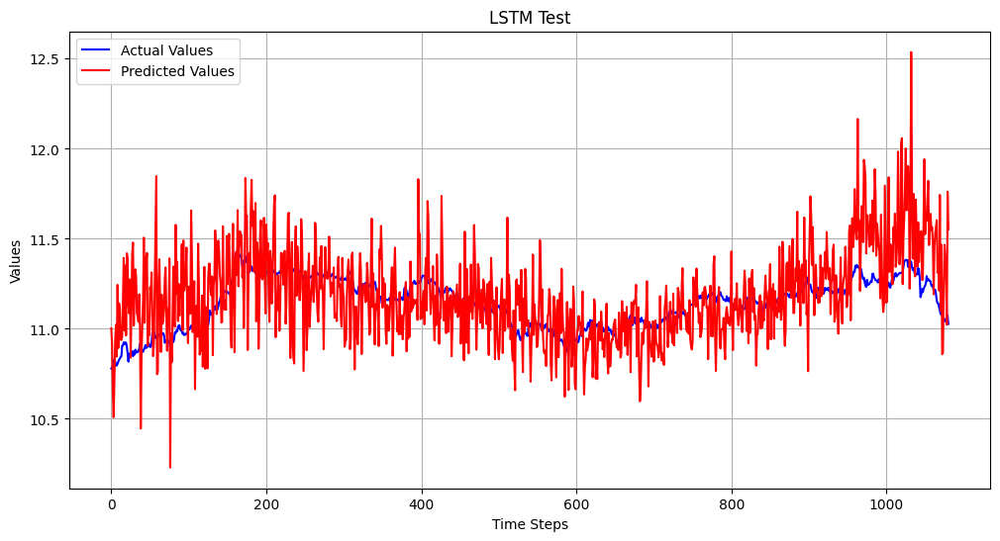

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper18.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇██
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▅▄▄▄▄▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▆█▇▆▅▃▄▂▃▄▃▂▃▃▂▂▃▂▂▃▂▁▁▂▂▂▂▂▂▁▂▁▂▁▂▂▂▁▁▁
val_mse,█▄▅▄▃▃▂▅▄▄▃▃▃▂▃▃▃▆▃▂▂▂▂▁▂▁▁▂▁▂▂▁▁▂▂▂▂▂▁▁
epoch,100
learning_rate,0.0001
train_loss,0.00437
train_mse,0.00437
val_loss,0.00367


##### 19

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper19", config={
    "epochs": 100,
    "batch_size": 128,
    "time_steps": 90,
    "lstm_units": [64, 32],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper19.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

# Conv1D + MaxPooling
conv1 = Conv1D(64, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True, dropout = 0.2)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', dropout = 0.2)(skip1)

skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)

# Add 레이어에 입력
skip2 = Add()([skip1_reshaped, lstm2])

# Dense Layers
dense1 = Dense(32, activation='relu')(skip2)
dropout = Dropout(0.2)(dense1)
output_layer = Dense(1)(dropout)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper19 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper19.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper19.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper19.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper19.summary()

Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step - loss: 0.1452 - mse: 0.1452 - val_loss: 0.0271 - val_mse: 0.0271 - learning_rate: 1.0000e-04
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0396 - mse: 0.0396 - val_loss: 0.0347 - val_mse: 0.0347 - learning_rate: 1.0000e-04
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0265 - mse: 0.0265 - val_loss: 0.0356 - val_mse: 0.0356 - learning_rate: 1.0000e-04
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0233 - mse: 0.0233 - val_loss: 0.0431 - val_mse: 0.0431 - learning_rate: 1.0000e-04
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0229 - mse: 0.0229 - val_loss: 0.0463 - val_mse: 0.0463 - learning_rate: 1.0000e-04
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0212 - mse: 0.0212 - val_loss: 0.0352 - val_mse: 0.0352 - learning_rate: 1.0000e-04
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0195 - mse: 0.0195 - val_loss: 0.0325 - val_mse: 0.0325 - lear

Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_21            │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_14 (Conv1D)        │ (None, 88, 64)         │          3,328 │ input_layer_21[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_14          │ (None, 44, 64)         │              0 │ conv1d_14[0][0]        │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_43 (LSTM)            │ (None, 44, 64)         │         33,024 │ max_pooling1d_14[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_20 (Add)              │ (None, 44, 64)         │              0 │ max_pooling1d_14[0][0… │
│                           │                        │                │ lstm_43[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_16 (Flatten)      │ (None, 2816)           │              0 │ add_20[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_50 (Dense)          │ (None, 32)             │         90,144 │ flatten_16[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_44 (LSTM)            │ (None, 32)             │         12,416 │ add_20[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_21 (Add)              │ (None, 32)             │              0 │ dense_50[0][0],        │
│                           │                        │                │ lstm_44[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_51 (Dense)          │ (None, 32)             │          1,056 │ add_21[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 32)             │              0 │ dense_51[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_52 (Dense)          │ (None, 1)              │             33 │ dropout_2[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 420,005 (1.60 MB)

 Trainable params: 140,001 (546.88 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 280,004 (1.07 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


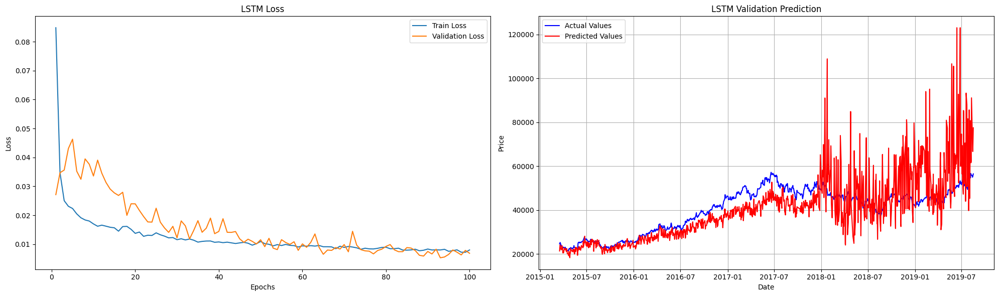

In [ ]:
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper19.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 7146.1151
MSE: 118361206.9982
RMSE: 10879.3937
R²: -0.2030
--------------------
After Inverse Scaling
MAE: 0.0642
MSE: 0.0070
RMSE: 0.0834
R²: 0.4595


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


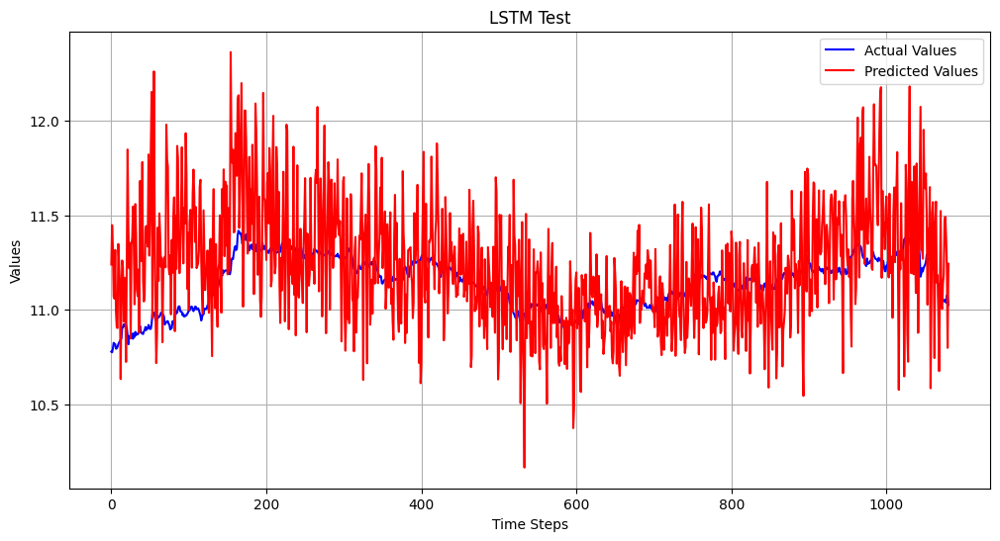

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper19.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 20

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇█████
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▇▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▂▂▂▁▂▂▂▂▁▁▁▁▁
val_loss,▇▇██▆▅▆▅▄▄▄▃▃▃▄▃▃▂▂▂▂▁▂▂▃▂▂▂▂▁▁▂▁▁▂▁▂▁▁▁
val_mse,▅▆▇█▆▅▅▄▃▄▃▂▂▂▂▂▂▂▁▂▂▁▂▂▂▂▁▂▂▁▁▁▁▂▁▁▁▁▁▁
epoch,100
learning_rate,0.0001
train_loss,0.00803
train_mse,0.00803
val_loss,0.00688


In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper20", config={
    "epochs": 100,
    "batch_size": 128,
    "time_steps": 90,
    "lstm_units": [64, 32],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper20.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

# Conv1D + MaxPooling
conv1 = Conv1D(64, kernel_size=5, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True, dropout = 0.3)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', dropout = 0.3)(skip1)

skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)

# Add 레이어에 입력
skip2 = Add()([skip1_reshaped, lstm2])

# Dense Layers
dense1 = Dense(32, activation='relu')(skip2)
dropout = Dropout(0.3)(dense1)
output_layer = Dense(1)(dropout)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper20 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper20.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper20.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper20.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper20.summary()

Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.1596 - mse: 0.1596 - val_loss: 0.0499 - val_mse: 0.0499 - learning_rate: 1.0000e-04
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0473 - mse: 0.0473 - val_loss: 0.0306 - val_mse: 0.0306 - learning_rate: 1.0000e-04
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0400 - mse: 0.0400 - val_loss: 0.0247 - val_mse: 0.0247 - learning_rate: 1.0000e-04
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0314 - mse: 0.0314 - val_loss: 0.0319 - val_mse: 0.0319 - learning_rate: 1.0000e-04
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0288 - mse: 0.0288 - val_loss: 0.0199 - val_mse: 0.0199 - learning_rate: 1.0000e-04
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0262 - mse: 0.0262 - val_loss: 0.0211 - val_mse: 0.0211 - learning_rate: 1.0000e-04
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0262 - mse: 0.0262 - val_loss: 0.0288 - val_mse: 0.0288 - lear

Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_22            │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_15 (Conv1D)        │ (None, 86, 64)         │          5,504 │ input_layer_22[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_15          │ (None, 43, 64)         │              0 │ conv1d_15[0][0]        │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_45 (LSTM)            │ (None, 43, 64)         │         33,024 │ max_pooling1d_15[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_22 (Add)              │ (None, 43, 64)         │              0 │ max_pooling1d_15[0][0… │
│                           │                        │                │ lstm_45[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_17 (Flatten)      │ (None, 2752)           │              0 │ add_22[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_53 (Dense)          │ (None, 32)             │         88,096 │ flatten_17[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_46 (LSTM)            │ (None, 32)             │         12,416 │ add_22[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_23 (Add)              │ (None, 32)             │              0 │ dense_53[0][0],        │
│                           │                        │                │ lstm_46[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_54 (Dense)          │ (None, 32)             │          1,056 │ add_23[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 32)             │              0 │ dense_54[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_55 (Dense)          │ (None, 1)              │             33 │ dropout_3[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 420,389 (1.60 MB)

 Trainable params: 140,129 (547.38 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 280,260 (1.07 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step


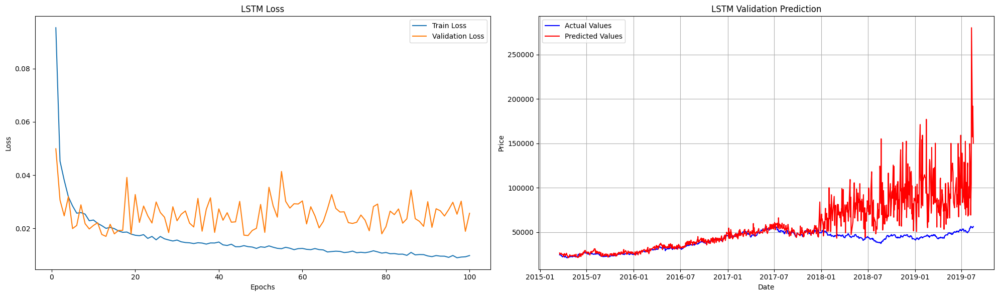

In [ ]:
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper20.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 16566.9198
MSE: 883653327.2904
RMSE: 29726.3070
R²: -7.9813
--------------------
After Inverse Scaling
MAE: 0.1067
MSE: 0.0279
RMSE: 0.1670
R²: -1.1687


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


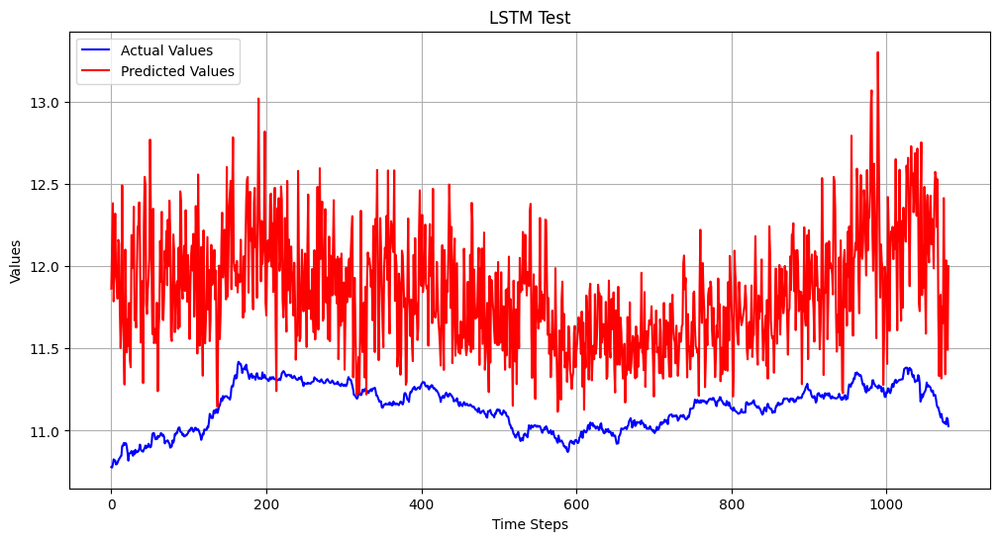

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper20.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇██
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▇▆▆▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁
train_mse,█▆▅▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▅▅▂▂▂▂▁▁▂▅▄▄▃▁▄▂▅▁▁▂▄▆█▅▅▃▄▄▃▃▁▂▄▃▄▂▅▄▃▃
val_mse,▅▅▂▄▂▂▂▇▁▃▃▂▁▄▅▃▂▁▂▁▄▃█▄▄▃▅▄▂▃▁▄▁▃▂▃▂▄▃▁
epoch,100
learning_rate,0.0001
train_loss,0.00978
train_mse,0.00978
val_loss,0.02566


##### 21

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper21", config={
    "epochs": 100,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [64, 32],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper21.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

# Conv1D + MaxPooling
conv1 = Conv1D(64, kernel_size=7, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True, dropout = 0.2)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', dropout = 0.2)(skip1)

skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)

# Add 레이어에 입력
skip2 = Add()([skip1_reshaped, lstm2])

# Dense Layers
dense1 = Dense(32, activation='relu')(skip2)
dropout = Dropout(0.2)(dense1)
output_layer = Dense(1)(dropout)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper21 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper21.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper21.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper21.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper21.summary()

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - loss: 0.1028 - mse: 0.1028 - val_loss: 0.0331 - val_mse: 0.0331 - learning_rate: 1.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0284 - mse: 0.0284 - val_loss: 0.0315 - val_mse: 0.0315 - learning_rate: 1.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0207 - mse: 0.0207 - val_loss: 0.0304 - val_mse: 0.0304 - learning_rate: 1.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0189 - mse: 0.0189 - val_loss: 0.0234 - val_mse: 0.0234 - learning_rate: 1.0000e-04
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0168 - mse: 0.0168 - val_loss: 0.0249 - val_mse: 0.0249 - learning_rate: 1.0000e-04
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0168 - mse: 0.0168 - val_loss: 0.0184 - val_mse: 0.0184 - learning_rate: 1.0000e-04
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0156 - mse: 0.0156 - val_loss: 0.0186 - val_mse: 0.0186 - lea

Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_23            │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_16 (Conv1D)        │ (None, 84, 64)         │          7,680 │ input_layer_23[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_16          │ (None, 42, 64)         │              0 │ conv1d_16[0][0]        │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_47 (LSTM)            │ (None, 42, 64)         │         33,024 │ max_pooling1d_16[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_24 (Add)              │ (None, 42, 64)         │              0 │ max_pooling1d_16[0][0… │
│                           │                        │                │ lstm_47[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_18 (Flatten)      │ (None, 2688)           │              0 │ add_24[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_56 (Dense)          │ (None, 32)             │         86,048 │ flatten_18[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_48 (LSTM)            │ (None, 32)             │         12,416 │ add_24[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_25 (Add)              │ (None, 32)             │              0 │ dense_56[0][0],        │
│                           │                        │                │ lstm_48[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_57 (Dense)          │ (None, 32)             │          1,056 │ add_25[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_4 (Dropout)       │ (None, 32)             │              0 │ dense_57[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_58 (Dense)          │ (None, 1)              │             33 │ dropout_4[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 420,773 (1.61 MB)

 Trainable params: 140,257 (547.88 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 280,516 (1.07 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step


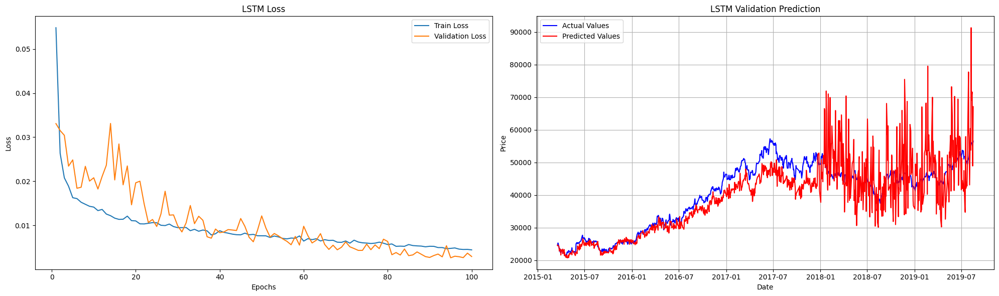

In [ ]:
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper21.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val =y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(same_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

Before Inverse Scaling
MAE: 4484.6272
MSE: 40543951.2500
RMSE: 6367.4132
R²: 0.5879
--------------------
After Inverse Scaling
MAE: 0.0416
MSE: 0.0030
RMSE: 0.0544
R²: 0.7698


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


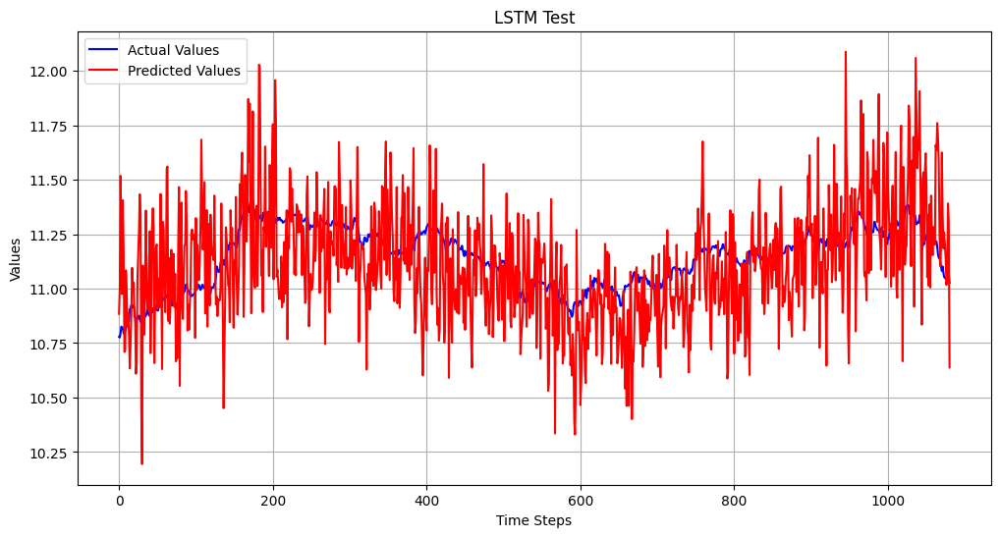

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper21.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 23

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▄▃▂▂▂▂▂▃▁▂▂▂▂▂▃▂▂▂▂▁▂▁▂▂▁▁▂▂▃▁▂▁▁▁▁▁▂▁▂
val_mse,▆█▇▅▄▂▃▅▄▂▄▆▅▄▄▇▄▄▃▄▃▃▂▄▅▃▂▄▇▇▂▄▁▃▃▁▄▁▄▃
epoch,50
train_loss,0.00059
train_mse,0.00047
val_loss,0.02504
val_mse,0.02492


In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper23", config={
    "epochs": 100,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [64, 32],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper23.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

# Conv1D + MaxPooling
conv1 = Conv1D(64, kernel_size=5, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.002), return_sequences=True)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.002))(skip1)

skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)

# Add 레이어에 입력
skip2 = Add()([skip1_reshaped, lstm2])

# Dense Layers
dense1 = Dense(32, activation='relu')(skip2)
dropout = Dropout(0.2)(dense1)
output_layer = Dense(1)(dropout)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper23 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper23.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper23.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper23.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper23.summary()

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.9225 - mse: 0.5538 - val_loss: 0.3764 - val_mse: 0.0224 - learning_rate: 1.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3703 - mse: 0.0214 - val_loss: 0.3392 - val_mse: 0.0060 - learning_rate: 1.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3487 - mse: 0.0207 - val_loss: 0.3192 - val_mse: 0.0065 - learning_rate: 1.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3280 - mse: 0.0203 - val_loss: 0.3000 - val_mse: 0.0070 - learning_rate: 1.0000e-04
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3056 - mse: 0.0174 - val_loss: 0.2802 - val_mse: 0.0060 - learning_rate: 1.0000e-04
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2854 - mse: 0.0156 - val_loss: 0.2626 - val_mse: 0.0061 - learning_rate: 1.0000e-04
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2672 - mse: 0.0149 - val_loss: 0.2451 - val_mse: 0.0052 - lea

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_1 (Conv1D)         │ (None, 86, 64)         │          5,504 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_1           │ (None, 43, 64)         │              0 │ conv1d_1[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_6 (LSTM)             │ (None, 43, 64)         │         33,024 │ max_pooling1d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 43, 64)         │              0 │ max_pooling1d_1[0][0], │
│                           │                        │                │ lstm_6[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 2752)           │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 32)             │         88,096 │ flatten[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_7 (LSTM)             │ (None, 32)             │         12,416 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_1 (Add)               │ (None, 32)             │              0 │ dense_4[0][0],         │
│                           │                        │                │ lstm_7[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_5 (Dense)           │ (None, 32)             │          1,056 │ add_1[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 32)             │              0 │ dense_5[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_6 (Dense)           │ (None, 1)              │             33 │ dropout[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 420,389 (1.60 MB)

 Trainable params: 140,129 (547.38 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 280,260 (1.07 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step


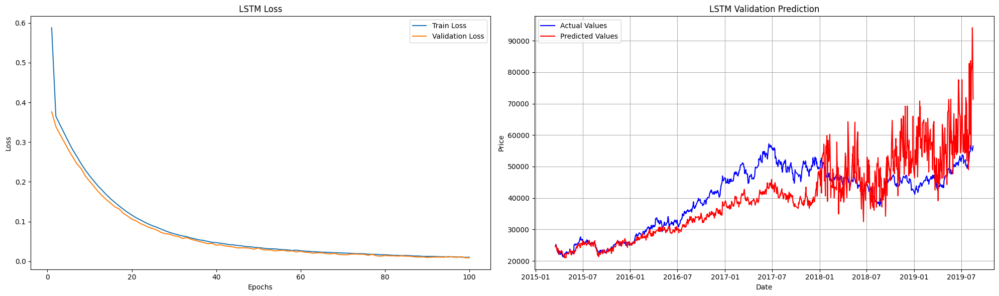

Before Inverse Scaling
MAE: 5968.5718
MSE: 63561462.0247
RMSE: 7972.5443
R²: 0.3540
--------------------
After Inverse Scaling
MAE: 0.0545
MSE: 0.0046
RMSE: 0.0676
R²: 0.6449
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


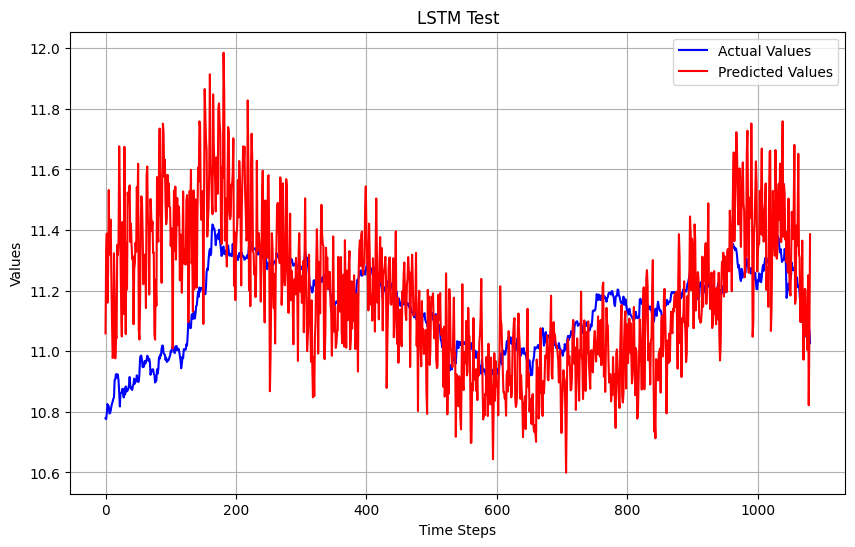

In [ ]:
#################### Loss and Val Predict #####################
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper23.predict(X_val) # 여기 모델 이름 바꾸기
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val = y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

################### Metric Calculation #############################
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

################### Test #######################
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper23.predict(X_test) # 모델 이름 바꾸기
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 24

In [ ]:
wandb.finish()

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper24", config={
    "epochs": 100,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [64, 32],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper24.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

conv1 = Conv1D(64, kernel_size=5, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.002), return_sequences=True)(pool1)

#skip1 = Add()([pool1, lstm1])

lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.002))(lstm1)

# skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
# skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)
# skip2 = Add()([skip1_reshaped, lstm2])

lstm2_adjusted = Dense(wandb.config.lstm_units[0])(lstm2)
skip2 = Add()([lstm1, lstm2_adjusted])

dense1 = Dense(32, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper24 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper24.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper24.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper24.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper24.summary()

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.4725 - mse: 0.1055 - val_loss: 0.3885 - val_mse: 0.0403 - learning_rate: 1.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3466 - mse: 0.0048 - val_loss: 0.3476 - val_mse: 0.0249 - learning_rate: 1.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3190 - mse: 0.0025 - val_loss: 0.3227 - val_mse: 0.0243 - learning_rate: 1.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.2942 - mse: 0.0017 - val_loss: 0.3007 - val_mse: 0.0253 - learning_rate: 1.0000e-04
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.2714 - mse: 0.0015 - val_loss: 0.2802 - val_mse: 0.0262 - learning_rate: 1.0000e-04
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.2502 - mse: 0.0012 - val_loss: 0.2607 - val_mse: 0.0266 - learning_rate: 1.0000e-04
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.2305 - mse: 0.0011 - val_loss: 0.2418 - val_mse: 0.0261 - lea

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_2 (Conv1D)         │ (None, 86, 64)         │          5,504 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_2           │ (None, 43, 64)         │              0 │ conv1d_2[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_4 (LSTM)             │ (None, 43, 64)         │         33,024 │ max_pooling1d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_5 (LSTM)             │ (None, 32)             │         12,416 │ lstm_4[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 64)             │          2,112 │ lstm_5[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_1 (Add)               │ (None, 43, 64)         │              0 │ lstm_4[0][0],          │
│                           │                        │                │ dense_3[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 43, 32)         │          2,080 │ add_1[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_5 (Dense)           │ (None, 43, 1)          │             33 │ dense_4[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 165,509 (646.52 KB)

 Trainable params: 55,169 (215.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 110,340 (431.02 KB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


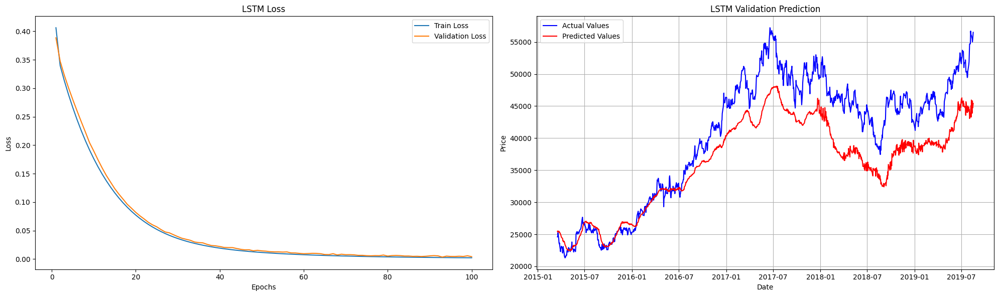

Before Inverse Scaling
MAE: 4483.0392
MSE: 29876732.6871
RMSE: 5465.9613
R²: 0.6963
--------------------
After Inverse Scaling
MAE: 0.0442
MSE: 0.0028
RMSE: 0.0525
R²: 0.7861
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


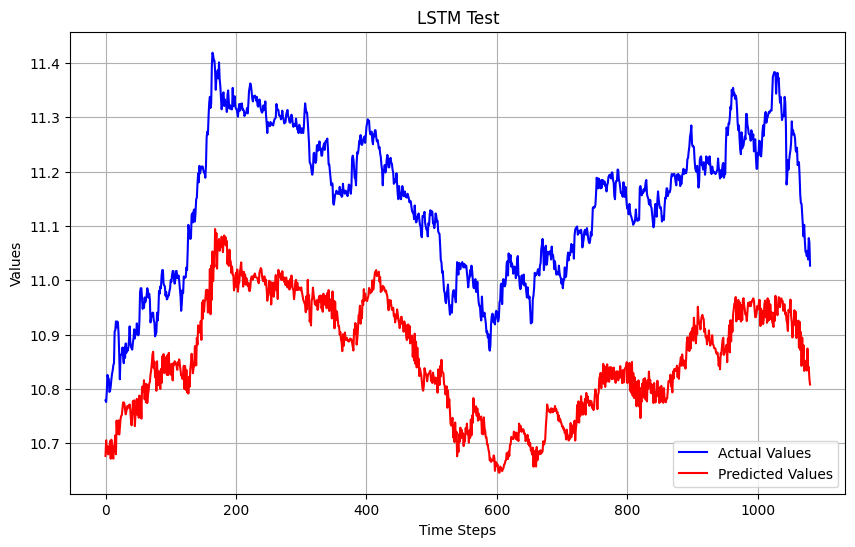

In [ ]:
#################### Loss and Val Predict #####################
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper24.predict(X_val) # 여기 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val = y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

################### Metric Calculation #############################
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

################### Test #######################
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper24.predict(X_test) # 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 25

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇█
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▇▆▅▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,██▇▆▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_mse,█▇███▇▆▅▄▄▃▃▃▂▂▂▂▂▂▁▂▁▁▁▂▁▂▁▂▁▂▁▁▁▁▂▁▁▁▂
epoch,100
learning_rate,0.0001
train_loss,0.00236
train_mse,0.00043
val_loss,0.00433


In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper25", config={
    "epochs": 100,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [64, 32],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper25.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

conv1 = Conv1D(64, kernel_size=7, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.002), return_sequences=True)(pool1)

#skip1 = Add()([pool1, lstm1])

lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.001))(lstm1)

# skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
# skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)
# skip2 = Add()([skip1_reshaped, lstm2])

lstm2_adjusted = Dense(wandb.config.lstm_units[0])(lstm2)
skip2 = Add()([lstm1, lstm2_adjusted])

dense1 = Dense(32, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper25 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper25.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper25.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper25.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper25.summary()

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.4264 - mse: 0.1425 - val_loss: 0.3350 - val_mse: 0.0638 - learning_rate: 1.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2749 - mse: 0.0081 - val_loss: 0.2802 - val_mse: 0.0267 - learning_rate: 1.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2510 - mse: 0.0018 - val_loss: 0.2597 - val_mse: 0.0234 - learning_rate: 1.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.2332 - mse: 0.0011 - val_loss: 0.2414 - val_mse: 0.0215 - learning_rate: 1.0000e-04
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.2170 - mse: 9.3699e-04 - val_loss: 0.2286 - val_mse: 0.0241 - learning_rate: 1.0000e-04
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.2018 - mse: 8.9752e-04 - val_loss: 0.2116 - val_mse: 0.0215 - learning_rate: 1.0000e-04
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.1875 - mse: 7.8563e-04 - val_loss: 0.1996 - val_mse: 0

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_2 (Conv1D)         │ (None, 86, 64)         │          5,504 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_2           │ (None, 43, 64)         │              0 │ conv1d_2[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_4 (LSTM)             │ (None, 43, 64)         │         33,024 │ max_pooling1d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_5 (LSTM)             │ (None, 32)             │         12,416 │ lstm_4[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 64)             │          2,112 │ lstm_5[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_1 (Add)               │ (None, 43, 64)         │              0 │ lstm_4[0][0],          │
│                           │                        │                │ dense_3[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 43, 32)         │          2,080 │ add_1[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_5 (Dense)           │ (None, 43, 1)          │             33 │ dense_4[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 165,509 (646.52 KB)

 Trainable params: 55,169 (215.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 110,340 (431.02 KB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step


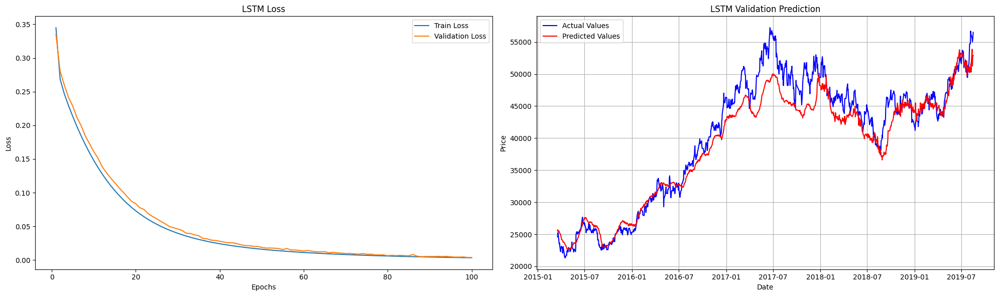

Before Inverse Scaling
MAE: 2023.0438
MSE: 7351975.2925
RMSE: 2711.4526
R²: 0.9253
--------------------
After Inverse Scaling
MAE: 0.0199
MSE: 0.0006
RMSE: 0.0252
R²: 0.9507
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


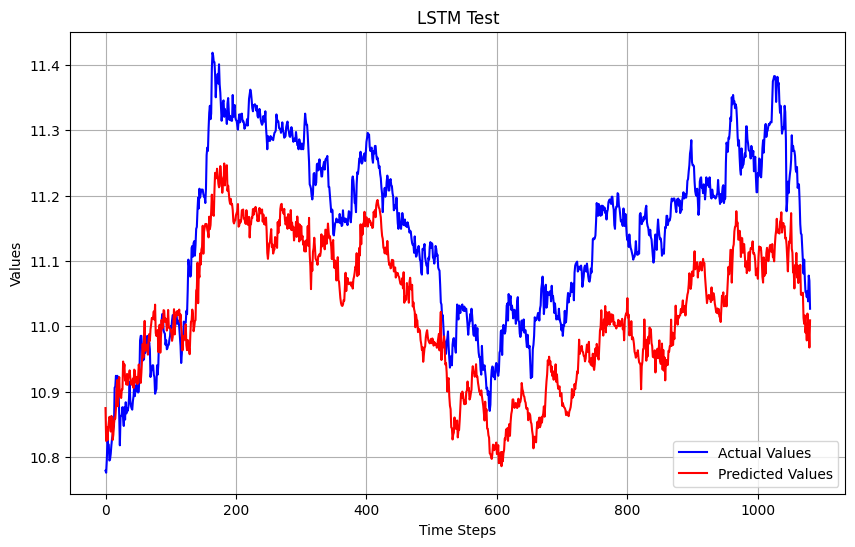

In [ ]:
#################### Loss and Val Predict #####################
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper25.predict(X_val) # 여기 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val = y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

################### Metric Calculation #############################
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

################### Test #######################
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper25.predict(X_test) # 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▄▄▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇█
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▆▅▅▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▆▆▅▅▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_mse,█▄▄▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,100
learning_rate,0.0001
train_loss,0.00347
train_mse,0.00038
val_loss,0.00369


##### 26

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper26", config={
    "epochs": 100,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [64, 32],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper26.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

conv1 = Conv1D(64, kernel_size=7, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.001), return_sequences=True)(pool1)

#skip1 = Add()([pool1, lstm1])

lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.001))(lstm1)

# skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
# skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)
# skip2 = Add()([skip1_reshaped, lstm2])

lstm2_adjusted = Dense(wandb.config.lstm_units[0])(lstm2)
skip2 = Add()([lstm1, lstm2_adjusted])

dense1 = Dense(32, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper26 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper26.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper26.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper26.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper26.summary()

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3792 - mse: 0.1930 - val_loss: 0.1974 - val_mse: 0.0179 - learning_rate: 1.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1816 - mse: 0.0045 - val_loss: 0.1828 - val_mse: 0.0129 - learning_rate: 1.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1699 - mse: 0.0025 - val_loss: 0.1686 - val_mse: 0.0083 - learning_rate: 1.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.1599 - mse: 0.0020 - val_loss: 0.1573 - val_mse: 0.0063 - learning_rate: 1.0000e-04
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.1503 - mse: 0.0015 - val_loss: 0.1480 - val_mse: 0.0059 - learning_rate: 1.0000e-04
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1413 - mse: 0.0013 - val_loss: 0.1393 - val_mse: 0.0057 - learning_rate: 1.0000e-04
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1328 - mse: 0.0011 - val_loss: 0.1318 - val_mse: 0.0061 - lear

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_4 (Conv1D)         │ (None, 84, 64)         │          7,680 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_4           │ (None, 42, 64)         │              0 │ conv1d_4[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_8 (LSTM)             │ (None, 42, 64)         │         33,024 │ max_pooling1d_4[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_9 (LSTM)             │ (None, 32)             │         12,416 │ lstm_8[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_9 (Dense)           │ (None, 64)             │          2,112 │ lstm_9[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_3 (Add)               │ (None, 42, 64)         │              0 │ lstm_8[0][0],          │
│                           │                        │                │ dense_9[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_10 (Dense)          │ (None, 42, 32)         │          2,080 │ add_3[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_11 (Dense)          │ (None, 42, 1)          │             33 │ dense_10[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 172,037 (672.02 KB)

 Trainable params: 57,345 (224.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 114,692 (448.02 KB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step


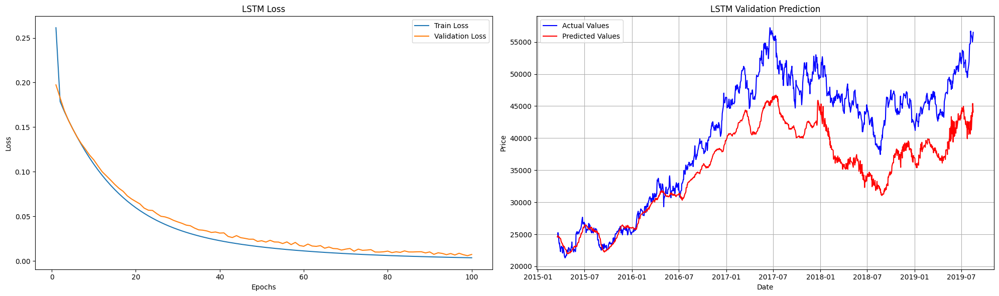

Before Inverse Scaling
MAE: 5306.0828
MSE: 41350875.3899
RMSE: 6430.4646
R²: 0.5797
--------------------
After Inverse Scaling
MAE: 0.0528
MSE: 0.0039
RMSE: 0.0626
R²: 0.6956
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


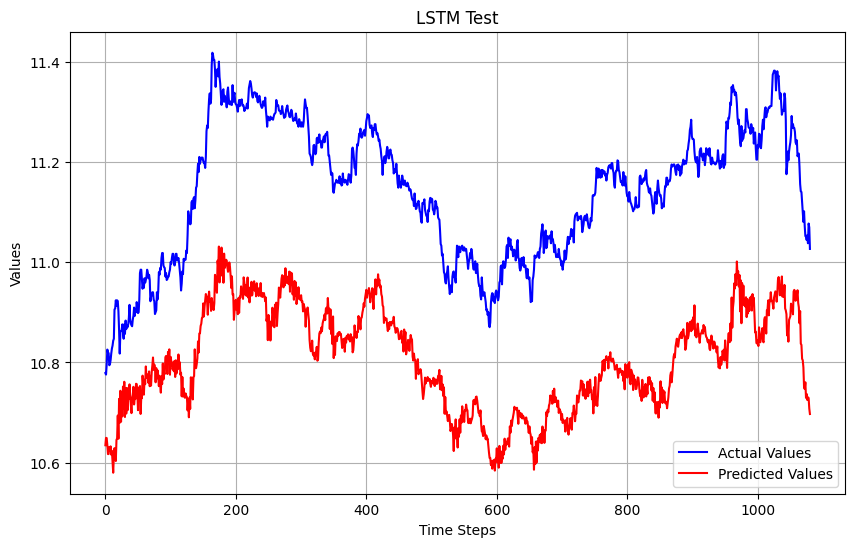

In [ ]:
#################### Loss and Val Predict #####################
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper26.predict(X_val) # 여기 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val = y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

################### Metric Calculation #############################
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

################### Test #######################
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper26.predict(X_test) # 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 27

In [ ]:
wandb.finish()

epoch,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇██
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,██▆▅▅▄▄▄▄▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,██▇▇▆▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_mse,█▂▂▂▃▃▄▄▄▃▃▄▄▄▄▄▃▄▄▃▃▃▃▃▄▂▁▂▃▁▂▁▁▂▂▂▂▂▁▁
epoch,100
learning_rate,0.0001
train_loss,0.00357
train_mse,0.00036
val_loss,0.00727


In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper27", config={
    "epochs": 100,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [64, 32],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper27.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

conv1 = Conv1D(64, kernel_size=7, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.002), return_sequences=True)(pool1)

#skip1 = Add()([pool1, lstm1])

lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.001))(lstm1)

# skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
# skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)
# skip2 = Add()([skip1_reshaped, lstm2])

lstm2_adjusted = Dense(wandb.config.lstm_units[0])(lstm2)
skip2 = Add()([lstm1, lstm2_adjusted])

dense1 = Dense(32, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper27 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper27.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper27.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper27.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper27.summary()

Epoch 1/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3829 - mse: 0.1027 - val_loss: 0.2857 - val_mse: 0.0295 - learning_rate: 1.0000e-04
Epoch 2/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.2500 - mse: 0.0018 - val_loss: 0.2518 - val_mse: 0.0272 - learning_rate: 1.0000e-04
Epoch 3/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2185 - mse: 0.0012 - val_loss: 0.2181 - val_mse: 0.0221 - learning_rate: 1.0000e-04
Epoch 4/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1905 - mse: 9.1980e-04 - val_loss: 0.1884 - val_mse: 0.0175 - learning_rate: 1.0000e-04
Epoch 5/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.1660 - mse: 7.6574e-04 - val_loss: 0.1641 - val_mse: 0.0152 - learning_rate: 1.0000e-04
Epoch 6/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.1446 - mse: 6.7539e-04 - val_loss: 0.1432 - val_mse: 0.0135 - learning_rate: 1.0000e-04
Epoch 7/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.1261 - mse: 5.9707e-04 - val_loss: 

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_5 (Conv1D)         │ (None, 84, 64)         │          7,680 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_5           │ (None, 42, 64)         │              0 │ conv1d_5[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_10 (LSTM)            │ (None, 42, 64)         │         33,024 │ max_pooling1d_5[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_11 (LSTM)            │ (None, 32)             │         12,416 │ lstm_10[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_12 (Dense)          │ (None, 64)             │          2,112 │ lstm_11[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_4 (Add)               │ (None, 42, 64)         │              0 │ lstm_10[0][0],         │
│                           │                        │                │ dense_12[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_13 (Dense)          │ (None, 42, 32)         │          2,080 │ add_4[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_14 (Dense)          │ (None, 42, 1)          │             33 │ dense_13[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 172,037 (672.02 KB)

 Trainable params: 57,345 (224.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 114,692 (448.02 KB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


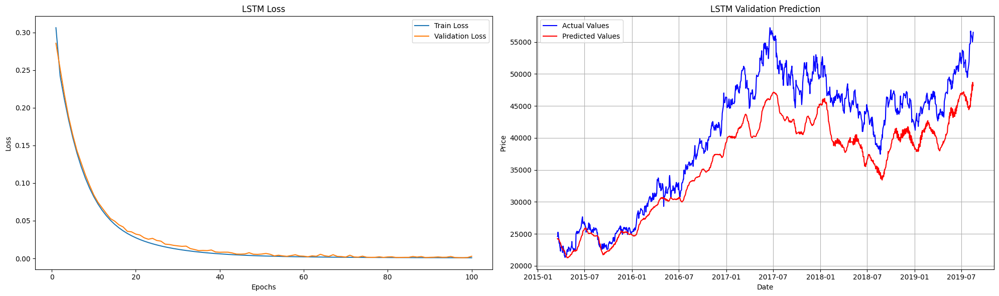

Before Inverse Scaling
MAE: 4471.0018
MSE: 27236626.1400
RMSE: 5218.8721
R²: 0.7232
--------------------
After Inverse Scaling
MAE: 0.0446
MSE: 0.0025
RMSE: 0.0499
R²: 0.8062
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


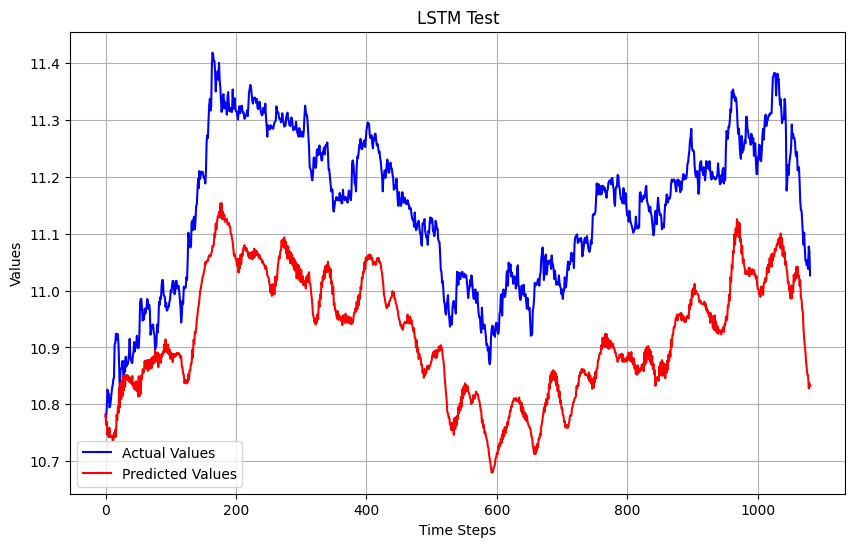

In [ ]:
#################### Loss and Val Predict #####################
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper27.predict(X_val) # 여기 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val = y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

################### Metric Calculation #############################
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

################### Test #######################
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper27.predict(X_test) # 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▇▆▅▅▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▆▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_mse,█▇▆▄▃▃▂▃▂▃▂▂▃▃▂▂▂▂▂▁▂▁▁▁▂▁▁▁▁▂▁▂▁▁▁▁▁▁▁▁
epoch,100
learning_rate,0.0001
train_loss,0.00083
train_mse,0.00035
val_loss,0.00282


##### 28

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper28", config={
    "epochs": 100,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper28.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

conv1 = Conv1D(64, kernel_size=7, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.002), return_sequences=True)(pool1)

#skip1 = Add()([pool1, lstm1])

lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.001))(lstm1)

# skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
# skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)
# skip2 = Add()([skip1_reshaped, lstm2])

lstm2_adjusted = Dense(wandb.config.lstm_units[0])(lstm2)
skip2 = Add()([lstm1, lstm2_adjusted])

dense1 = Dense(32, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper28 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper28.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper28.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper28.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper28.summary()

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.7209 - mse: 0.3290 - val_loss: 0.3834 - val_mse: 0.0132 - learning_rate: 1.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3685 - mse: 0.0059 - val_loss: 0.3481 - val_mse: 0.0084 - learning_rate: 1.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3345 - mse: 0.0021 - val_loss: 0.3151 - val_mse: 0.0042 - learning_rate: 1.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3054 - mse: 0.0014 - val_loss: 0.2895 - val_mse: 0.0055 - learning_rate: 1.0000e-04
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2788 - mse: 0.0011 - val_loss: 0.2662 - val_mse: 0.0068 - learning_rate: 1.0000e-04
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.2546 - mse: 0.0010 - val_loss: 0.2444 - val_mse: 0.0076 - learning_rate: 1.0000e-04
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.2324 - mse: 8.9503e-04 - val_loss: 0.2244 - val_mse: 0.0082 - 

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_6 (Conv1D)         │ (None, 84, 64)         │          7,680 │ input_layer_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_6           │ (None, 42, 64)         │              0 │ conv1d_6[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_12 (LSTM)            │ (None, 42, 128)        │         98,816 │ max_pooling1d_6[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_13 (LSTM)            │ (None, 64)             │         49,408 │ lstm_12[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_15 (Dense)          │ (None, 128)            │          8,320 │ lstm_13[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_5 (Add)               │ (None, 42, 128)        │              0 │ lstm_12[0][0],         │
│                           │                        │                │ dense_15[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_16 (Dense)          │ (None, 42, 32)         │          4,128 │ add_5[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_17 (Dense)          │ (None, 42, 1)          │             33 │ dense_16[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 505,157 (1.93 MB)

 Trainable params: 168,385 (657.75 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 336,772 (1.28 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


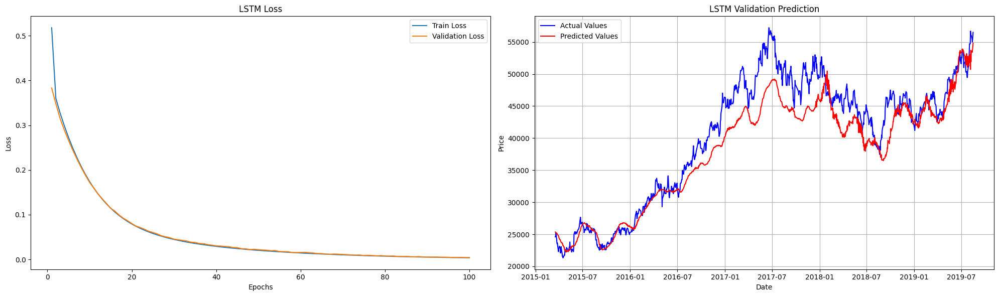

Before Inverse Scaling
MAE: 2601.1515
MSE: 11846642.6965
RMSE: 3441.8952
R²: 0.8796
--------------------
After Inverse Scaling
MAE: 0.0255
MSE: 0.0010
RMSE: 0.0321
R²: 0.9197
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


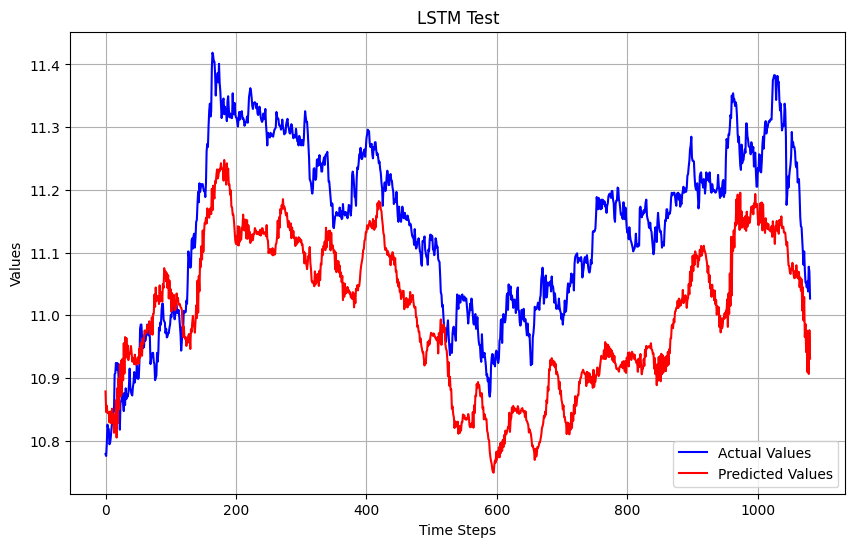

In [ ]:
#################### Loss and Val Predict #####################
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper28.predict(X_val) # 여기 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val = y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

################### Metric Calculation #############################
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

################### Test #######################
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper28.predict(X_test) # 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▇▆▅▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▇▆▅▅▄▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_mse,█▅▃▄▅▃▄▃▃▃▃▃▂▃▃▂▂▂▂▂▂▂▁▁▁▁▁▂▁▁▂▁▁▁▁▁▁▁▁▁
epoch,100
learning_rate,0.0001
train_loss,0.00379
train_mse,0.00042
val_loss,0.00434


##### 29

In [ ]:
wandb.finish()

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper29", config={
    "epochs": 100,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper29.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

conv1 = Conv1D(64, kernel_size=7, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.002), return_sequences=True)(pool1)

#skip1 = Add()([pool1, lstm1])

lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.001))(lstm1)

# skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
# skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)
# skip2 = Add()([skip1_reshaped, lstm2])

lstm2_adjusted = Dense(wandb.config.lstm_units[0])(lstm2)
skip2 = Add()([lstm1, lstm2_adjusted])

dense1 = Dense(64, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper29 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper29.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper29.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper29.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper29.summary()

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.4740 - mse: 0.0848 - val_loss: 0.4551 - val_mse: 0.0923 - learning_rate: 1.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3564 - mse: 0.0024 - val_loss: 0.3951 - val_mse: 0.0674 - learning_rate: 1.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3209 - mse: 0.0014 - val_loss: 0.3538 - val_mse: 0.0586 - learning_rate: 1.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.2886 - mse: 0.0011 - val_loss: 0.3194 - val_mse: 0.0540 - learning_rate: 1.0000e-04
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.2594 - mse: 9.3601e-04 - val_loss: 0.2843 - val_mse: 0.0458 - learning_rate: 1.0000e-04
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.2330 - mse: 7.8541e-04 - val_loss: 0.2560 - val_mse: 0.0418 - learning_rate: 1.0000e-04
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.2093 - mse: 7.3582e-04 - val_loss: 0.2274 - val_mse: 0

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7             │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_7 (Conv1D)         │ (None, 84, 64)         │          7,680 │ input_layer_7[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_7           │ (None, 42, 64)         │              0 │ conv1d_7[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_14 (LSTM)            │ (None, 42, 128)        │         98,816 │ max_pooling1d_7[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_15 (LSTM)            │ (None, 64)             │         49,408 │ lstm_14[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_18 (Dense)          │ (None, 128)            │          8,320 │ lstm_15[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_6 (Add)               │ (None, 42, 128)        │              0 │ lstm_14[0][0],         │
│                           │                        │                │ dense_18[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_19 (Dense)          │ (None, 42, 64)         │          8,256 │ add_6[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_20 (Dense)          │ (None, 42, 1)          │             65 │ dense_19[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 517,637 (1.97 MB)

 Trainable params: 172,545 (674.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 345,092 (1.32 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step


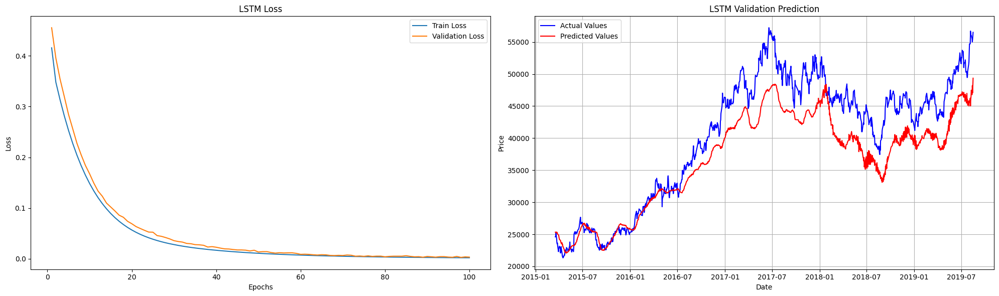

Before Inverse Scaling
MAE: 3866.6103
MSE: 22144458.6719
RMSE: 4705.7899
R²: 0.7749
--------------------
After Inverse Scaling
MAE: 0.0378
MSE: 0.0020
RMSE: 0.0446
R²: 0.8456
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


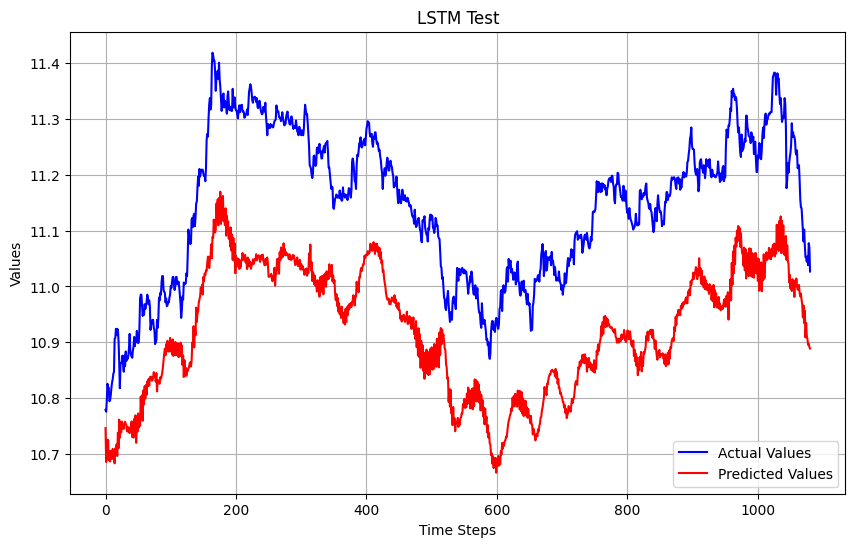

In [ ]:
#################### Loss and Val Predict #####################
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper29.predict(X_val) # 여기 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val = y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

################### Metric Calculation #############################
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

################### Test #######################
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper29.predict(X_test) # 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇████
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▇▆▆▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▇▆▅▄▄▃▃▂▄▂▂▂▂▂▂▂▂▂▂▃▂▂▁▁▂▁▂▁▂▁▂▂▁▂▁▂▁▁▁
val_loss,█▆▅▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_mse,█▇▆▅▅▄▄▃▄▄▃▃▃▃▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,100
learning_rate,0.0001
train_loss,0.00215
train_mse,0.0004
val_loss,0.00346


##### 30

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper30", config={
    "epochs": 100,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper30.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

conv1 = Conv1D(64, kernel_size=9, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.001), return_sequences=True)(pool1)

#skip1 = Add()([pool1, lstm1])

lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.001))(lstm1)

# skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
# skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)
# skip2 = Add()([skip1_reshaped, lstm2])

lstm2_adjusted = Dense(wandb.config.lstm_units[0])(lstm2)
skip2 = Add()([lstm1, lstm2_adjusted])

dense1 = Dense(64, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper30 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper30.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper30.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper30.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper30.summary()

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.3462 - mse: 0.0666 - val_loss: 0.2790 - val_mse: 0.0171 - learning_rate: 1.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2587 - mse: 0.0029 - val_loss: 0.2426 - val_mse: 0.0046 - learning_rate: 1.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2334 - mse: 0.0012 - val_loss: 0.2196 - val_mse: 0.0040 - learning_rate: 1.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2113 - mse: 9.3229e-04 - val_loss: 0.1985 - val_mse: 0.0034 - learning_rate: 1.0000e-04
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.1910 - mse: 7.4403e-04 - val_loss: 0.1796 - val_mse: 0.0032 - learning_rate: 1.0000e-04
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.1727 - mse: 6.8335e-04 - val_loss: 0.1630 - val_mse: 0.0036 - learning_rate: 1.0000e-04
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.1562 - mse: 6.8064e-04 - val_loss: 0.1470 - val_ms

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 90, 17)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_8 (Conv1D)         │ (None, 82, 64)         │          9,856 │ input_layer_8[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_8           │ (None, 41, 64)         │              0 │ conv1d_8[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_16 (LSTM)            │ (None, 41, 128)        │         98,816 │ max_pooling1d_8[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_17 (LSTM)            │ (None, 64)             │         49,408 │ lstm_16[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_21 (Dense)          │ (None, 128)            │          8,320 │ lstm_17[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_7 (Add)               │ (None, 41, 128)        │              0 │ lstm_16[0][0],         │
│                           │                        │                │ dense_21[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_22 (Dense)          │ (None, 41, 64)         │          8,256 │ add_7[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_23 (Dense)          │ (None, 41, 1)          │             65 │ dense_22[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 524,165 (2.00 MB)

 Trainable params: 174,721 (682.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 349,444 (1.33 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step


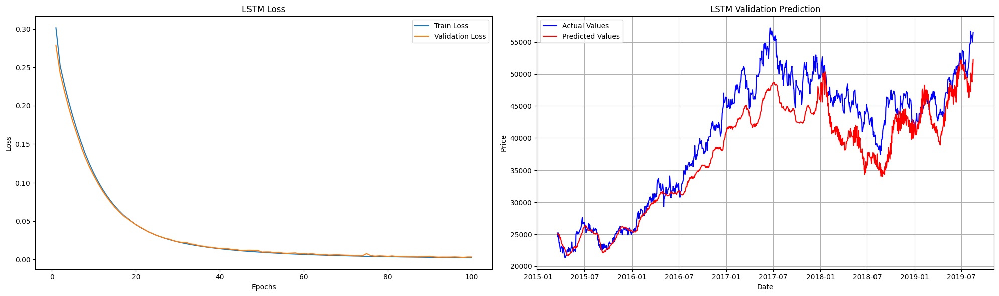

Before Inverse Scaling
MAE: 3223.8973
MSE: 16530141.4470
RMSE: 4065.7277
R²: 0.8320
--------------------
After Inverse Scaling
MAE: 0.0318
MSE: 0.0015
RMSE: 0.0386
R²: 0.8839
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


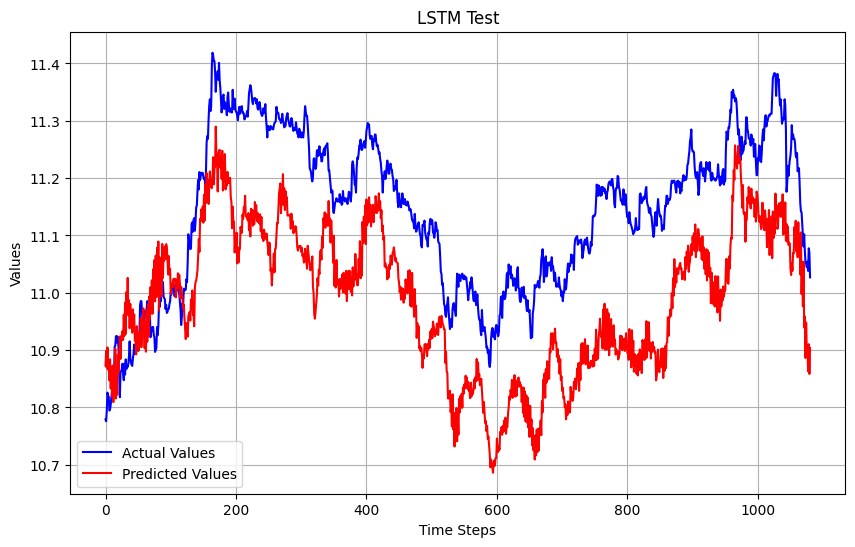

In [ ]:
#################### Loss and Val Predict #####################
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper30.predict(X_val) # 여기 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val = y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

################### Metric Calculation #############################
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

################### Test #######################
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper30.predict(X_test) # 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▁▂▂▂▂▂▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇██
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▆▆▄▄▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▆▅▅▄▄▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▂▁▁▂▁▁▁▂▁▁▂▁▁▁
val_loss,█▇▆▅▅▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_mse,█▇▆▆▄▄▃▃▂▃▂▂▄▃▂▂▃▂▃▁▂▃▂▁▂▂▃▂▂▂▁▂▁▁▁▁▁▂▁▂
epoch,100
learning_rate,0.0001
train_loss,0.00213
train_mse,0.00034
val_loss,0.00304


##### 31

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper30", config={
    "epochs": 100,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [128,64,32],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper30.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

conv1 = Conv1D(64, kernel_size=9, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.001), return_sequences=True)(pool1)

#skip1 = Add()([pool1, lstm1])

lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.001))(lstm1)

lstm2_adjusted = Dense(wandb.config.lstm_units[0])(lstm2)
skip2 = Add()([lstm1, lstm2_adjusted])

lstm3 = LSTM(wandb.config.lstm_units[1], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.001))(skip2)

lstm3_adjusted = Dense(wandb.config.lstm_units[0])(lstm3)
skip2 = Add()([lstm1, lstm3_adjusted])



dense1 = Dense(32, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper30 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper30.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper30.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper30.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper30.summary()

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.5945 - mse: 0.1453 - val_loss: 0.4648 - val_mse: 0.0431 - learning_rate: 1.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.4166 - mse: 0.0043 - val_loss: 0.4230 - val_mse: 0.0387 - learning_rate: 1.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3770 - mse: 0.0017 - val_loss: 0.3840 - val_mse: 0.0349 - learning_rate: 1.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3421 - mse: 0.0012 - val_loss: 0.3463 - val_mse: 0.0296 - learning_rate: 1.0000e-04
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3102 - mse: 0.0011 - val_loss: 0.3165 - val_mse: 0.0294 - learning_rate: 1.0000e-04
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.2809 - mse: 8.4571e-04 - val_loss: 0.2883 - val_mse: 0.0283 - learning_rate: 1.0000e-04
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.2545 - mse: 7.5517e-04 - val_loss: 0.2641 - val_mse: 0.02

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 90, 17)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d (Conv1D)           │ (None, 82, 64)         │          9,856 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d             │ (None, 41, 64)         │              0 │ conv1d[0][0]           │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm (LSTM)               │ (None, 41, 128)        │         98,816 │ max_pooling1d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_1 (LSTM)             │ (None, 64)             │         49,408 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 128)            │          8,320 │ lstm_1[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 41, 128)        │              0 │ lstm[0][0],            │
│                           │                        │                │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_2 (LSTM)             │ (None, 64)             │         49,408 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 128)            │          8,320 │ lstm_2[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_1 (Add)               │ (None, 41, 128)        │              0 │ lstm[0][0],            │
│                           │                        │                │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 41, 32)         │          4,128 │ add_1[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 41, 1)          │             33 │ dense_2[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 684,869 (2.61 MB)

 Trainable params: 228,289 (891.75 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 456,580 (1.74 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step


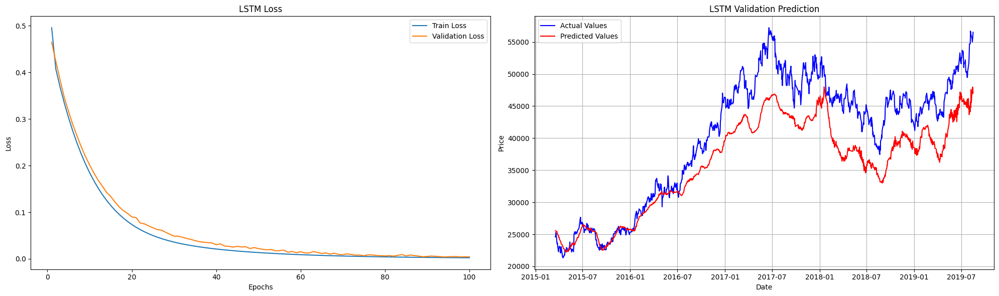

Before Inverse Scaling
MAE: 4436.3156
MSE: 28565805.4438
RMSE: 5344.6988
R²: 0.7097
--------------------
After Inverse Scaling
MAE: 0.0437
MSE: 0.0026
RMSE: 0.0511
R²: 0.7971
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


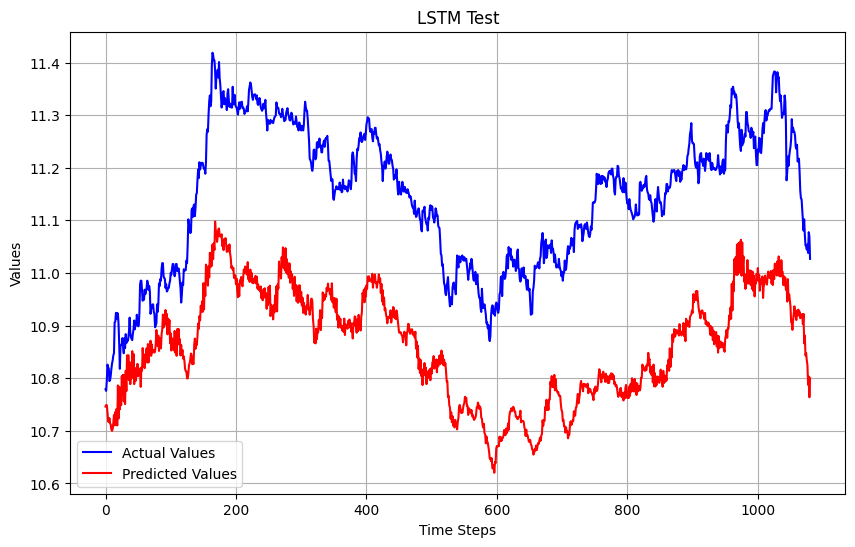

In [ ]:
#################### Loss and Val Predict #####################
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper30.predict(X_val) # 여기 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val = y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

################### Metric Calculation #############################
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

################### Test #######################
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper30.predict(X_test) # 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 31

In [ ]:
wandb.finish()

epoch,▁▁▁▁▁▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▇▇▆▅▄▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▇▆▆▅▄▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_mse,█▇▇▆▆▅▅▅▅▅▅▄▄▃▃▃▃▂▃▂▂▂▂▂▂▂▂▁▂▁▁▂▁▁▁▁▁▁▁▁
epoch,100
learning_rate,0.0001
train_loss,0.00235
train_mse,0.00034
val_loss,0.00456


In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper31", config={
    "epochs": 100,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [128,64,64],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper31.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

conv1 = Conv1D(64, kernel_size=9, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.001), return_sequences=True)(pool1)

#skip1 = Add()([pool1, lstm1])

lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.001))(lstm1)

lstm2_adjusted = Dense(wandb.config.lstm_units[0])(lstm2)
skip2 = Add()([lstm1, lstm2_adjusted])

lstm3 = LSTM(wandb.config.lstm_units[1], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.001))(skip2)

lstm3_adjusted = Dense(wandb.config.lstm_units[0])(lstm3)
skip2 = Add()([lstm1, lstm3_adjusted])



dense1 = Dense(64, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper31 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper31.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper31.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper31.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper31.summary()

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.6495 - mse: 0.1991 - val_loss: 0.4394 - val_mse: 0.0099 - learning_rate: 1.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4243 - mse: 0.0024 - val_loss: 0.4107 - val_mse: 0.0113 - learning_rate: 1.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3931 - mse: 0.0011 - val_loss: 0.3844 - val_mse: 0.0142 - learning_rate: 1.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3641 - mse: 9.3555e-04 - val_loss: 0.3569 - val_mse: 0.0144 - learning_rate: 1.0000e-04
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3367 - mse: 7.8965e-04 - val_loss: 0.3332 - val_mse: 0.0166 - learning_rate: 1.0000e-04
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.3112 - mse: 7.3607e-04 - val_loss: 0.3098 - val_mse: 0.0173 - learning_rate: 1.0000e-04
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.2875 - mse: 6.7013e-04 - val_loss: 0.2861 - val_ms

34/34 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step


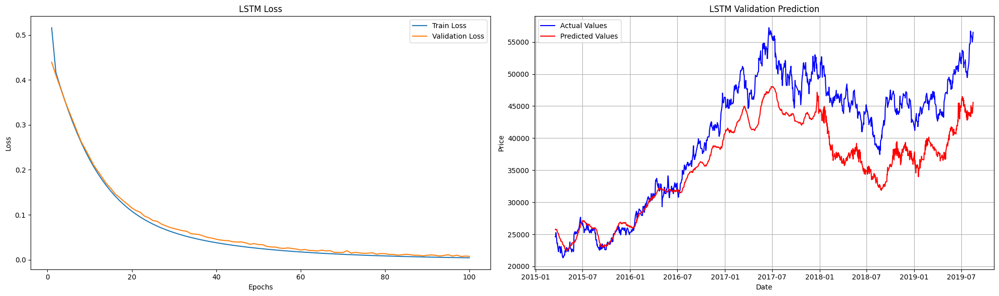

Before Inverse Scaling
MAE: 4778.8498
MSE: 33957800.8047
RMSE: 5827.3322
R²: 0.6549
--------------------
After Inverse Scaling
MAE: 0.0474
MSE: 0.0032
RMSE: 0.0565
R²: 0.7518
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


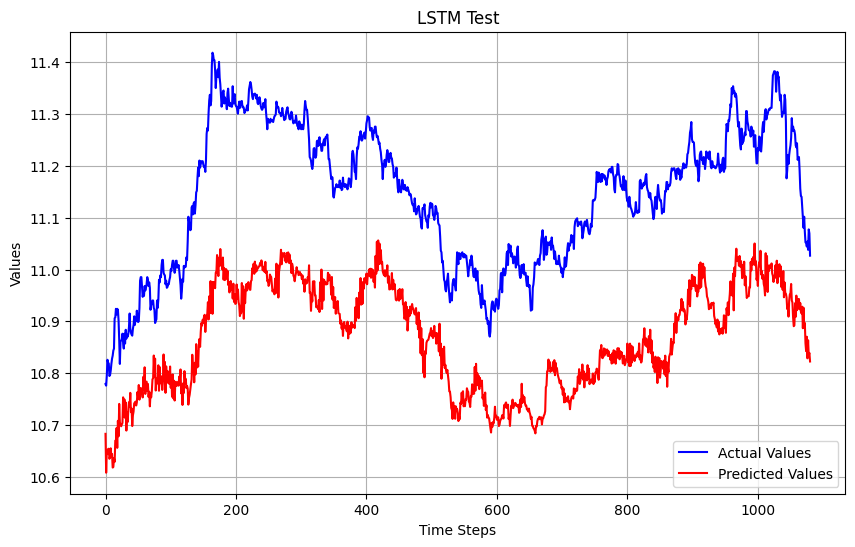

In [ ]:
#################### Loss and Val Predict #####################
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps) # 여기 val same, int 바꾸기

y_pred = model_int_hyper31.predict(X_val) # 여기 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
a,b = y_val, y_pred
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val = y_scaler_selected_int_df.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

################### Metric Calculation #############################
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

################### Test #######################
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_int_hyper31.predict(X_test) # 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_int_df.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇█████
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▇▆▅▅▄▄▄▄▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▄▄▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,██▇▇▆▅▅▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
val_mse,▅▇██▅▆▅▆▅▅▅▅▅▆▅▄▄▄▄▄▃▂▃▃▂▂▂▂▃▃▂▁▃▂▁▂▁▂▁▁
epoch,100
learning_rate,0.0001
train_loss,0.00429
train_mse,0.0004
val_loss,0.00759


##### 32

In [ ]:
wandb.finish()

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Int", name="hyper25", config={
    "epochs": 100,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [64, 32],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/int_hyper25.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

conv1 = Conv1D(64, kernel_size=7, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.002), return_sequences=True)(pool1)

#skip1 = Add()([pool1, lstm1])

lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.001))(lstm1)

# skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
# skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)
# skip2 = Add()([skip1_reshaped, lstm2])

lstm2_adjusted = Dense(wandb.config.lstm_units[0])(lstm2)
skip2 = Add()([lstm1, lstm2_adjusted])

dense1 = Dense(32, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.0001)
model_int_hyper25 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper25.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper25.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper25.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper25.summary()

### 액면분할 처리

In [ ]:
ss = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/Preprocessing_Code/사본/one_hot_int.csv')

In [ ]:
ss.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5862 entries, 0 to 5861
Data columns (total 47 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       5862 non-null   object 
 1   Open                       5862 non-null   float64
 2   High                       5862 non-null   float64
 3   Low                        5862 non-null   float64
 4   Close                      5862 non-null   float64
 5   Volume                     5862 non-null   float64
 6   Change                     5862 non-null   float64
 7   Transaction                5862 non-null   float64
 8   SE_Operating_Profit        5862 non-null   float64
 9   SE_Net_Profit              5862 non-null   float64
 10  SE_Total_Equity            5862 non-null   float64
 11  SE_Total_Liabilities       5862 non-null   float64
 12  SE_Revenue                 5862 non-null   float64
 13  SE_Foreign                 5862 non-null   float

In [ ]:
ss.head()

,Date,Open,High,Low,Close,Volume,Change,Transaction,SE_Operating_Profit,SE_Net_Profit,...,High_Low_Volatility,Lag_1,Lag_30,Lag_60,Lag_90,US_President_Republican,US_President_Democratic,KR_President_Democratic,KR_President_Conservative,KR_President_Neutral
0,2001-01-02,8.058327,8.125631,8.051978,8.116716,17.490706,0.304463,25.607421,29.836003,29.42326,...,-3.095450,8.116716,8.116716,8.116716,8.116716,True,False,True,False,False
1,2001-01-03,8.079928,8.137396,8.077137,8.122668,17.449330,0.304463,25.571998,29.837042,29.42326,...,-3.095450,8.116716,8.116716,8.116716,8.116716,True,False,True,False,False
2,2001-01-04,8.240121,8.261010,8.205218,8.237479,17.959753,1.027374,26.839751,29.838044,29.42326,...,-3.095450,8.122668,8.122668,8.122668,8.122668,True,False,True,False,False
3,2001-01-05,8.232174,8.273847,8.216088,8.268732,17.959753,1.750286,26.442709,29.839010,29.42326,...,-3.095450,8.237479,8.237479,8.237479,8.237479,True,False,True,False,False
4,2001-01-08,8.248006,8.271293,8.237479,8.263590,17.560192,-0.318066,25.823783,29.841696,29.42326,...,-3.396056,8.268732,8.268732,8.268732,8.268732,True,False,True,False,False


In [ ]:
ss['Date'] = pd.to_datetime(ss['Date'])
ss.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5862 entries, 0 to 5861
Data columns (total 47 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date                       5862 non-null   datetime64[ns]
 1   Open                       5862 non-null   float64       
 2   High                       5862 non-null   float64       
 3   Low                        5862 non-null   float64       
 4   Close                      5862 non-null   float64       
 5   Volume                     5862 non-null   float64       
 6   Change                     5862 non-null   float64       
 7   Transaction                5862 non-null   float64       
 8   SE_Operating_Profit        5862 non-null   float64       
 9   SE_Net_Profit              5862 non-null   float64       
 10  SE_Total_Equity            5862 non-null   float64       
 11  SE_Total_Liabilities       5862 non-null   float64       
 12  SE_Rev

In [ ]:
ss.set_index('Date', inplace = True)

In [ ]:
features = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction','SE_Operating_Profit', 'SE_Net_Profit', 'SE_Total_Equity',
       'SE_Total_Liabilities', 'SE_Revenue', 'SE_Foreign', 'US_Inflation', 'KR_Inflation', 'CN_Inflation', 'US_GDP_Annual', 'KR_GDP_Annual',
       'CN_GDP_Annual', 'US_Economic_Growth_Rate', 'KR_Economic_Growth_Rate', 'US_Base', 'US_10', 'KR_Base', 'KR_10', 'WTI', 'Exchange', 'SOX_Close',
       'Phone', 'KR_Unemployment', 'Covid19', 'US_President_Republican', 'US_President_Democratic', 'KR_President_Democratic', 'KR_President_Conservative', 'KR_President_Neutral',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1', 'Lag_30', 'Lag_60', 'Lag_90']
target = ['Close']

ss_features = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction', 'US_10', 'KR_Unemployment',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1', 'Lag_60', 'Lag_90']

In [ ]:
selected_x_train_ss = ss[ss_features][:3518].values
selected_y_train_ss = ss[target][:3518].values

selected_x_val_ss = ss[ss_features][3518:4691].values
selected_y_val_ss = ss[target][3518:4691].values

selected_x_test_ss = ss[ss_features][4691:].values
selected_y_test_ss = ss[target][4691:].values

x_scaler_selected_ss, y_scaler_selected_ss = MinMaxScaler(), MinMaxScaler()

selected_x_train_ss = x_scaler_selected_ss.fit_transform(selected_x_train_ss)
selected_y_train_ss = y_scaler_selected_ss.fit_transform(selected_y_train_ss.reshape(-1, 1))

selected_x_val_ss = x_scaler_selected_ss.transform(selected_x_val_ss)
selected_y_val_ss = y_scaler_selected_ss.transform(selected_y_val_ss.reshape(-1, 1))

selected_x_test_ss = x_scaler_selected_ss.transform(selected_x_test_ss)
selected_y_test_ss = y_scaler_selected_ss.transform(selected_y_test_ss.reshape(-1, 1))

In [ ]:
wandb.finish()

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Fin - Stock Split", name="hyper1", config={
    "epochs": 100,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [64, 32],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/ss_hyper1.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_ss, selected_y_train_ss, time_steps)
X_val, y_val = create_sequences(selected_x_val_ss, selected_y_val_ss, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(ss_features)))

conv1 = Conv1D(64, kernel_size=7, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.002), return_sequences=True)(pool1)

#skip1 = Add()([pool1, lstm1])

lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.002))(lstm1)

# skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
# skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)
# skip2 = Add()([skip1_reshaped, lstm2])

lstm2_adjusted = Dense(wandb.config.lstm_units[0])(lstm2)
skip2 = Add()([lstm1, lstm2_adjusted])

dense1 = Dense(32, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

optimizer = Adam(learning_rate=0.0001)
model_ss_hyper1 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_ss_hyper1.compile(optimizer=optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_ss_hyper1.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_ss_hyper1.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_ss_hyper1.summary()

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3874 - mse: 0.0172 - val_loss: 0.3516 - val_mse: 0.0045 - learning_rate: 1.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3406 - mse: 0.0012 - val_loss: 0.3214 - val_mse: 0.0045 - learning_rate: 1.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3105 - mse: 8.0276e-04 - val_loss: 0.2940 - val_mse: 0.0053 - learning_rate: 1.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.2827 - mse: 6.6476e-04 - val_loss: 0.2676 - val_mse: 0.0050 - learning_rate: 1.0000e-04
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2571 - mse: 6.0494e-04 - val_loss: 0.2434 - val_mse: 0.0048 - learning_rate: 1.0000e-04
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2336 - mse: 6.3985e-04 - val_loss: 0.2206 - val_mse: 0.0040 - learning_rate: 1.0000e-04
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2120 - mse: 5.8365e-04 - val_loss: 0.2017 - va

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step


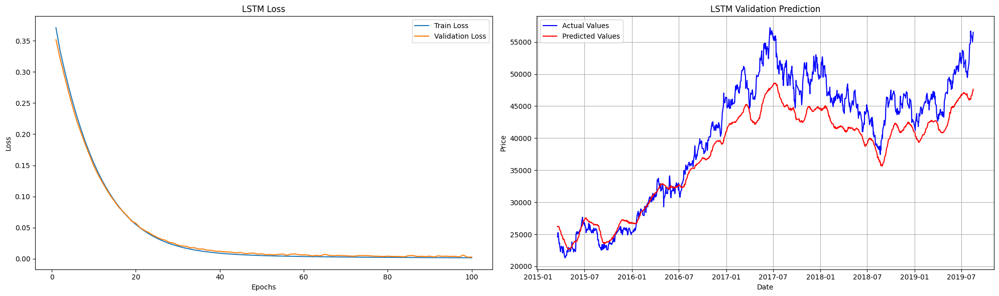

Before Inverse Scaling
MAE: 3241.6908
MSE: 15645153.6329
RMSE: 3955.3955
R²: 0.8410
--------------------
After Inverse Scaling
MAE: 0.0316
MSE: 0.0013
RMSE: 0.0366
R²: 0.8957
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


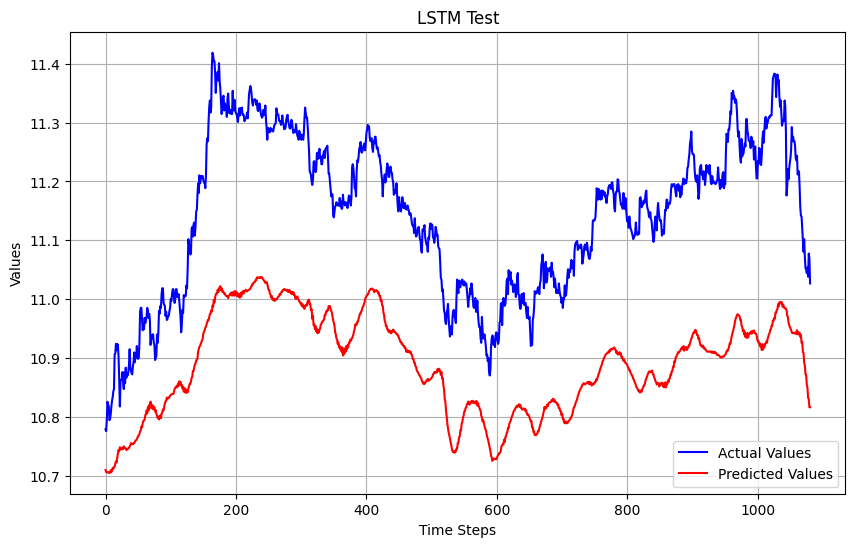

In [50]:
#################### Loss and Val Predict #####################
plt.figure(figsize = (20,6))

epochs = list(range(1, wandb.config.epochs + 1))

plt.subplot(1,2,1)
plt.plot(epochs, train_loss_history, label='Train Loss')
plt.plot(epochs, val_loss_history, label='Validation Loss')
plt.title('LSTM Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

X_val, y_val = create_sequences(selected_x_val_ss, selected_y_val_ss, time_steps) # 여기 val same, int 바꾸기

y_pred = model_ss_hyper1.predict(X_val) # 여기 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
a,b = y_val, y_pred
y_pred = y_scaler_selected_ss.inverse_transform(y_pred) # 여기 scaler 바꾸기
y_pred = np.round(np.exp(y_pred), 4)

y_val = y_scaler_selected_ss.inverse_transform(y_val) # 여기 scaler 바꾸기
y_val = np.round(np.exp(y_val), 4)

plt.subplot(1,2,2)
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_val), label='Actual Values', color = 'blue')
plt.plot(int_df[features][3518:4601].index, np.squeeze(y_pred), label='Predicted Values', color = 'red')
plt.title('LSTM Validation Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

################### Metric Calculation #############################
print("Before Inverse Scaling")
mse = mean_squared_error(y_val , y_pred )
rmse = np.sqrt(mean_squared_error(y_val , y_pred ))
mae = mean_absolute_error(y_val , y_pred )
r2 = r2_score(y_val , y_pred )

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

mse = mean_squared_error(a , b)
rmse = np.sqrt(mean_squared_error(a ,b))
mae = mean_absolute_error(a , b)
r2 = r2_score(a , b)

print('-' * 20)
print('After Inverse Scaling')
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

################### Test #######################
X_test, y_test = create_sequences(selected_x_test_ss, selected_y_test_ss, wandb.config.time_steps) # same, int data 바꾸기

y_pred = model_ss_hyper1.predict(X_test) # 모델 이름 바꾸기
if y_pred.ndim == 3:
    y_pred = y_pred[:, -1, :]
y_pred = y_scaler_selected_ss.inverse_transform(y_pred) # scaler 바꾸기
y_test = y_scaler_selected_ss.inverse_transform(y_test) # scaler 바꾸기

plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Actual Values', color = 'blue')
plt.plot(y_pred, label='Predicted Values', color = 'red')
plt.title('LSTM Test')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()